### Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
drive_dir = '/content/drive/MyDrive/AIF/'
file_path = 'Dataset_2.0_Akkodis_final.xlsx'
processed_file_path = 'Dataset_2.0_Akkodis_final_processed.xlsx'
best_models_dict = 'best_models.pkl'
best_params_nn_dict = "best_nn_params.pkl"
balanced_train_set_path ='balanced_train_set.xlsx'
balanced_train_set_rew_path ='balanced_train_set_rew.xlsx'
ctgan_file_path = 'ctgan_balanced.xlsx'

### Install requirements

In [3]:
source_path = drive_dir + 'requirements.txt'
!pip install -r {source_path}

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.8/51.8 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.3/133.3 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 30.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.3/475.3 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 31.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.2/241.2 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 5

### Imports

In [129]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import sklearn
import sklearn.base
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.utils import shuffle
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split, ParameterGrid, GridSearchCV, StratifiedKFold, RandomizedSearchCV, PredefinedSplit
from sklearn.linear_model import LinearRegression, Perceptron, LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report, confusion_matrix, make_scorer
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.feature_selection import SelectKBest, f_classif

import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Input, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras import backend as K
from tensorflow.keras.activations import sigmoid
from tensorflow.keras.metrics import AUC
from scipy.stats import chi2_contingency

from imblearn.over_sampling import ADASYN

from lime import lime_tabular
import shap
import joblib
import re
import time
import pickle
import os
from ctgan import CTGAN
import warnings
import random

random_seed = 42
random_state = 42

np.random.seed(random_seed)
tf.random.set_seed(random_seed)

###Utils

#####Visualization

In [4]:
def getPie(df, col, mapping, title=None):
    distribution = df[col].value_counts(normalize=True).sort_index()
    labels = [mapping[col][i] for i in distribution.index]
    if len(labels) == 2:
      sns.set_style("whitegrid")
      sns.set_palette("Paired")
      custom_colors = None
    else:
       custom_colors = ["#694494", "#7376e9", "#83c0e5", "#a1e782", "#fff199", "#f6ac72", "#db7676"]
       if len(labels) > 10:
          other_distrib = distribution[11:].sum()
          distribution = distribution[:11]
          distribution.loc['other'] = other_distrib
          labels = [mapping[col][i] if i != 'other' else 'other' for i in distribution.index] #Use mapping here, not reverse_mapping
          custom_colors = gradient_palette(custom_colors, len(labels))
       sns.set_style("whitegrid")
       sns.set_palette(custom_colors)

    fig, ax = plt.subplots(figsize=(8, 6))
    wedges, texts, autotexts = ax.pie(
        distribution, labels=None, autopct='%1.1f%%', startangle=140, colors = custom_colors,
        pctdistance=1.2, textprops={'fontsize': 12, 'rotation': -45}, wedgeprops={"edgecolor": "black"}
    )

    ax.legend(wedges, labels, title=col, loc="center left", bbox_to_anchor=(1, 0.5))
    if title is not None:
      plt.title(title, fontsize=16, pad=20)
    plt.show()

In [5]:
def plot_category_distributions(df, group_col, target_col, encoding_mappings, reverse_mapping):
    group_values = encoding_mappings[group_col]

    distribs = {}
    for group_key, encoded_value in group_values.items():
        distrib = df[df[group_col] == encoded_value][target_col].value_counts(normalize=True)
        if not distrib.empty:
            distribs[group_key] = distrib

    num_subplots = len(distribs)
    rows = num_subplots // 3 + (num_subplots % 3 > 0)
    cols = min(num_subplots, 3)
    plt.figure(figsize=(cols * 5, rows * 5))
    plt.rcParams.update({'font.size': 12})

    for i, (group_label, distribution) in enumerate(distribs.items()):
        ax = plt.subplot(rows, cols, i + 1)

        labels = [reverse_mapping[target_col][idx] for idx in distribution.index]
        colors = sns.color_palette("Paired")
        wedges, texts, autotexts = ax.pie(
            distribution, labels=None, autopct='%1.1f%%', startangle=140, colors=colors,
            pctdistance=1.2, textprops={'fontsize': 10}, wedgeprops={"edgecolor": "black"}
        )

        ax.legend(wedges, labels, title=target_col, loc="center left", bbox_to_anchor=(1, 0.5))
        ax.set_title(f'{target_col} distrib for {group_label} as {group_col.replace("_encoded", "")}')

    plt.tight_layout()
    plt.show()

In [6]:
import matplotlib.colors as mcolors

def blend_hex(color1, color2, ratio=0.5):
    """Restituisce un colore HEX intermedio tra color1 e color2."""
    rgb1 = mcolors.hex2color(color1)
    rgb2 = mcolors.hex2color(color2)

    blended_rgb = [(1 - ratio) * c1 + ratio * c2 for c1, c2 in zip(rgb1, rgb2)]
    return mcolors.to_hex(blended_rgb)

def gradient_palette(colors, num_colors):
    """Genera una palette di gradazioni con il numero esatto di colori richiesti."""
    new_palette = []
    total_pairs = len(colors) - 1

    if total_pairs == 0:
        return colors

    gradations_per_pair = (num_colors - 1) // total_pairs

    for i in range(total_pairs):
        start_color = colors[i]
        end_color = colors[i + 1]

        new_palette.append(start_color)

        for j in range(1, gradations_per_pair + 1):
            ratio = j / (gradations_per_pair + 1)
            new_palette.append(blend_hex(start_color, end_color, ratio))

    new_palette.append(colors[-1])

    remaining_colors = num_colors - len(new_palette)
    if remaining_colors > 0:
        for i in range(remaining_colors):
            new_palette.append(colors[-1])

    return new_palette



In [7]:
def plot_bar_norm(data_set, feature, target, reverse_mapping=None):
    #custom_colors = ["#694494", "#7376e9", "#83c0e5", "#a1e782", "#fff199", "#f6ac72", "#db7676"]
    custom_colors = ["#fff2bd", "#f4d797", "#ebb58a", "#da7f7d", "#b5728e", "#776e99", "#4a4874"]
    sns.set_style("whitegrid")
    sns.set_palette(custom_colors)

    pivot = data_set.pivot_table(index=feature, columns=target, aggfunc='size', fill_value=0 , observed=False)

    if reverse_mapping is not None and target in reverse_mapping:
        pivot.rename(columns=reverse_mapping[target], inplace=True)
    pivot_percentage = pivot.div(pivot.sum(axis=1), axis=0)
    if pivot.shape[1] == 2:
        sns.set_style("whitegrid")
        sns.set_palette("Paired")
        ax = pivot_percentage.plot(kind='bar', stacked=True, figsize=(12, 7),  edgecolor="black")
    elif pivot.shape[1] > len(custom_colors):
        new_palette = gradient_palette(custom_colors, pivot.shape[1])
        sns.set_style("whitegrid")
        sns.set_palette(new_palette)
        ax = pivot_percentage.plot(kind='bar', stacked=True, figsize=(12, 7), edgecolor='none')
    else:
        ax = pivot_percentage.plot(kind='bar', stacked=True, figsize=(12, 7), edgecolor="black")

    if isinstance(feature, list):
        if reverse_mapping is not None:
          xticklabels = pivot_percentage.index.map(lambda x: ', '.join(str(reverse_mapping[feature[i]][f]).split(',')[0] for i,f in enumerate(x))).tolist()
        else:
          xticklabels = pivot_percentage.index.map(lambda x: ', '.join(x)).tolist()

        for i, p in enumerate(ax.patches):
            if i % 2 == 0:
                p.set_x(p.get_x() + 0.2)
            else:
                p.set_x(p.get_x() - 0.2)

        values = [label.split(',')[1] for label in xticklabels]
        values = values[:2]
        xticklabels = [label.split(',')[0] for label in xticklabels]

        xticklabels[1::2] = [''] * (len(xticklabels) // 2)

        ax.set_xticklabels(xticklabels, rotation=45, ha='center')

        xticks = ax.get_xticks()
        ax.set_xticks(xticks[::2])


    else:
        if reverse_mapping is not None and feature in reverse_mapping.keys():
            xticklabels = reverse_mapping[feature].values()
        else:
            xticklabels = ax.get_xticklabels()
        ax.set_xticklabels(xticklabels, rotation=45, ha='center')

    if isinstance(feature, list):
      values=', '.join(values)
      plt.title(f'{target} by {feature} (Normalized)\n\n{feature[1]}: {values} ', fontsize=16, pad=20)
    else:
      plt.title(f'{target} by {feature} (Normalized)', fontsize=16, pad=20)
    plt.ylabel('Proportion', fontsize=14)
    plt.xlabel(feature, fontsize=14)

    plt.legend(title=target, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

    ax.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()


In [8]:
def getHist(df, col, reverse_mapping=None, order=None, kind='bar', title =None):
    counts = df[col].value_counts()
    counts_df = pd.DataFrame(counts.items(), columns=[col, 'Count'])
    prefix = ''
    counts_df['Count'] = pd.to_numeric(counts_df['Count'])
    counts_df = counts_df.sort_values(by='Count', ascending=False)

    if counts_df.shape[0] > 20:
        counts_df = counts_df.head(20)
        prefix = 'Top 20 '

    colors = sns.color_palette("Paired")

    if reverse_mapping is not None:
        labels = [reverse_mapping[col][int(float(i))] for i in counts_df[col]]
        labels = [s.title() for s in labels]
    else:
        labels = counts_df[col]

    if kind == 'bar':
        counts_df.plot(x=col, y='Count', kind=kind, legend=False, color=colors[1])
        plt.xticks(range(len(counts_df[col])), labels, ha='center')
        plt.ylabel('Frequency')
    else:
        counts_df = counts_df.sort_values(by='Count', ascending=True)
        plt.barh(counts_df[col].astype(str), counts_df['Count'], color=colors[1])
        labels = labels[::-1]
        plt.yticks(range(len(counts_df[col])), labels, ha='right')
        plt.xlabel('Frequency')

    if title is not None:
      plt.title(title)
    else:
      plt.title(f'{prefix}{col} Distribution')
    plt.show()


#####shap explanations

In [9]:
import shap
import numpy as np
import tensorflow as tf

def create_nn_explanations(model, X):
    X_np = X.to_numpy().astype(np.float32)  # Converti in array NumPy

    background_data = shap.sample(X_np, 100)

    def predict_proba(X):
        X_tensor = tf.convert_to_tensor(X, dtype=tf.float32)  # Converti in tensore
        predictions = model.predict(X_tensor, verbose=0)
        return tf.keras.activations.sigmoid(predictions).numpy()

    explainer = shap.KernelExplainer(predict_proba, background_data)
    shap_values = explainer.shap_values(X_np[:10])  # Calcola SHAP su 10 campioni
    return np.squeeze(shap_values), X[:10]


In [10]:
def create_ml_explanations(model, X):
    if isinstance(model, (DecisionTreeClassifier, RandomForestClassifier)):
        explainer = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(X)

        # Controllo se il modello è multiclasse
        if isinstance(shap_values, list):
            shap_values = shap_values[1]  # Se è una lista, prendo i valori della classe 1 (positivo)

        return shap_values, X

    else:
        explainer = shap.Explainer(model, X)
        return explainer(X), X


In [11]:
def create_nn_explanations(model, X):
    background_data = shap.sample(X, 100)

    def predict_proba(X):
        try:
          predictions = model.predict(X, verbose=0)
        except:
          predictions = model.predict(X)
        if predictions.shape[1] == 1:
          return tf.keras.activations.sigmoid(predictions).numpy()
        return predictions
    explainer = shap.KernelExplainer(predict_proba, background_data, verbose=0)
    shap_values = explainer.shap_values(X.values[:10])
    return np.squeeze(shap_values), X[:10]

def create_ml_explanations(model, X):
    if isinstance(model, (DecisionTreeClassifier, RandomForestClassifier)):
        explainer = shap.TreeExplainer(model)
    else:
        explainer = shap.Explainer(model, X)

    explanations = explainer(X)
    return explanations, X


In [12]:
def create_explanations(model, X, name):
    if isinstance(model, (tf.keras.Sequential, tf.keras.Model, CustomKerasClassifier)):
        return create_nn_explanations(model, X)
    return create_ml_explanations(model, X)

In [13]:
def summaryPlot(model, X, plot_type, plot_name, indices=None, sample_size=100):
    if indices is None:
        X_sample = X.sample(min(sample_size, len(X)))  # Evita errori se X è piccolo
    else:
        X_sample = X.iloc[indices].sample(min(sample_size, len(X.iloc[indices])))

    explanations, X_sample = create_explanations(model, X_sample, plot_name)
    print(explanations)
    # Get feature names before any potential modification to X_sample
    feature_names = X_sample.columns.tolist()

    # Check if explanations is a 3D array
    if explanations.ndim == 3:
        # Assuming binary classification, take explanations for class 1
        explanations = explanations[:, 1, :]
    elif isinstance(explanations, list) and explanations and isinstance(explanations[0], np.ndarray) and explanations[0].ndim == 3:
        # Assuming binary classification and list of explanations for each class
        explanations = [exp[:, 1, :] for exp in explanations]
        # Take explanation for the target class (index 1 for binary classification)
        explanations = explanations[1]
    elif isinstance(explanations, list):  # Check if explanations is still a list
        explanations = np.array(explanations)  # Convert to numpy array if it is
    print("new exp",explanations)
    fig, ax = plt.subplots()
    plt.title(plot_name)

    shap.summary_plot(
        explanations, X_sample, feature_names=feature_names,
        show=False, plot_type=plot_type, max_display=X_sample.shape[1]
    )

    plt.tight_layout()
    plt.show()
    plt.close()

#####training

In [14]:
def reweight_dataset(X_train, y_train, sensitive_features, random_seed=None):
    if random_seed is not None:
        np.random.seed(random_seed)

    group_counts = X_train.groupby(sensitive_features).size()
    group_weights = 1 / group_counts
    group_weights /= group_weights.sum()

    sample_weights = X_train[sensitive_features].apply(tuple, axis=1).map(group_weights)

    sample_weights /= sample_weights.sum()

    reweighted_indices = np.random.choice(
        X_train.index,
        size=len(X_train),
        replace=True,
        p=sample_weights)
    X_train_reweighted = X_train.loc[reweighted_indices]
    y_train_reweighted = y_train.loc[reweighted_indices]

    return X_train_reweighted, y_train_reweighted


In [15]:
def fit_predict_model(name, model, X_train, y_train, X_test, y_test, metrics, predictions):
    print(f"Fitting {name}...")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    if name in ['Linear Regression', 'XGBoost']:
        y_proba = y_pred
        y_pred = (y_proba > 0.5).astype(int)
    elif hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_proba = y_pred

    predictions[name] = y_pred

    accuracy = round(accuracy_score(y_test, y_pred), 3)
    precision = round(precision_score(y_test, y_pred, zero_division=0), 3)
    recall = round(recall_score(y_test, y_pred, zero_division=0), 3)
    f1 = round(f1_score(y_test, y_pred), 3)
    roc_auc = round(roc_auc_score(y_test, y_proba), 3)

    if sum(y_pred) == 0:
        print(f"Warning: No positive predictions for {name}. Precision and Recall may be ill-defined.")

    metrics.append({
        'Model': name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'ROC AUC': roc_auc
    })

In [64]:
def fit_nn(name, seed, neural_models, histories, X_train, y_train, X_validation = None, y_validation = None, best_params = None, early_stopping=None):
    print(f"Fitting model {name}...")
    np.random.seed(seed)
    tf.random.set_seed(seed)
    model = CustomKerasClassifier(input_shape=(X_train.shape[1],), neurons = best_params['neurons'], activation = best_params['activation'],
                                  optimizer = best_params['optimizer'], batch_size = best_params['batch_size'], epochs = best_params['epochs'],learning_rate = best_params['learning_rate'],
                                  )
    neural_models.append(model)
    if X_validation is not None and y_validation is not None:
      validation_data=(X_validation, y_validation)
    else:
      validation_data = None
    if early_stopping is not None:
      model.fit(X_train, y_train, validation_data , early_stopping=early_stopping)
    else:
      model.fit(X_train, y_train, validation_data)
    history = model.get_history()
    histories.append(history)
    print(f"Model {name} fitted.\n")


In [17]:
def predict_nn(name, model, X_test, neural_predictions):
    print(f"Predicting with model {name}...")
    y_pred = (model.predict(X_test) > 0.5).astype('int32')
    neural_predictions[name] = y_pred
    print(f"Predictions from model {name} stored.\n\n")

In [18]:
def plot_val_train(h, name):
  metrics = ['loss','accuracy','auc','recall','precision']
  metric_keys = []
  count = 0
  for m in metrics:
    key = re.compile(re.escape(m))
    if any(key.search(k) for k in list(h.keys())):
      count += 1
      keys = [k for k in h.keys() if key.search(k)]
      metric_keys.append(keys)

  if count == 0:
    return

  plt.figure(figsize=(12, 6))

  for i in range(count):
    plt.subplot(1, count, i+1)
    plt.plot(h[metric_keys[i][0]])
    plt.plot(h[metric_keys[i][1]])
    plt.title(f'{name} {metrics[i]}')
    plt.ylabel(metrics[i])
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')

  plt.tight_layout()
  plt.show()

In [19]:
def calc_nn_metrics(y_pred, y_test, nn_metrics, name):
  y_pred_binary = (y_pred > 0.5).astype(int)

  cr = classification_report(y_test, y_pred_binary, output_dict=True)

  nn_metrics.append({
      'model': name,
      'accuracy': cr['accuracy'],
      'precision': cr['macro avg']['precision'],
      'recall': cr['macro avg']['recall'],
      'f1_score': cr['macro avg']['f1-score'],
      'roc_auc': roc_auc_score(y_test, y_pred_binary)
  })

#####fairness metrics

In [20]:
def calculate_demographic_parity(predictions, y_test, name, significance_level, tolerance, X_test, activate_check=False, model = None):

    df = pd.DataFrame({
        'predictions': predictions,
        'sensitive_attribute': X_test[name]
    })

    positive_proportions = df.groupby('sensitive_attribute')['predictions'].mean()
    num_class = positive_proportions.shape[0]
    min_proportion = positive_proportions.min()
    max_proportion = positive_proportions.max()
    percentage_difference = (max_proportion - min_proportion)
    discr_gr = reverse_mapping[name][positive_proportions.index[positive_proportions.values.argmin()]]

    if num_class == 2:

        if activate_check == True and percentage_difference > tolerance:
            print("===============================UNFAIR!===============================")
            print(f"Model {model} unfair wrt {name}")
            print(f"{reverse_mapping[name][0]}: {positive_proportions[0]}")
            print(f"{reverse_mapping[name][1]}: {positive_proportions[1]}")
            print(f"Model unfair to: {discr_gr}")
            print("=====================================================================\n\n")
        if percentage_difference <= tolerance:
            return True
        else:
            return discr_gr

    if num_class > 2:
        contingency_table = pd.crosstab(df['predictions'], df['sensitive_attribute'])
        chi2, p, dof, expected = chi2_contingency(contingency_table)

        if activate_check == True and p <= significance_level:
            print("===============================UNFAIR!===============================")
            print(f"Model {model} unfair wrt {name}")
            if (expected < 5).any():
                print(f"Sparse contigency for {name}")
            else:
              for i in range(len(positive_proportions)):
                print(f"{reverse_mapping[name][i]}: {positive_proportions[i]}")
              print(f"Model unfair to: {discr_gr}")

            print("=====================================================================\n\n")
        if p > significance_level:
            return True
        else:
            return discr_gr

In [220]:
def calculate_equalized_odds(predictions, true_labels, name, significance_level, tolerance, X_test, activate_check=False, model = None):
    df = pd.DataFrame({
        'predictions': predictions,
        'true_labels': true_labels,
        'sensitive_attribute': X_test[name]
    })

    groups = df['sensitive_attribute'].unique()
    metrics = {}
    for group in groups:
        group_df = df[df['sensitive_attribute'] == group]
        cm = confusion_matrix(group_df['true_labels'], group_df['predictions'], labels=[0, 1])
        tn, fp, fn, tp = cm.ravel()
        if tp + fn == 0:
            print(f"\n\nThere are no positive examples for the group {reverse_mapping[name][group]} in the test set")
        if fp + tn == 0:
            print(f"\n\nThere are no negative examples for the group{reverse_mapping[name]} {group} in the test set")
        tpr = tp / (tp + fn) if tp + fn != 0 else 0
        fpr = fp / (fp + tn) if fp + tn != 0 else 0
        metrics[group] = {'TPR': tpr, 'FPR': fpr}

    tprs = [metrics[group]['TPR'] for group in groups]
    fprs = [metrics[group]['FPR'] for group in groups]

    max_tpr_diff = max(tprs) - min(tprs)
    max_fpr_diff = max(fprs) - min(fprs)

    tpr_within_tolerance = max_tpr_diff <= tolerance*2
    fpr_within_tolerance = max_fpr_diff <= tolerance*2
    result = tpr_within_tolerance and fpr_within_tolerance
    discr_gr_tpr = reverse_mapping[name][min(metrics, key=lambda g: metrics[g]['TPR'])]
    tpr_discr_gr = metrics[min(metrics, key=lambda g: metrics[g]['TPR'])]['TPR']
    discr_gr_fpr = reverse_mapping[name][min(metrics, key=lambda g: metrics[g]['FPR'])]
    fpr_discr_gr = metrics[min(metrics, key=lambda g: metrics[g]['FPR'])]['FPR']
    if activate_check == True and result == False:
        max_tpr_group = max(metrics, key=lambda g: metrics[g]['TPR'])
        min_tpr_group = min(metrics, key=lambda g: metrics[g]['TPR'])
        max_fpr_group = max(metrics, key=lambda g: metrics[g]['FPR'])
        min_fpr_group = min(metrics, key=lambda g: metrics[g]['FPR'])
        print("===============================UNFAIR!===============================")
        print(f"Model {model} unfair wrt {name}")
        if tpr_within_tolerance == False:
            print(f"Maximum TPR difference: {max_tpr_diff:.4f} between group {reverse_mapping[name][max_tpr_group]} and group {reverse_mapping[name][min_tpr_group]}")
            print(f"Model unfair to: {discr_gr_tpr}")
        if fpr_within_tolerance == False:
            print(f"Maximum FPR difference: {max_fpr_diff:.4f} between group {reverse_mapping[name][max_fpr_group]} and group {reverse_mapping[name][min_fpr_group]}")
            print(f"Model unfair to: {discr_gr_fpr}")
        print("TPR and FPR for each group:")
        for group, metric in metrics.items():
            print(f"Group {reverse_mapping[name][group]}: TPR={metric['TPR']:.4f}, FPR={metric['FPR']:.4f}")
        print("=====================================================================\n\n")
    if result == False:
      if tpr_within_tolerance == False and fpr_within_tolerance == False:
        if discr_gr_fpr == discr_gr_tpr:
          return f"{discr_gr_tpr} [TPR={tpr_discr_gr}/FPR={fpr_discr_gr}]"
        else:
          return f"{discr_gr_tpr} [TPR={tpr_discr_gr}], {discr_gr_fpr} [FPR={fpr_discr_gr}]"
      elif tpr_within_tolerance == False:
        return f"{discr_gr_tpr} [TPR={tpr_discr_gr}]"
      else:
        return f"{discr_gr_fpr} [FPR={fpr_discr_gr}]"
    else:
      return True

In [22]:
def calculate_counterfactual_fairness(predictions, y_test, name, significance_level, tolerance, X_test, model=None, activate_check=False, X_test_selected=None):
    df = pd.DataFrame({
        'predictions': predictions,
        'sensitive_attribute': X_test[name]
    })
    if X_test_selected is not None:
        counterfactual_df = X_test_selected.copy()
        counterfactual_df = counterfactual_df[X_test_selected.columns]
        if name not in counterfactual_df.columns:
          return True
    else:
      counterfactual_df = X_test.copy()
    delta = {}
    consistency = {}

    for group in df['sensitive_attribute'].unique():
        #counterfactual_df.loc[:, name] = group
        counterfactual_df[name] = group
        '''if hasattr(model, 'model') and isinstance(model.model, (tf.keras.Sequential, tf.keras.Model)):
            new_preds = model.predict(counterfactual_df, verbose=0)
        else:
            new_preds = model.predict(counterfactual_df)'''
        new_preds = model.predict(counterfactual_df)
        if len(np.unique(new_preds)) > 2:
            new_preds = (new_preds > 0.5).astype(int)

        consistency[group] = 1 - np.mean(np.abs(predictions - new_preds))

        n_old = np.sum(predictions)
        n_new = np.sum(new_preds)
        delta[group] = (n_new - n_old) / len(predictions)

    most_inconsistent_group = min(consistency, key=consistency.get)
    counterfactual_consistency = consistency[most_inconsistent_group]

    most_discriminated_group = min(delta, key=delta.get)
    delta_min = delta[most_discriminated_group]
    most_privileged_group = max(delta, key=delta.get)
    delta_max = delta[most_privileged_group]

    is_fair = (delta_max - delta_min < tolerance) and (counterfactual_consistency >= (1 - tolerance))

    if activate_check:
        if not is_fair:
            print("===============================UNFAIR!===============================")
        else:
            print("=====================================================================")
        print(f"Model {model} unfair wrt Counterfactual Fairness on {name}")
        print(f"Counterfactual consistency: {counterfactual_consistency:.4f}")
        print(f"Most inconsistent group: {reverse_mapping[name][most_inconsistent_group]} {delta[most_inconsistent_group]:.4f}")
        print(f"Most discriminated group: {reverse_mapping[name][most_discriminated_group]} {delta_min:.4f}")
        print(f"Most privileged group: {reverse_mapping[name][most_privileged_group]} {delta_max:.4f}")
        print(f"Direction of bias (negative = worse, positive = better)")
        print("=====================================================================\n\n")

    if not is_fair:
        return f" {reverse_mapping[name][most_discriminated_group]} [{round(delta_min*100, 2)}%], {reverse_mapping[name][most_privileged_group]} [{round(delta_max*100, 2)}%]"

    return True

In [23]:
def getFairnessTab(fn, models, sensitive_features, predictions, index, X_test, y_test, significance_level, tolerance, verbose=False, X_test_selected= None):
    table = []

    for model_name in index:
        temp = []
        for i in range(len(sensitive_features)):
            model_predictions = predictions[model_name]
            if model_name in ['Logistic Regression', 'Gaussian Naive Bayes', 'Linear Perceptron', 'K Nearest Neighbor', 'Random forest'] and X_test_selected is not None:
                output = fn(
                    model_predictions,
                    y_test,
                    sensitive_features[i],
                    significance_level,
                    tolerance,
                    X_test,
                    model=models[model_name],
                    activate_check=verbose,
                    X_test_selected=X_test_selected
                )
            else:
                output = fn(
                    model_predictions,
                    y_test,
                    sensitive_features[i],
                    significance_level,
                    tolerance,
                    X_test,
                    model=models[model_name],
                    activate_check=verbose
                )

            if output == True:
                temp.append('')
            else:
                temp.append(output)
        table.append(temp)

    return pd.DataFrame(table, index=index, columns=sensitive_features)


###Classes

In [61]:
class CustomKerasClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, input_shape, neurons=10, activation='relu', optimizer='adam', batch_size=32, epochs=20, learning_rate=0.001):
        self.input_shape = input_shape
        self.neurons = neurons
        self.activation = activation
        self.optimizer = optimizer
        self.batch_size = batch_size
        self.epochs = epochs
        self.learning_rate = learning_rate
        #self._estimator_type = type(KerasClassifier)

    def build_tf_model(self):
        model = Sequential([
            Input(shape=self.input_shape),
            Dense(self.neurons, activation=self.activation),
            BatchNormalization(),
            Dropout(0.4),
            Dense(self.neurons, activation=self.activation),
            BatchNormalization(),
            Dropout(0.4),
            Dense(self.neurons//2, activation=self.activation),
            BatchNormalization(),
            Dense(1)
        ])

        if self.optimizer == 'adam':
            optimizer_fn = Adam
        elif self.optimizer == 'rmsprop':
            optimizer_fn = tf.keras.optimizers.RMSprop
        elif self.optimizer == 'sgd':
            optimizer_fn = tf.keras.optimizers.SGD
        else:
            raise ValueError(f"Unknown optimizer: {self.optimizer}")


        model.compile(optimizer=optimizer_fn(learning_rate=self.learning_rate),
                      loss= BinaryCrossentropy(from_logits=True),
                      metrics=['accuracy'])
        return model

    def fit(self, X, y, validation_data=None, early_stopping=None):
        self.classes_ = np.unique(y)
        self.model = self.build_tf_model()
        class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y), y=y)
        class_weights_dict = dict(enumerate(class_weights))

        if validation_data is not None:
          X_val, y_val = validation_data
          if early_stopping is not None:
            self.history = self.model.fit(X, y, epochs=self.epochs,
                          batch_size=self.batch_size, verbose=1,
                          validation_data=(X_val, y_val),
                          callbacks=[early_stopping],
                          class_weight=class_weights_dict)
          else:
            self.history = self.model.fit(X, y, epochs=self.epochs,
                          batch_size=self.batch_size, verbose=1,
                          validation_data=(X_val, y_val),
                          class_weight=class_weights_dict)

        else:
          self.model.fit(X, y, epochs=self.epochs,
                         batch_size=self.batch_size, verbose=1,
                         class_weight=class_weights_dict)
          self.history = None
        return self

    def predict(self, X, verbose=1):
        y_pred_proba = self.model.predict(X, verbose = verbose)
        return (y_pred_proba > 0.5).astype('int32').flatten()

    def predict_proba(self, X):
        y_pred_proba = self.model.predict(X)
        y_pred_proba = sigmoid(y_pred_proba)
        y_pred_proba = y_pred_proba.numpy()
        y_pred_proba = y_pred_proba.reshape(-1, 1)
        return np.hstack([1 - y_pred_proba, y_pred_proba])


    def score(self, X, y):
        y_pred_proba = self.predict_proba(X)[:, 1]
        return roc_auc_score(y, y_pred_proba)

    def get_params(self, deep=True):
        return {'input_shape': self.input_shape,
                'neurons': self.neurons,
                'activation': self.activation,
                'optimizer': self.optimizer,
                'batch_size': self.batch_size,
                'epochs': self.epochs,
                'learning_rate': self.learning_rate}

    def get_history(self):
        return self.history


## Dataset Import

In [101]:
df = pd.read_excel(drive_dir + file_path)

print(f"There are {df['Id'].unique().shape[0]} candidates\n")

print(f"Total number of rows: {df.shape[0]}\n")

print(f"HIRED distribution: \n\n{df.groupby('Id')['Hired'].first().value_counts()}\n\n")

df.head()

There are 2973 candidates

Total number of rows: 8424

HIRED distribution: 

Hired
0    2478
1     495
Name: count, dtype: int64




,Id,Candidate State,Age Range,Sex,Protected Category,Tag,Study Area,Study Title,Years Experience,Sector,...,Residence_coord,Assumption_coord,Distance (km),Position_Info,Similarity_Score,Similarity_Score_Study_Area,Study_Title_Score,Similarity_Score_Last_Role,Years_Exp_Score,Ral_Score
0,4,hired,26 - 30 years,male,no,"catia (harness, part design, sheet metal), cat...",aeronautical/aerospace/astronautics engineering,professional qualification,[3-5],railway,...,"(40.90689555, 14.39335586)","(45.54749699, 11.54597109)",564.975442,wiring harness architecture engineer engineeri...,0.09,0.07,-0.29,0.0,0.17,0.00
1,62,hired,26 - 30 years,male,no,"c#, c, c#, vectorcast, testing, vectorcast",electronic engineering,three-year degree,[1-3],railway,...,"(40.79461702, 16.7525404)","(41.12559562, 16.86737016)",38.006184,vv tc engineer tech consulting solutions advan...,0.06,1.00,0.00,0.0,0.00,-0.07
2,98,hired,26 - 30 years,male,no,"autocad, gt power, hypermesh, mechanical engin...",mechanical engineering,three-year degree,[0],others,...,"(45.0732745, 7.68068748)","(45.0732745, 7.68068748)",0.000000,powertrain calibration engineer engineering ju...,0.11,0.16,-0.14,0.0,-0.03,0.00
3,152,hired,> 45 years,female,yes,not specified,other,middle school diploma,[+10],others,...,"(45.0732745, 7.68068748)","(45.0732745, 7.68068748)",0.000000,internship cleaning cat prot enabling function...,0.00,0.00,0.00,0.0,1.00,0.00
4,165,hired,26 - 30 years,male,no,"angular, javascript.",informatics,three-year degree,[1-3],telecom,...,"(43.83219044, 11.19842773)","(44.4943668, 11.3417208)",74.465310,frontend developer tech consulting solutions c...,0.18,1.00,0.00,0.0,0.00,-0.07


##Data Set
Some columns will be dropped either because they would not be available (i.e. Candidate State) or because of redundancy.

In [ ]:
data_set = df.copy()

columns_to_drop = ['Candidate State', 'Tag' , 'Recruitment Request', 'Last Role',
                   'Job Description', 'Candidate Profile', 'Year Of Insertion', 'Year Of Recruitment',
                   'Job Title Hiring', 'Years Experience.1', 'Study Level', 'Study Area.1',
                   'Job ID', 'Residence_coord', 'Assumption_coord', 'Assumption Headquarters', 'Residence Italian City',
                   'Candidate_Info', 'Position_Info', 'Akkodis Headquarters', 'Job Family Hiring', 'Linked_Search__Key']

data_set = data_set.drop(columns=columns_to_drop)

for col in data_set.columns:
  print(f"{col}: \n {data_set[col].unique()}")

Id: 
 [    4    62    98 ... 81622 81623 81630]
Age Range: 
 ['26 - 30 years' '> 45 years' '< 20 years' '36 - 40 years' '20 - 25 years'
 '31 - 35 years' '40 - 45 years']
Sex: 
 ['male' 'female']
Protected Category: 
 ['no' 'yes']
Study Area: 
 ['aeronautical/aerospace/astronautics engineering'
 'electronic engineering' 'mechanical engineering' 'other' 'informatics'
 'computer engineering' 'biomedical engineering' 'industrial engineering'
 'chemical engineering' 'economic - statistics' 'surveyor'
 'automotive engineering' 'automation/mechatronics engineering'
 'chemist - pharmaceutical' 'other humanities subjects'
 'other scientific subjects' 'political-social' 'management engineering'
 'electrical engineering' 'telecommunications engineering'
 'energy and nuclear engineering' 'psychology' 'information engineering'
 'accounting' 'communication sciences' 'mathematics' 'literary'
 'civil/civil and environmental engineering'
 'humanistic high school diploma' 'linguistics'
 'agriculture and

##Preprocessing
### Categorical - Numerical mapping

In [ ]:
ral_mapping = {
     '-20k': 10,
     '20-22k': 21,
     '22-24k': 23,
     '24-26k': 25,
     '26-28k': 27,
     '28-30k': 29,
     '30-32k': 31,
     '32-34k': 33,
     '34-36k': 35,
     '36-38k': 37,
     '38-40k': 39,
     '40-42k': 41,
     '42-44k': 43,
     '44-46k': 45,
     '46-48k': 47,
     '48-50k': 49,
     '+50k': 70,
     'not specified': 'not specified'
}

for col in data_set.columns:
  if 'Ral' in col and col != 'Ral_Score':
     data_set[col] = data_set[col].map(ral_mapping)

years_exp_mapping = {
    '[0]': 0,
    '[0-1]': 0.5,
    '[1-3]': 2,
    '[3-5]': 4,
    '[5-7]': 6,
    '[7-10]': 8.5,
    '[+10]': 20
}

data_set['Years Experience'] = data_set['Years Experience'].map(years_exp_mapping)

### Encoding of categorical columns

In [ ]:
categorical_columns = ['Sex', 'Age Range', 'Protected Category', 'Study Area', 'Study Title',
                       'Sector', 'Residence Country', 'Residence Italian Region', 'Residence Italian Province',
                       'European Residence', 'Italian Residence']
numerical_columns = [col for col in data_set.columns if col not in categorical_columns]

In [ ]:
encoding_mappings = {}

encoding_mappings['Age Range_encoded'] = {
    '< 20 years': 0,
    '20 - 25 years': 1,
    '26 - 30 years': 2,
    '31 - 35 years': 3,
    '36 - 40 years': 4,
    '40 - 45 years': 5,
    '> 45 years': 6
}

data_set['Age Range_encoded'] = data_set['Age Range'].map(encoding_mappings['Age Range_encoded'])
data_set = data_set.drop(columns='Age Range')

categorical_columns.remove('Age Range')

encoding_mappings['Study Title_encoded'] = {
    'middle school diploma': 0,
    'professional qualification': 1,
    'high school graduation': 2,
    'three-year degree': 3,
    'five-year degree': 4,
    'master\'s degree': 5,
    'doctorate': 6
}

data_set['Study Title_encoded'] = data_set['Study Title'].map(encoding_mappings['Study Title_encoded'])
data_set = data_set.drop(columns='Study Title')

categorical_columns.remove('Study Title')

for col in categorical_columns:
  label_encoder = LabelEncoder()
  data_set[f"{col}_encoded"] = label_encoder.fit_transform(data_set[col])
  encoding_mappings[f"{col}_encoded"] = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

data_set = data_set.drop(columns=categorical_columns)

encoding_mappings['Hired'] = {'Not Hired': 0, 'Hired': 1}

reverse_mapping = {}

for col, mapping in encoding_mappings.items():
    reverse_mapping[col] = {v: k for k, v in mapping.items()}

###NaN handling

'not specified' values for numerical columns are replaced with the mean value.

In [ ]:
cols_to_drop = []
for col in data_set.columns:
  n = data_set[data_set[col] == 'not specified'].shape[0] / data_set.shape[0]
  if n >0:
    print(f"{col} with {n}")
    if n>0.5:
      cols_to_drop.append(col)

Overall with 0.10826210826210826
Minimum Ral with 0.6617996201329535
Ral Maximum with 0.5969848053181387
Current Ral with 0.7672127255460589
Expected Ral with 0.7965337132003799
Technical Skills with 0.11075498575498575
Standing/Position with 0.10968660968660969
Communication with 0.11004273504273504
Maturity with 0.10968660968660969
Dynamism with 0.1103988603988604
Mobility with 0.10933048433048433
English with 0.1111111111111111


In [ ]:
not_spec_col = []

for col in data_set.columns:
  if 'not specified' in data_set[col].unique() :
    not_spec_col.append(col)

for col in not_spec_col:
  if col in numerical_columns:
    data_set[col] = pd.to_numeric(data_set[col], errors='coerce')
    mean_val = data_set[col].dropna().mean()
    if pd.isna(mean_val):
      mean_val = 0
    else:
      mean_val = round(mean_val)

    data_set[col] = data_set[col].replace('not specified', mean_val)
    data_set[col] = data_set[col].fillna(mean_val)

for col in not_spec_col:
  print(type(data_set[col][0]))
  print(f"{col}: {data_set[col].unique()}")

<class 'numpy.float64'>
Overall: [3. 2. 4. 1.]
<class 'numpy.float64'>
Minimum Ral: [25. 29. 23. 21. 10. 31. 27. 37. 33. 39. 41. 35. 70.]
<class 'numpy.float64'>
Ral Maximum: [35. 31. 25. 30. 29. 27. 21. 10. 33. 37. 49. 41. 45. 39. 43. 70. 23.]
<class 'numpy.float64'>
Current Ral: [29. 23. 33. 35. 10. 27. 31. 25. 21. 70. 39. 43. 37. 41. 45. 49. 47.]
<class 'numpy.float64'>
Expected Ral: [36. 33. 27. 41. 21. 29. 23. 31. 37. 25. 70. 39. 35. 43. 10. 45. 47. 49.]
<class 'numpy.float64'>
Technical Skills: [3. 2. 1. 4.]
<class 'numpy.float64'>
Standing/Position: [2. 3. 4. 1.]
<class 'numpy.float64'>
Communication: [2. 3. 4. 1.]
<class 'numpy.float64'>
Maturity: [2. 3. 4. 1.]
<class 'numpy.float64'>
Dynamism: [3. 2. 4. 1.]
<class 'numpy.float64'>
Mobility: [3. 2. 1. 4.]
<class 'numpy.float64'>
English: [3. 4. 2. 1.]


### Standardization

In [ ]:
for col in numerical_columns:
  print(f"{col}: {np.sort(data_set[col].unique().tolist())}")

Id: [    4     8    24 ... 81622 81623 81630]
Years Experience: [ 0.   0.5  2.   4.   6.   8.5 20. ]
Overall: [1. 2. 3. 4.]
Minimum Ral: [10. 21. 23. 25. 27. 29. 31. 33. 35. 37. 39. 41. 70.]
Ral Maximum: [10. 21. 23. 25. 27. 29. 30. 31. 33. 35. 37. 39. 41. 43. 45. 49. 70.]
Current Ral: [10. 21. 23. 25. 27. 29. 31. 33. 35. 37. 39. 41. 43. 45. 47. 49. 70.]
Expected Ral: [10. 21. 23. 25. 27. 29. 31. 33. 35. 36. 37. 39. 41. 43. 45. 47. 49. 70.]
Technical Skills: [1. 2. 3. 4.]
Standing/Position: [1. 2. 3. 4.]
Communication: [1. 2. 3. 4.]
Maturity: [1. 2. 3. 4.]
Dynamism: [1. 2. 3. 4.]
Mobility: [1. 2. 3. 4.]
English: [1. 2. 3. 4.]
Hired: [0 1]
Distance (km): [0.00000000e+00 5.58543808e+00 6.26429597e+00 ... 1.06825131e+04
 1.20911732e+04 1.21102667e+04]
Similarity_Score: [0.   0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13
 0.14 0.15 0.16 0.17 0.18 0.19 0.2  0.21 0.22 0.23 0.25 0.26 0.27 0.28
 0.29 0.3  0.31 0.33 0.34 0.35 0.37 0.38 0.39 0.4  0.42 0.46 0.5  0.54
 0.55 0.6 

###Std Scaler

In [ ]:
columns_to_standardize = ['Years Experience', 'Minimum Ral', 'Ral Maximum', 'Current Ral',
                          'Expected Ral', 'Distance (km)']

scaler = StandardScaler()

for col in columns_to_standardize:
  data_set[f"{col}_not_std"] = data_set[col]

data_set[columns_to_standardize] = scaler.fit_transform(data_set[columns_to_standardize])

for col in columns_to_standardize:
    encoding_mappings[col] = {
        row[f"{col}_not_std"]: round(row[col], 2) for _, row in data_set.iterrows()
    }

for col in columns_to_standardize:
  data_set = data_set.drop(columns=f"{col}_not_std")

data_set[columns_to_standardize] = round(data_set[columns_to_standardize], 2)
reverse_mapping = {}
for col, mapping in encoding_mappings.items():
    reverse_mapping[col] = {v: k for k, v in mapping.items()}

In [ ]:
years_exp_rev_mapping = {
    v: k for k, v in years_exp_mapping.items()
}

In [ ]:
for k, v in reverse_mapping['Years Experience'].items():
  reverse_mapping['Years Experience'][k] = years_exp_rev_mapping[v]

##Export

In [ ]:
with open(drive_dir+"encoding_mappings.pkl", 'wb') as f:
    pickle.dump(encoding_mappings, f)

with open(drive_dir+"reverse_mappings.pkl", 'wb') as f:
    pickle.dump(reverse_mapping, f)

In [ ]:
data_set.to_excel(drive_dir+processed_file_path, index=False)

In [28]:
data_set = pd.read_excel(drive_dir+processed_file_path)

In [29]:
with open(drive_dir+"encoding_mappings.pkl", 'rb') as f:
    encoding_mappings = pickle.load(f)

with open(drive_dir+"reverse_mappings.pkl", 'rb') as f:
    reverse_mapping = pickle.load(f)

In [30]:
categorical_columns = ['Sex', 'Age Range', 'Protected Category', 'Study Area', 'Study Title',
                       'Sector', 'Residence Country', 'Residence Italian Region', 'Residence Italian Province',
                       'European Residence', 'Italian Residence']

## Correlation matrix

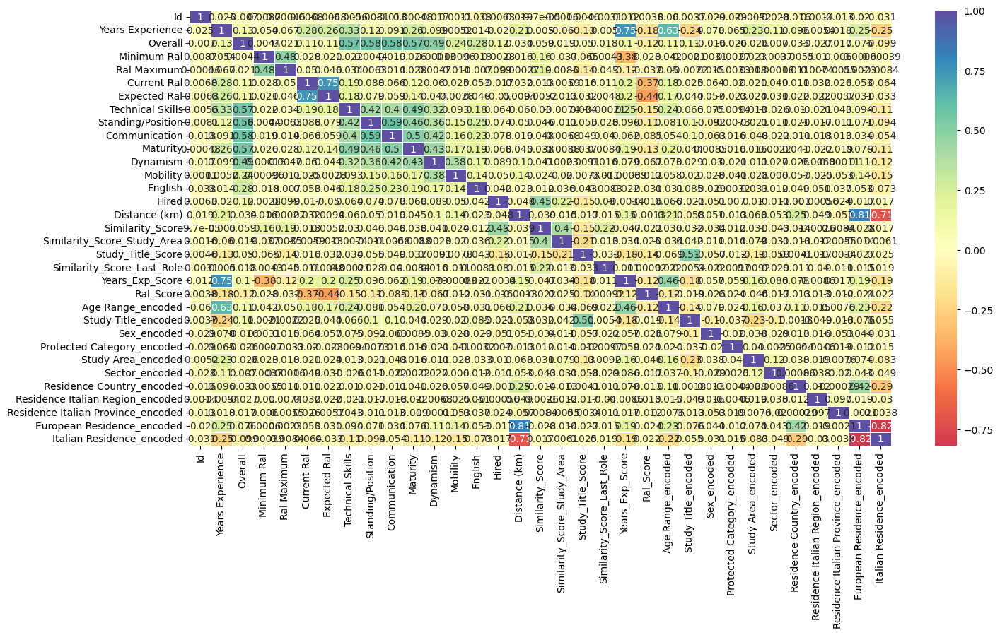

In [ ]:
# Correlation matrix
corr_matrix = data_set.corr()
plt.figure(figsize=(16, 8))
sns.heatmap(corr_matrix, annot=True, cmap=sns.color_palette("Spectral", as_cmap=True), center=0, linewidths=.5)
plt.show()

##Data Analysis

###Hired

In [ ]:
data_set['Hired'].value_counts()

,count
Hired,
0,7929
1,495


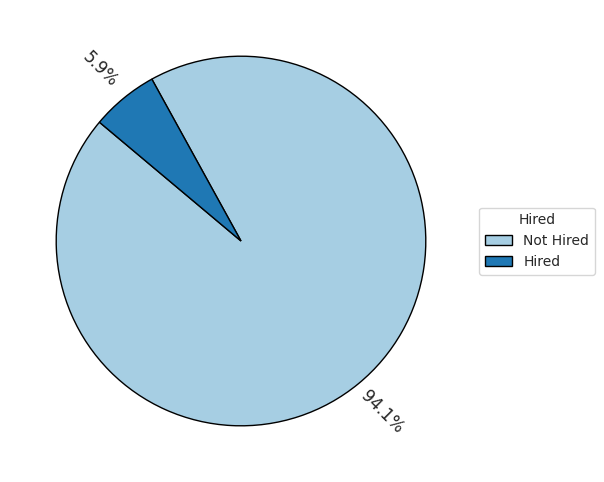

In [ ]:
getPie(data_set, 'Hired', reverse_mapping)

###Sex

In [ ]:
data_set['Sex_encoded'].value_counts()

,count
Sex_encoded,
1,6776
0,1648


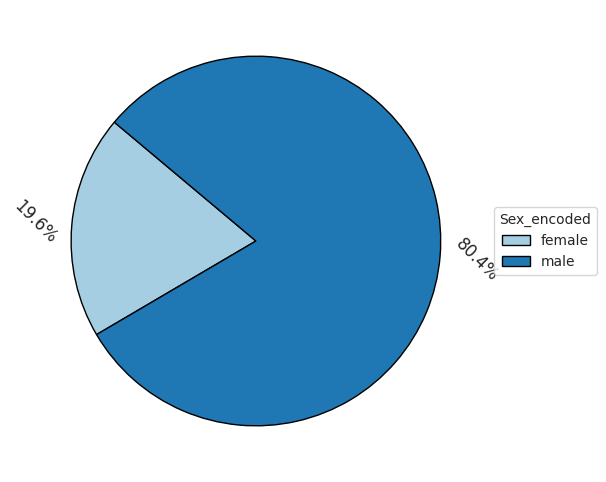

In [ ]:
getPie(data_set, 'Sex_encoded', reverse_mapping)

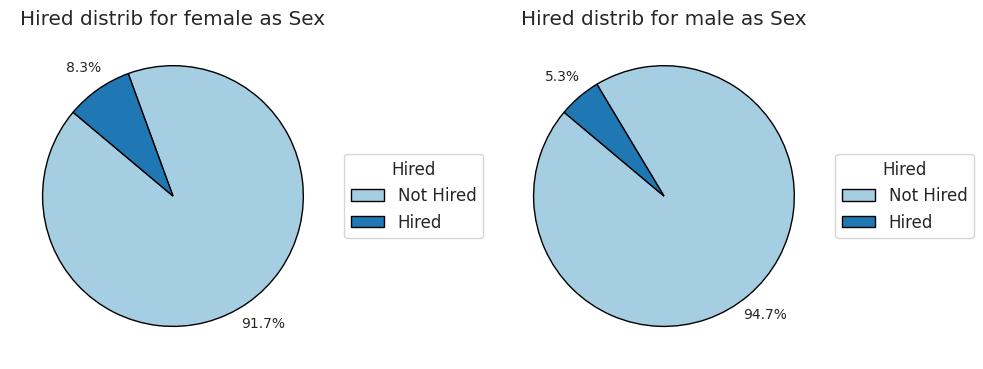

In [ ]:
plot_category_distributions(data_set, 'Sex_encoded', 'Hired', encoding_mappings, reverse_mapping)

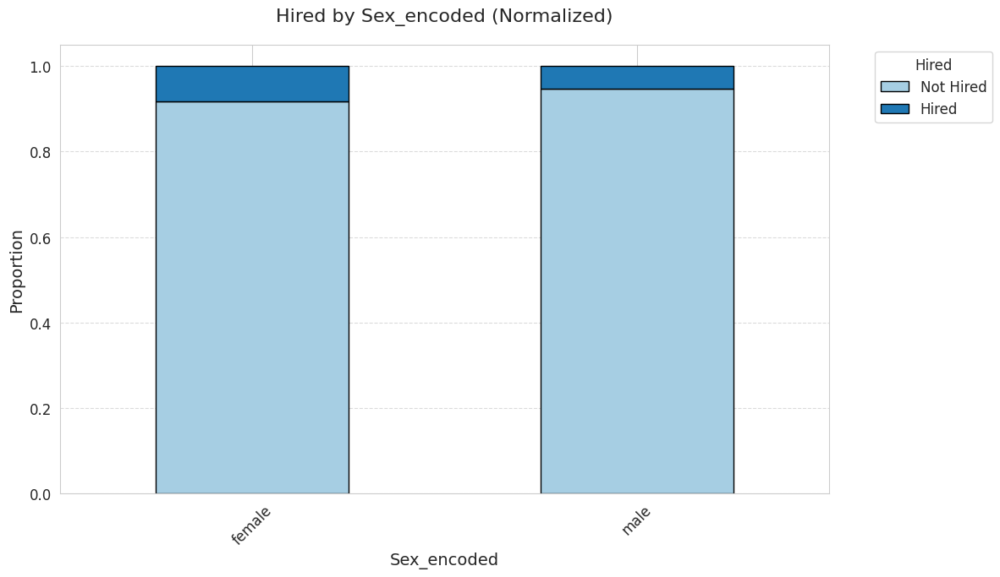

In [ ]:
plot_bar_norm(data_set, 'Sex_encoded', 'Hired',reverse_mapping=reverse_mapping)

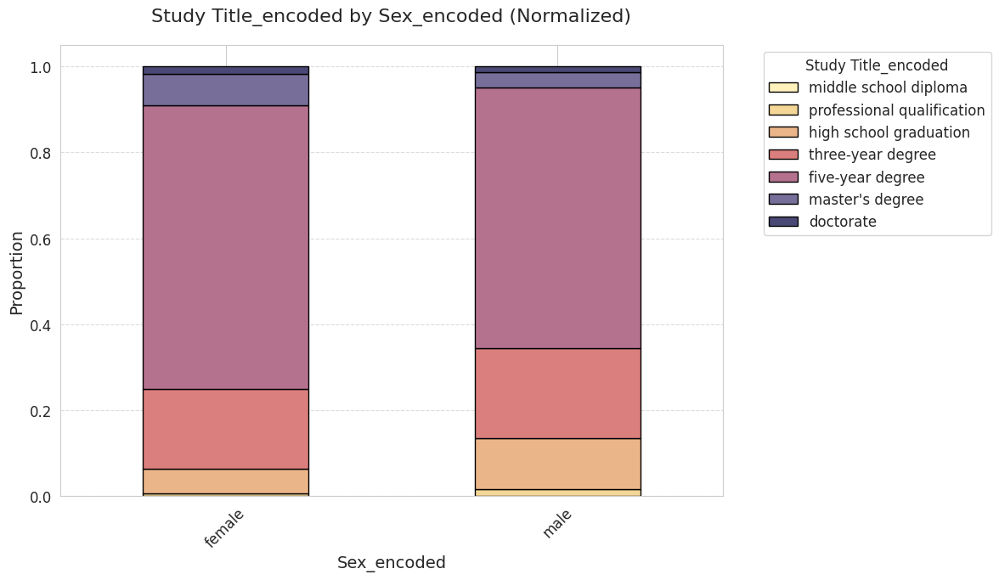

In [ ]:
plot_bar_norm(data_set, 'Sex_encoded', 'Study Title_encoded', reverse_mapping=reverse_mapping)

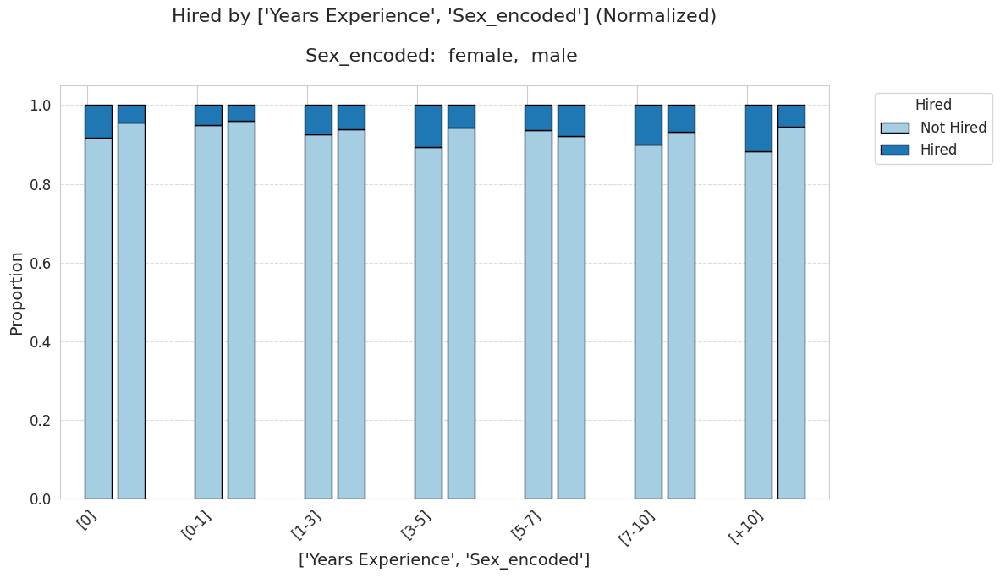

In [ ]:
plot_bar_norm(data_set, ['Years Experience', 'Sex_encoded'], 'Hired', reverse_mapping=reverse_mapping)

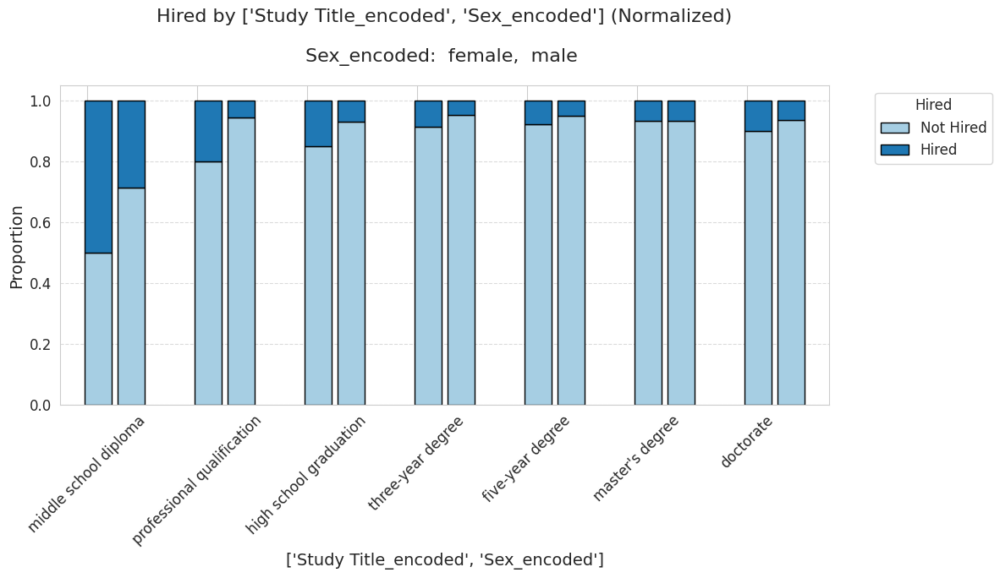

In [ ]:
plot_bar_norm(data_set, ['Study Title_encoded', 'Sex_encoded'], 'Hired', reverse_mapping=reverse_mapping)

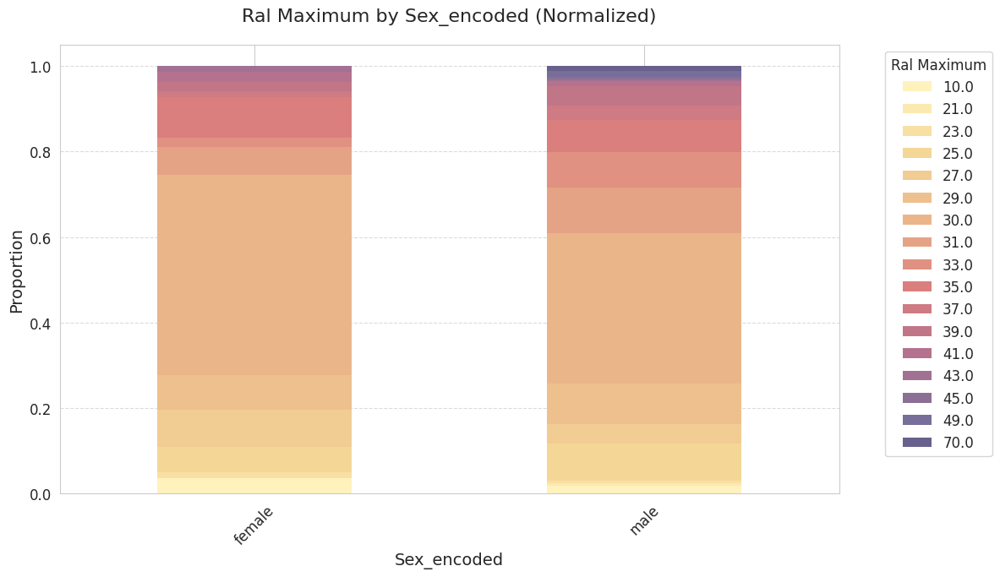

In [ ]:
plot_bar_norm(data_set[data_set['Hired']==1], 'Sex_encoded', 'Ral Maximum', reverse_mapping=reverse_mapping)

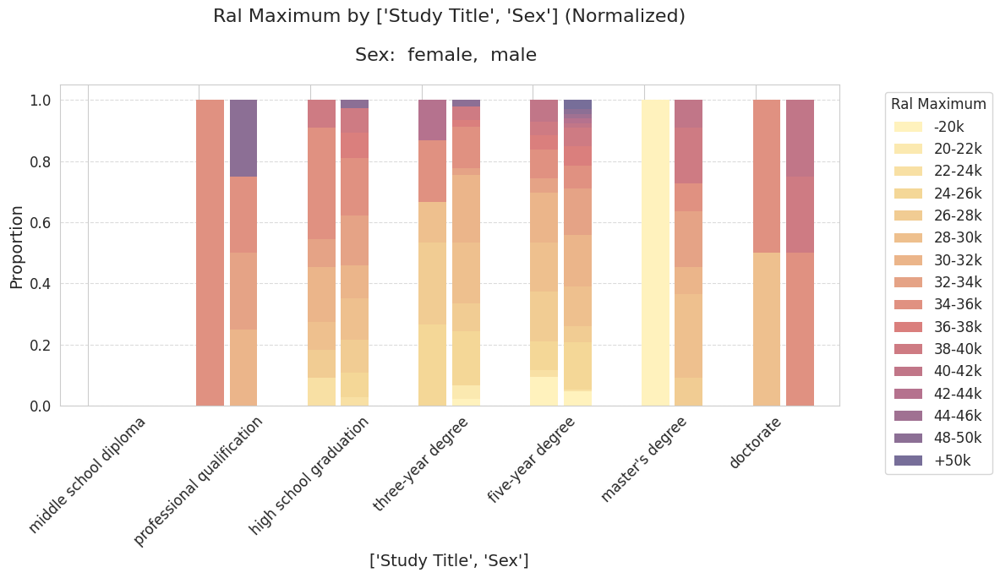

In [ ]:
target_order = ['-20k', '20-22k', '22-24k', '24-26k', '26-28k', '28-30k',
       '30-32k', '32-34k', '34-36k', '36-38k', '38-40k', '40-42k',
       '42-44k', '44-46k', '48-50k', '+50k']
df['Ral Maximum'] =  pd.Categorical(df['Ral Maximum'], categories=target_order, ordered=True)
order = ['middle school diploma','professional qualification', 'high school graduation',
                'three-year degree', 'five-year degree', "master's degree", 'doctorate']
df['Study Title'] = pd.Categorical(df['Study Title'], categories = order, ordered=True)
plot_bar_norm(df[(df['Hired']==1) & (df['Ral Maximum']!= 'not specified')], ['Study Title', 'Sex'], 'Ral Maximum')

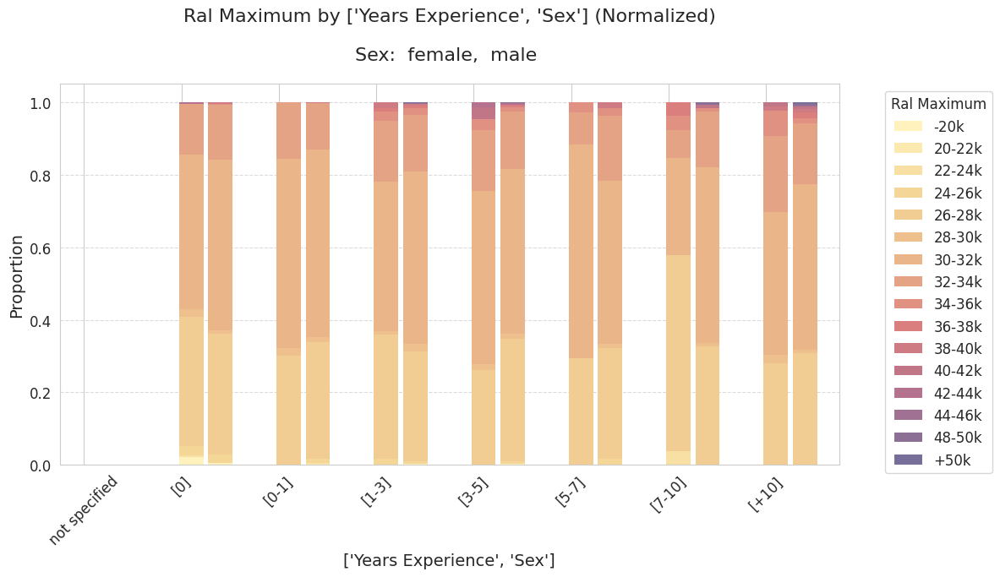

In [ ]:
order = ['not specified', '[0]', '[0-1]', '[1-3]', '[3-5]', '[5-7]', '[7-10]', '[+10]']
df['Years Experience'] = pd.Categorical(df['Years Experience'], categories = order, ordered=True)
plot_bar_norm(df, ['Years Experience', 'Sex'], 'Ral Maximum')

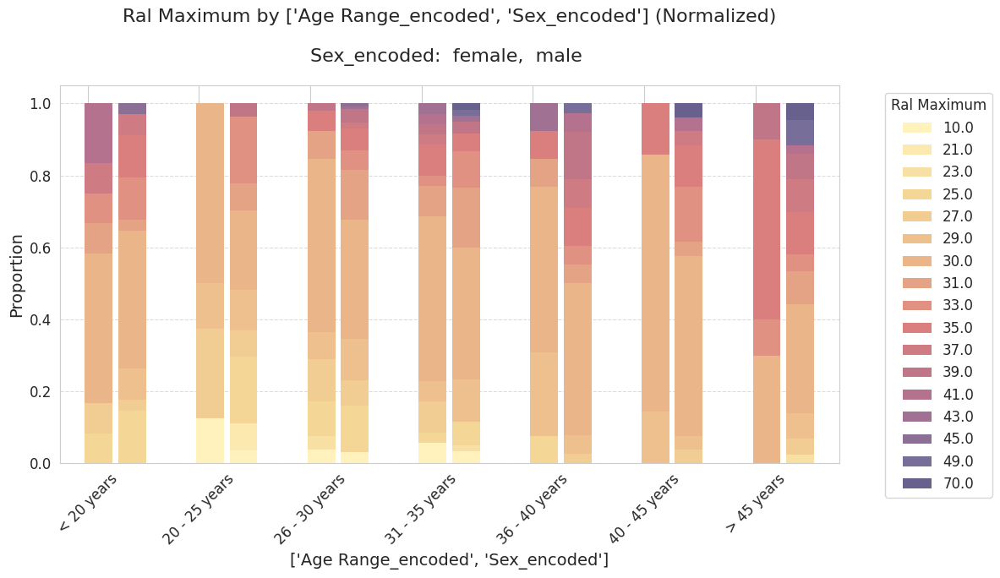

In [ ]:
plot_bar_norm(data_set[data_set['Hired']==1], ['Age Range_encoded', 'Sex_encoded'], 'Ral Maximum', reverse_mapping=reverse_mapping)

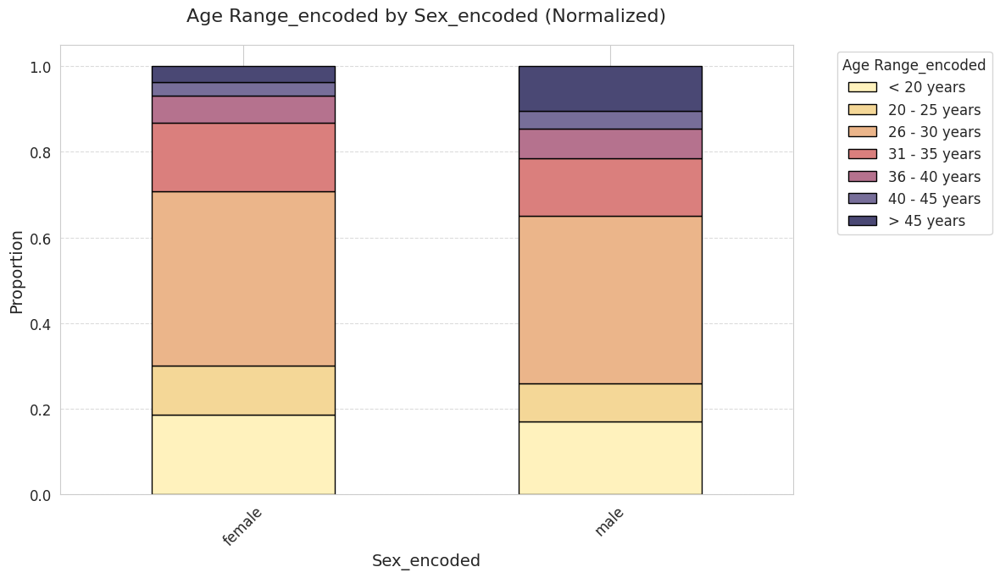

In [ ]:
plot_bar_norm(data_set, 'Sex_encoded', 'Age Range_encoded',reverse_mapping=reverse_mapping)

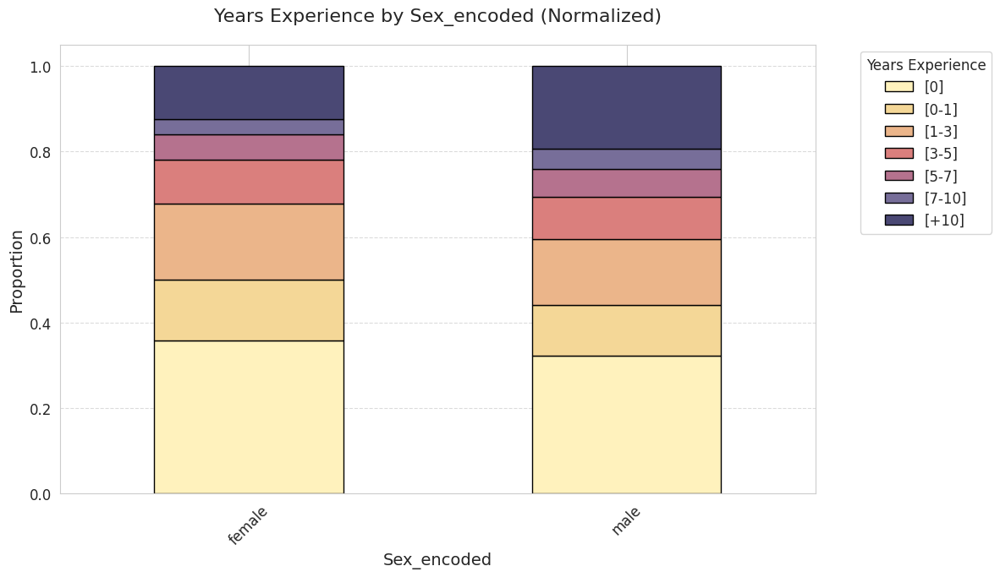

In [ ]:
plot_bar_norm(data_set, 'Sex_encoded', 'Years Experience', reverse_mapping= reverse_mapping)

###Age Range

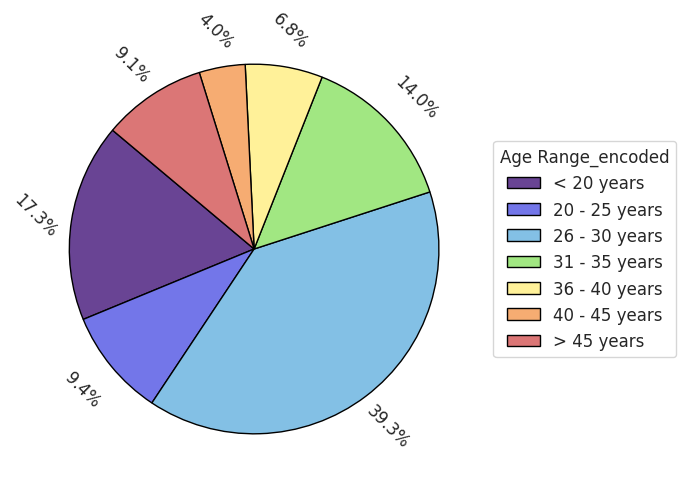

In [ ]:
getPie(data_set, 'Age Range_encoded', reverse_mapping)

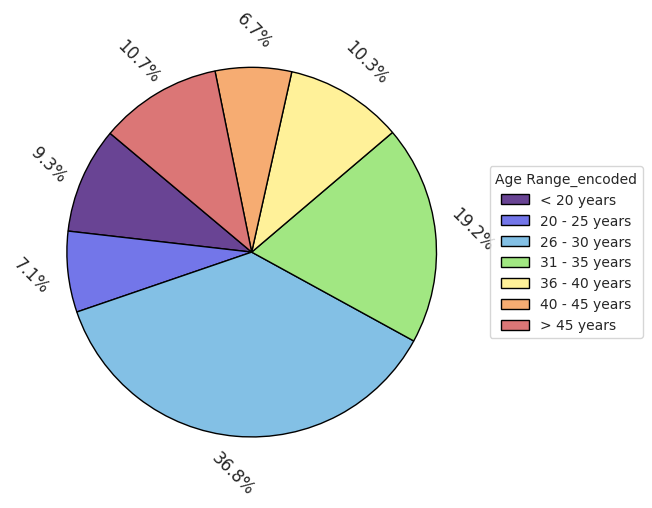

In [ ]:
getPie(data_set[data_set['Hired']==1], 'Age Range_encoded', reverse_mapping)

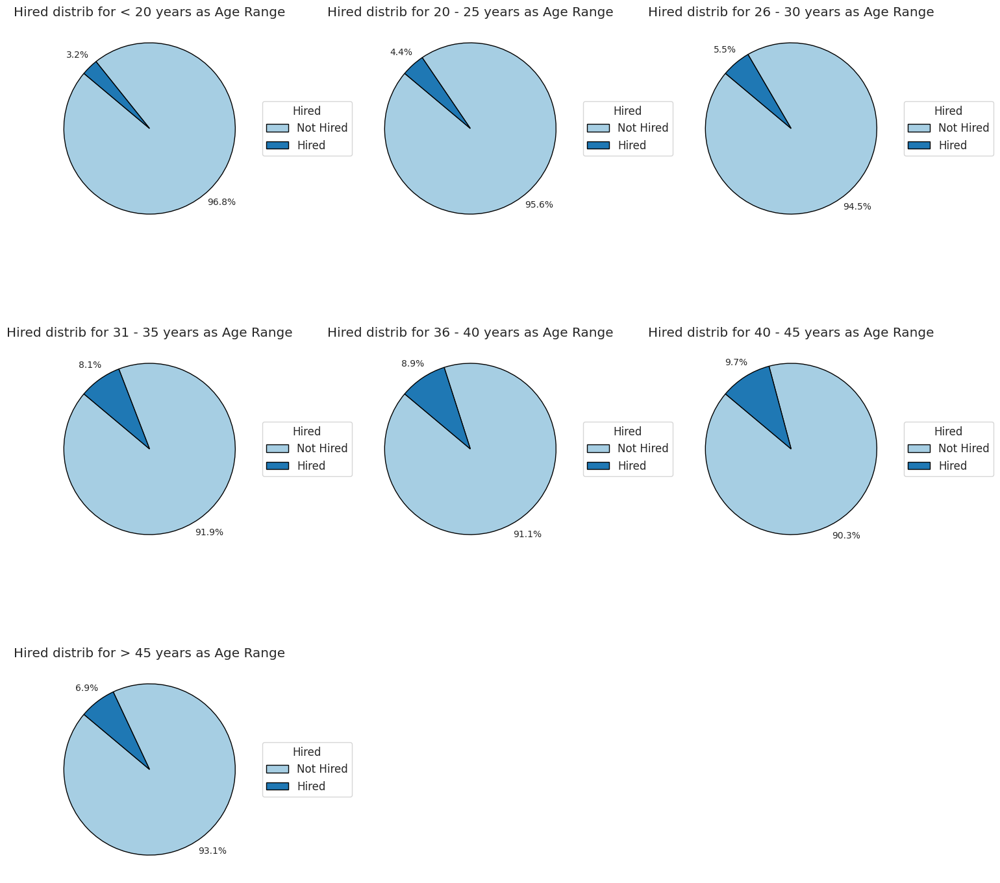

In [ ]:
plot_category_distributions(data_set, 'Age Range_encoded', 'Hired', encoding_mappings, reverse_mapping)

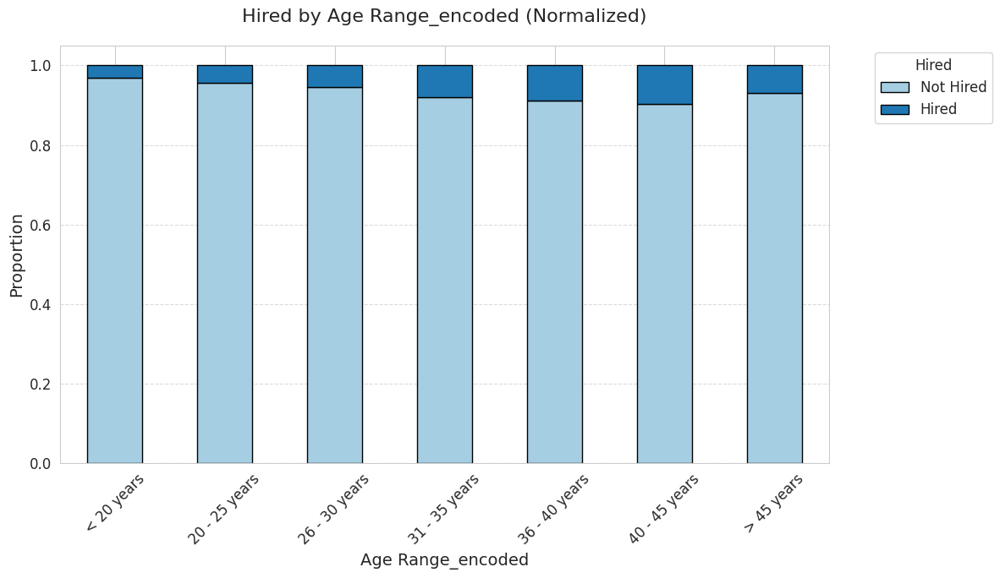

In [ ]:
plot_bar_norm(data_set, 'Age Range_encoded', 'Hired', reverse_mapping = reverse_mapping)

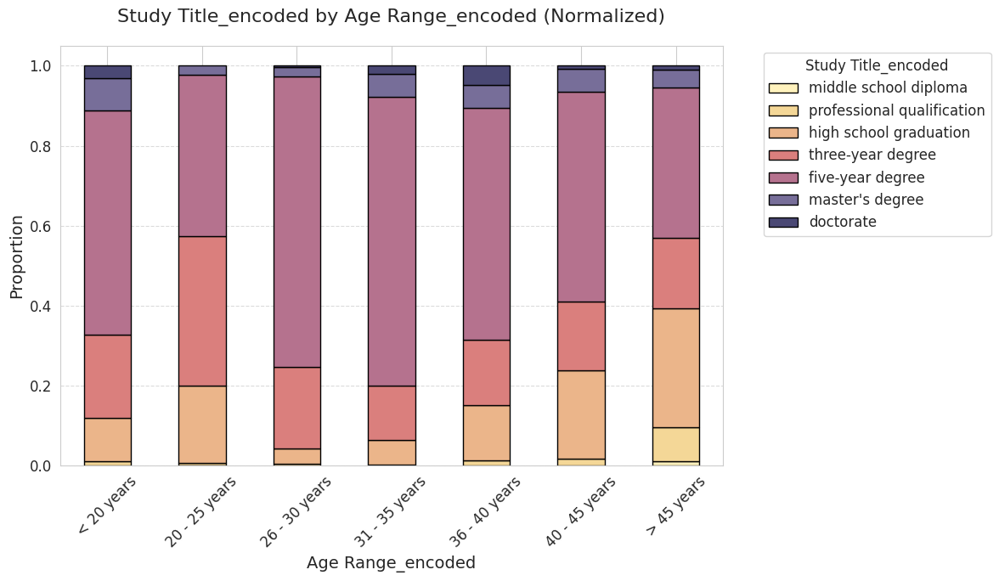

In [ ]:
plot_bar_norm(data_set, 'Age Range_encoded', 'Study Title_encoded',  reverse_mapping=reverse_mapping)

###Protected Category

In [ ]:
data_set.groupby('Id')['Protected Category_encoded'].last().value_counts()

,count
Protected Category_encoded,
0,2955
1,18


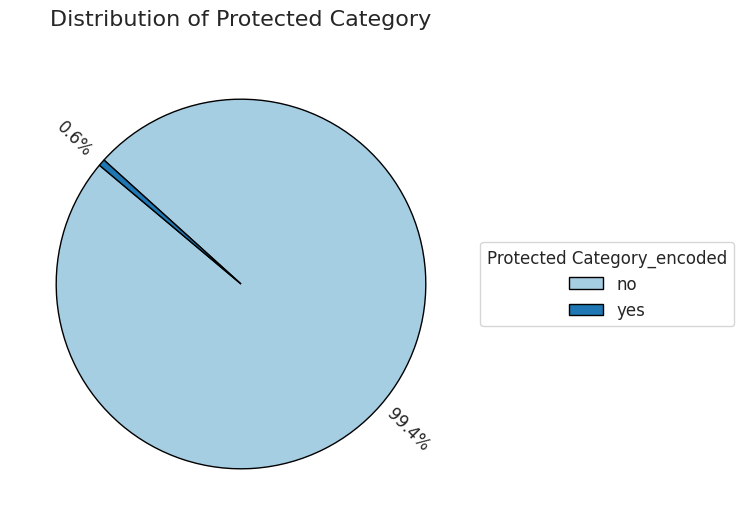

In [ ]:
getPie(data_set, 'Protected Category_encoded', reverse_mapping, title = 'Distribution of Protected Category')

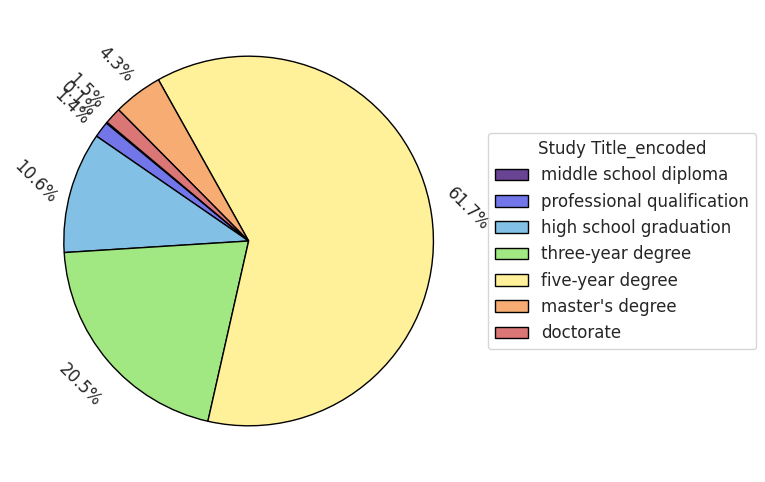

In [ ]:
getPie(data_set, 'Study Title_encoded', reverse_mapping)

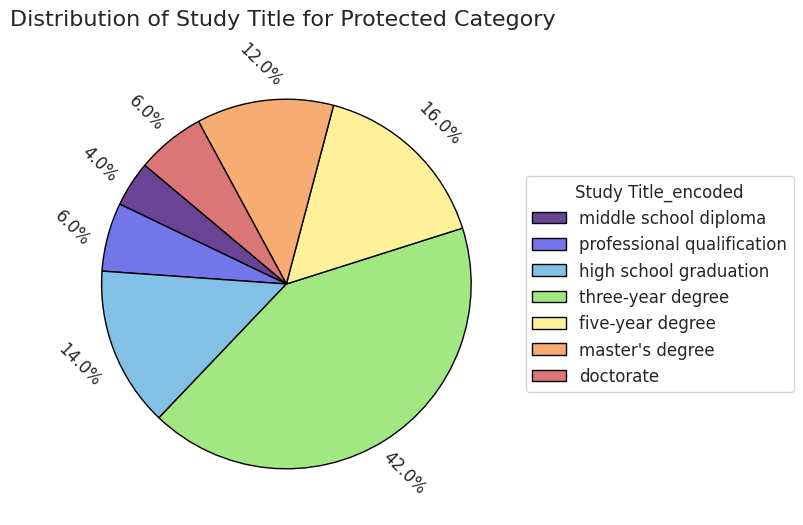

In [ ]:
getPie(data_set[data_set['Protected Category_encoded'] == encoding_mappings['Protected Category_encoded']['yes']], 'Study Title_encoded', reverse_mapping, title="Distribution of Study Title for Protected Category ")

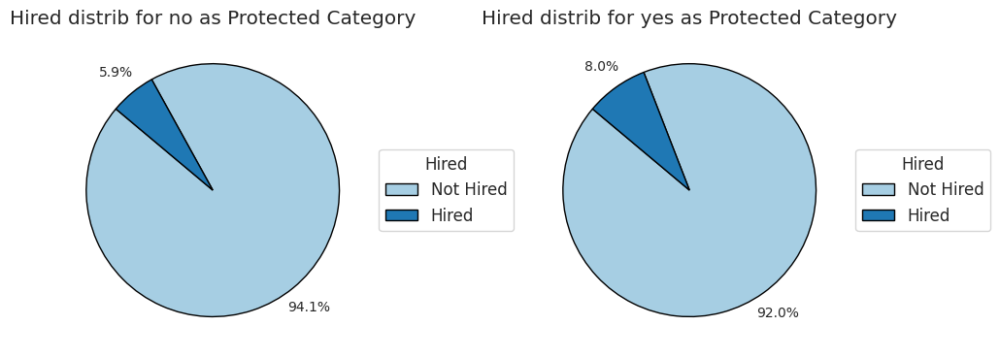

In [ ]:
plot_category_distributions(data_set, 'Protected Category_encoded', 'Hired', encoding_mappings, reverse_mapping)

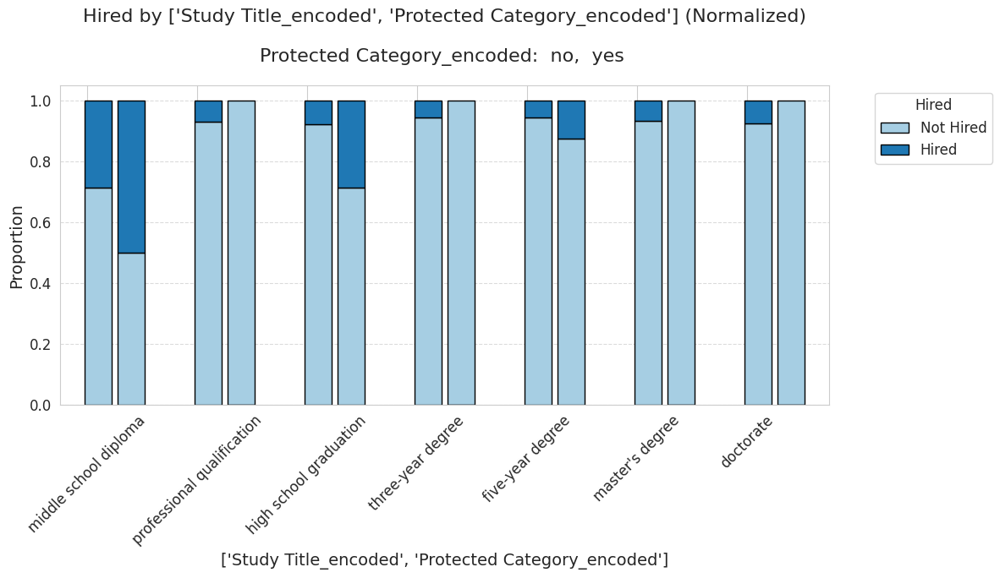

In [ ]:
plot_bar_norm(data_set, ['Study Title_encoded', 'Protected Category_encoded'], 'Hired',reverse_mapping=reverse_mapping)

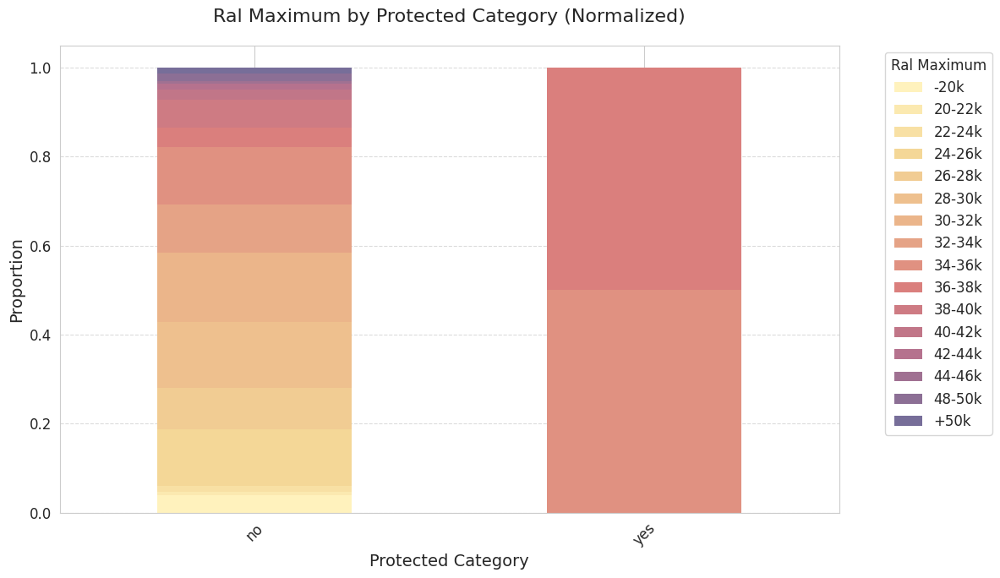

In [ ]:
plot_bar_norm(df[df['Hired']==1], 'Protected Category', 'Ral Maximum')

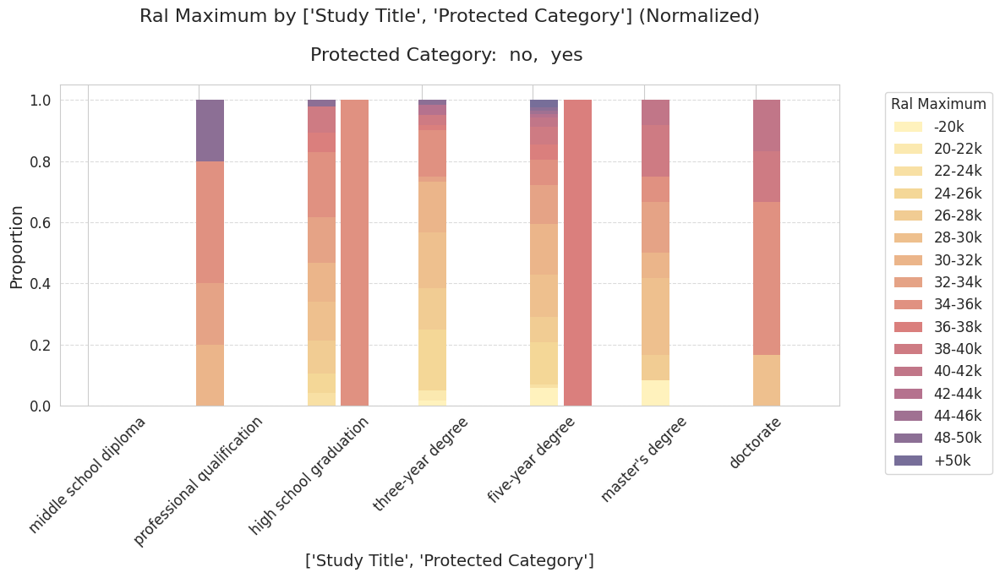

In [ ]:
plot_bar_norm(df[df['Hired']==1], ['Study Title', 'Protected Category'], 'Ral Maximum')

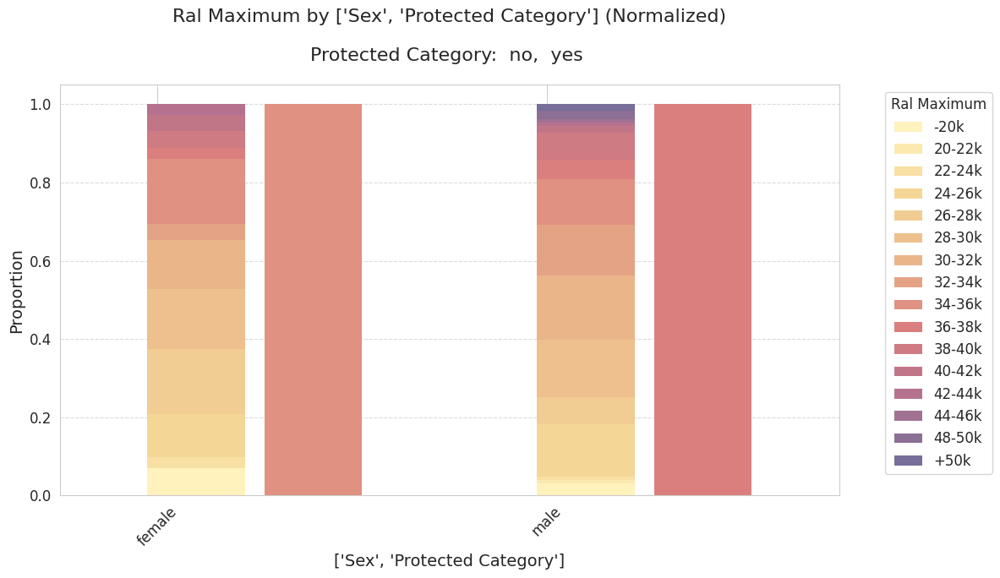

In [ ]:
plot_bar_norm(df[df['Hired']==1], ['Sex', 'Protected Category'], 'Ral Maximum')

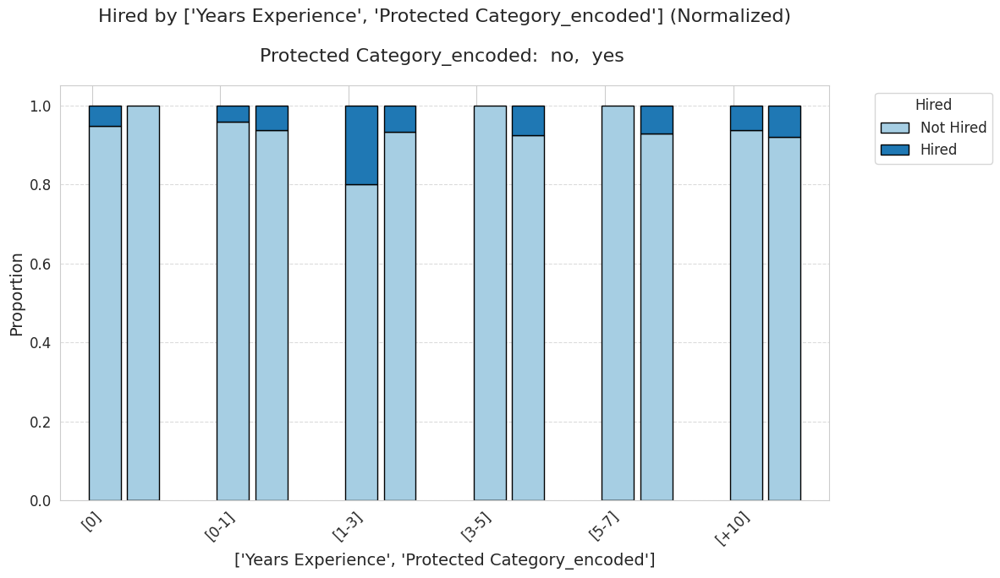

In [ ]:
plot_bar_norm(data_set, ['Years Experience', 'Protected Category_encoded'], 'Hired', reverse_mapping=reverse_mapping)

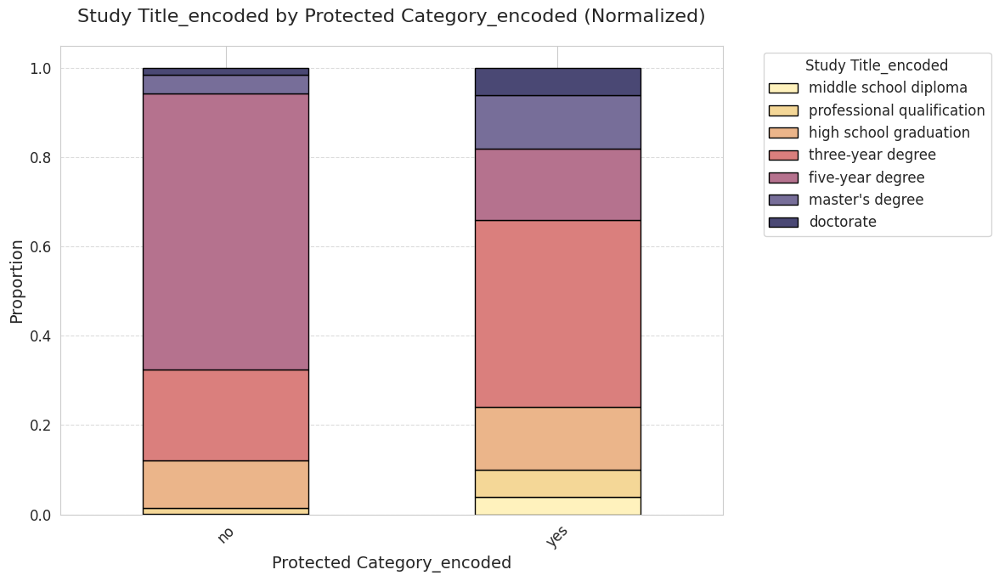

In [ ]:
plot_bar_norm(data_set, 'Protected Category_encoded', 'Study Title_encoded',reverse_mapping=reverse_mapping)

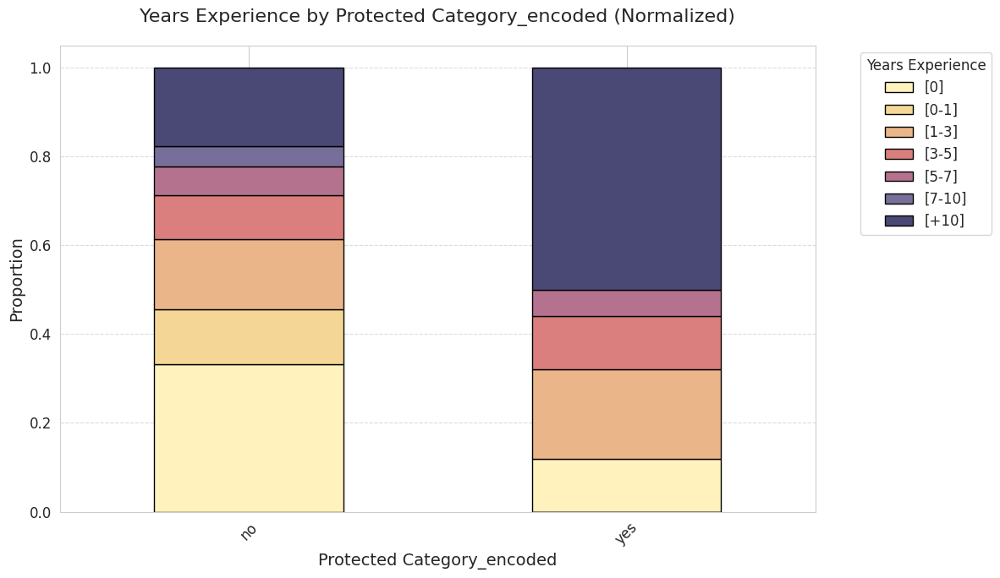

In [ ]:
plot_bar_norm(data_set, 'Protected Category_encoded', 'Years Experience', reverse_mapping=reverse_mapping)

###Residence

In [ ]:
data_set['Italian Residence_encoded'].value_counts()

,count
Italian Residence_encoded,
1,8115
0,309


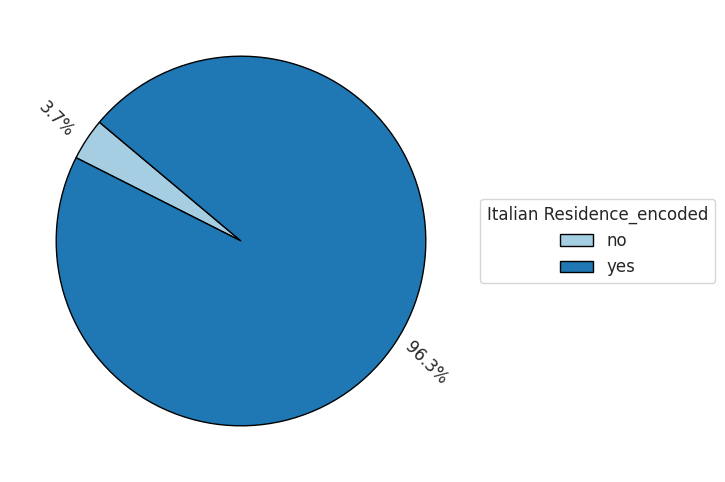

In [ ]:
getPie(data_set, 'Italian Residence_encoded', reverse_mapping)

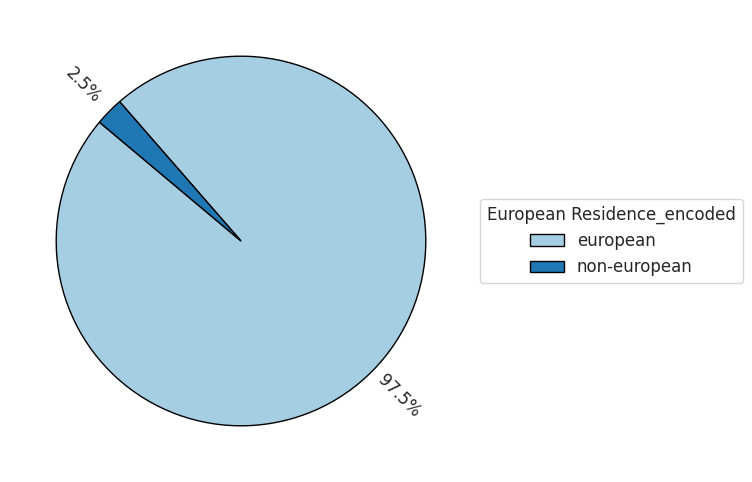

In [ ]:
getPie(data_set, 'European Residence_encoded', reverse_mapping)

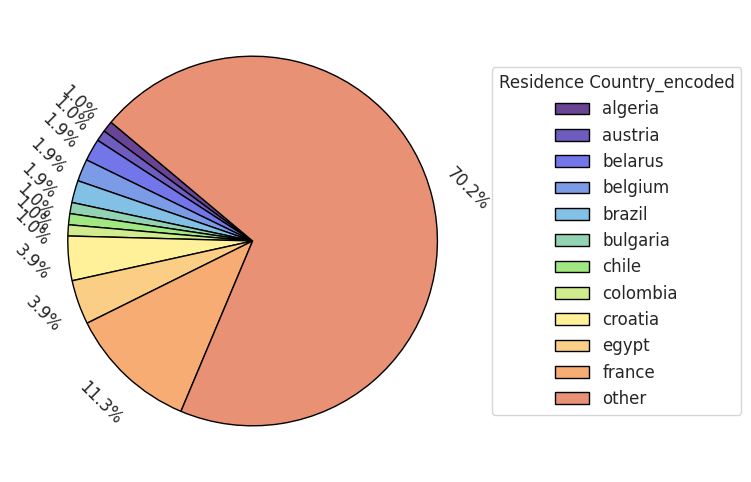

In [ ]:
getPie(data_set[data_set['Italian Residence_encoded'] == encoding_mappings['Italian Residence_encoded']['no']], 'Residence Country_encoded', reverse_mapping)

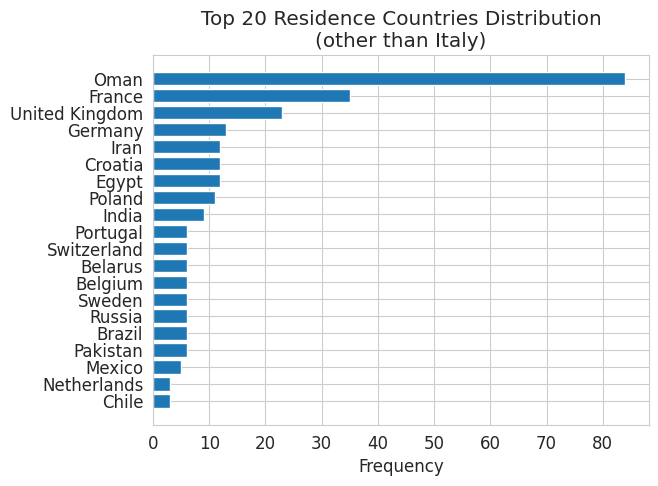

In [ ]:
getHist(data_set[data_set['Italian Residence_encoded'] == encoding_mappings['Italian Residence_encoded']['no']], 'Residence Country_encoded', reverse_mapping=reverse_mapping, kind='barh', title="Top 20 Residence Countries Distribution\n(other than Italy)")

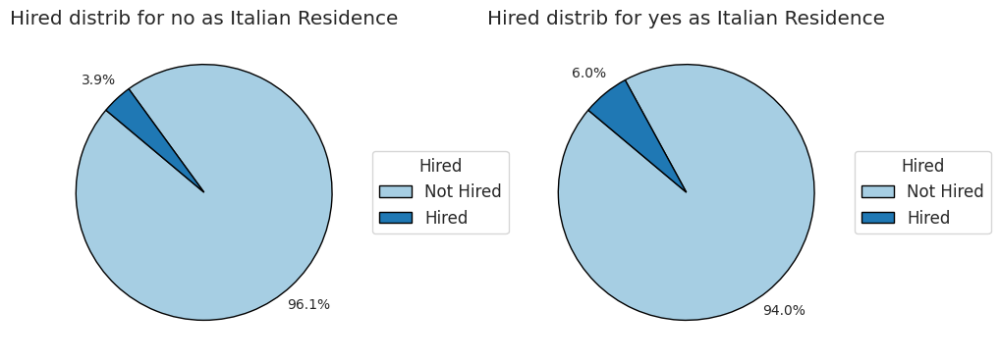

In [ ]:
plot_category_distributions(data_set, 'Italian Residence_encoded', 'Hired', encoding_mappings, reverse_mapping)

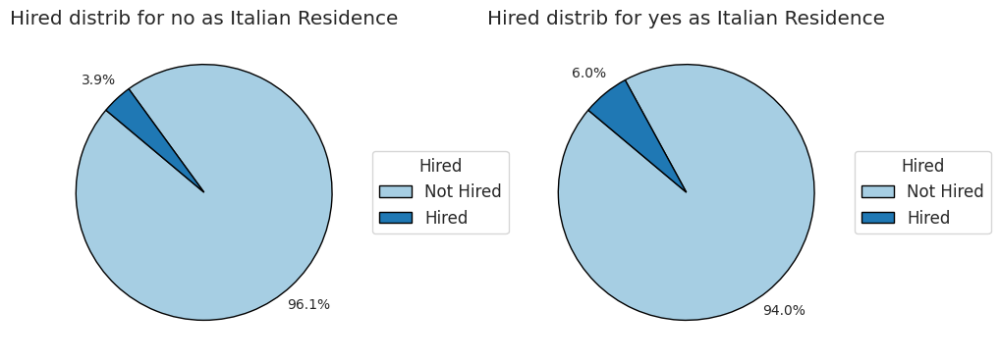

In [ ]:
plot_category_distributions(data_set, 'Italian Residence_encoded', 'Hired', encoding_mappings, reverse_mapping)

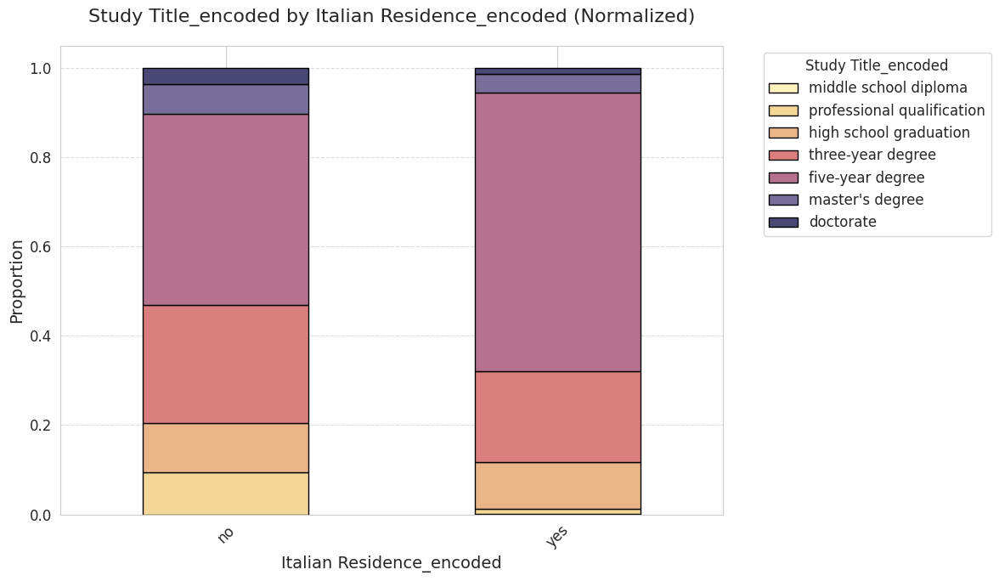

In [ ]:
plot_bar_norm(data_set, 'Italian Residence_encoded', 'Study Title_encoded', reverse_mapping=reverse_mapping)

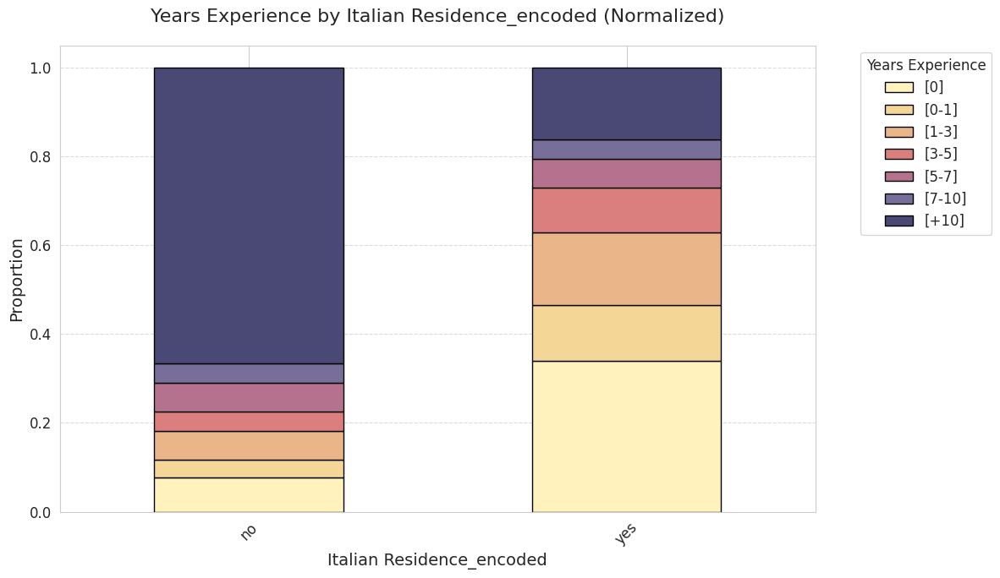

In [ ]:
plot_bar_norm(data_set, 'Italian Residence_encoded', 'Years Experience',reverse_mapping= reverse_mapping)

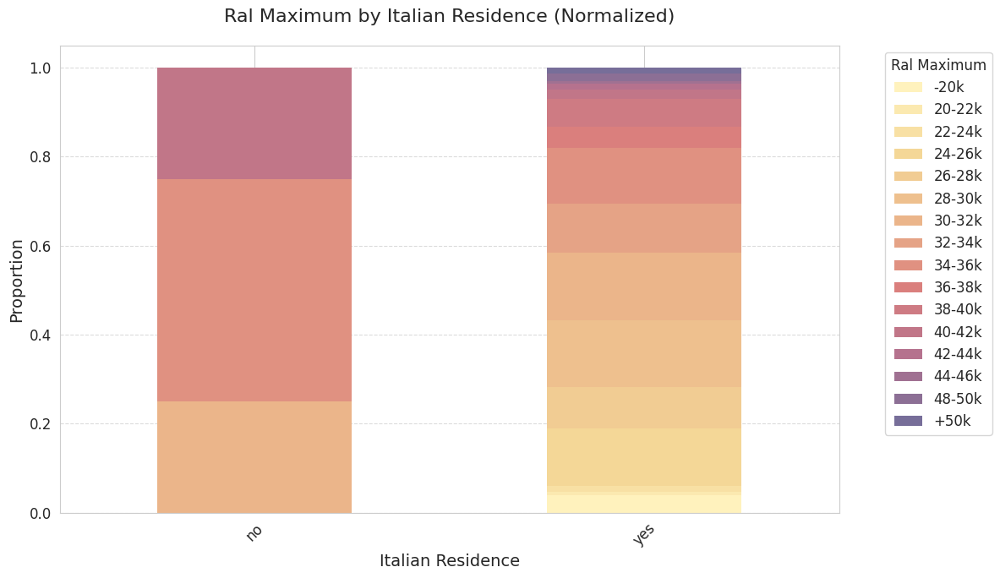

In [ ]:
plot_bar_norm(df[df['Hired']==1], 'Italian Residence', 'Ral Maximum')

In [ ]:
data_set[
    (data_set['Study Title_encoded'] == encoding_mappings['Study Title_encoded']['middle school diploma']) &
    (data_set['Italian Residence_encoded'] != encoding_mappings['Italian Residence_encoded']['no'])
]['Hired'].value_counts()

,count
Hired,
0,6
1,3


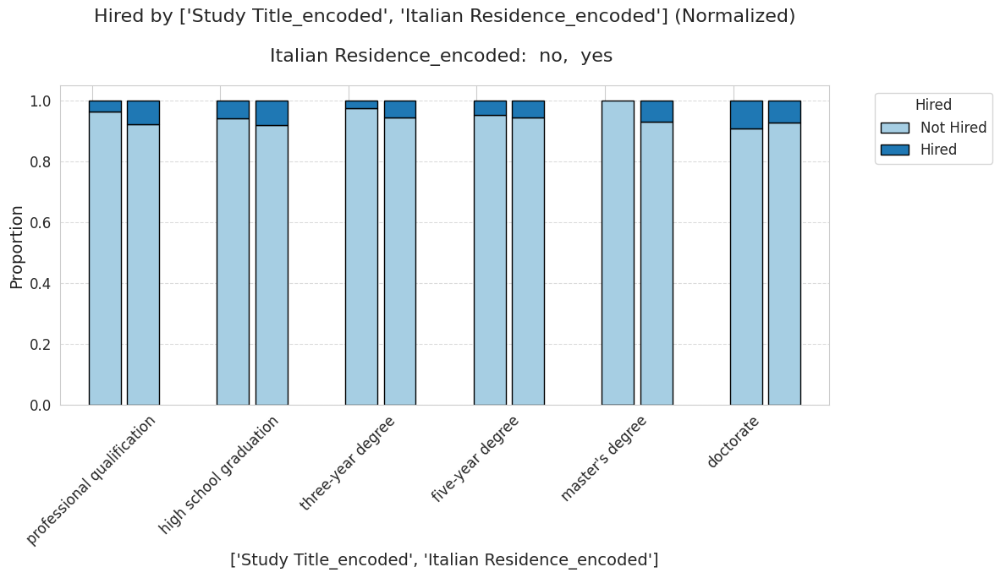

In [ ]:
plot_bar_norm(data_set[data_set['Study Title_encoded'] != encoding_mappings['Study Title_encoded']['middle school diploma']], ['Study Title_encoded', 'Italian Residence_encoded'], 'Hired', reverse_mapping=reverse_mapping)

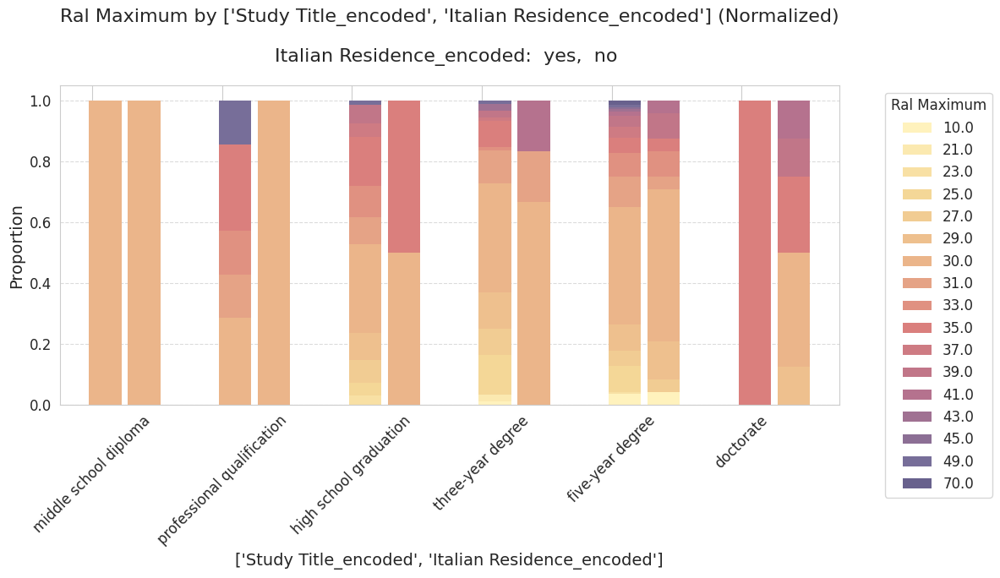

In [ ]:
plot_bar_norm(data_set[data_set['Hired']==1], ['Study Title_encoded', 'Italian Residence_encoded'], 'Ral Maximum', reverse_mapping=reverse_mapping)

##TRAINING

###Train Val Test split

In [38]:
data_set = shuffle(data_set, random_state=random_state)
train_val_set, test_set = train_test_split(data_set, test_size=0.5, stratify=data_set[['Hired', 'Protected Category_encoded']], random_state=random_state)

In [39]:
ctgan = CTGAN(verbose=True)

minority_class = train_val_set[train_val_set['Hired'] == 1]
categorical_features = [f"{col}_encoded" for col in categorical_columns]

ctgan.fit(minority_class, categorical_features, epochs=300)

Gen. (-0.28) | Discrim. (0.04): 100%|██████████| 300/300 [01:21<00:00,  3.66it/s]


In [40]:
n = train_val_set[train_val_set['Hired'] == 0].shape[0] - minority_class.shape[0]
samples = ctgan.sample(n)

for col in categorical_features:
    samples = samples[samples[col].isin(data_set[col].unique())]
print(f"{n - len(samples)} samples removed")

samples['Id'] = samples['Id'].apply(lambda x: x if x < 0 else -1 * x)

0 samples removed


In [41]:
balanced_train_set = pd.concat([samples, train_val_set], ignore_index=True)
balanced_train_set = shuffle(balanced_train_set, random_state=random_state)

In [42]:
ctgan = CTGAN(verbose=True)

ctgan.fit(balanced_train_set, categorical_features, epochs=300)

Gen. (-1.89) | Discrim. (-0.14): 100%|██████████| 300/300 [18:41<00:00,  3.74s/it]


In [43]:
n = int(0.3 * data_set.shape[0])
samples = ctgan.sample(n)

for col in categorical_features:
    samples = samples[samples[col].isin(data_set[col].unique())]
print(f"{n - len(samples)} samples removed")

samples['Id'] = samples['Id'].apply(lambda x: x if x < 0 else -1 * x)

0 samples removed


In [44]:
augmented_train_set = pd.concat([balanced_train_set, samples], ignore_index=True)
augmented_train_set = shuffle(augmented_train_set, random_state=random_state)

In [45]:
X_train = augmented_train_set.drop(columns=['Hired', 'Id'])
y_train = augmented_train_set['Hired']
X_test = test_set.drop(columns=['Hired', 'Id'])
y_test = test_set['Hired']

In [46]:
selector = SelectKBest(score_func=f_classif, k=15)
X_train_selected = selector.fit_transform(X_train, y_train)
X_test_selected = selector.transform(X_test)

In [47]:
selected_features = X_test.columns[selector.get_support()]
X_test_selected = pd.DataFrame(X_test_selected, columns=selected_features)
X_train_selected = pd.DataFrame(X_train_selected, columns=selected_features)

### Param Grid

In [48]:
def binarized_f1(y_true, y_pred):
    return f1_score(y_true, (y_pred > 0.5).astype(int))

def binarized_recall(y_true, y_pred):
    return recall_score(y_true, (y_pred > 0.5).astype(int))

def binarized_precision(y_true, y_pred):
    return precision_score(y_true, (y_pred > 0.5).astype(int))

def binarized_roc_auc(y_true, y_pred):
    return roc_auc_score(y_true, y_pred)

model_list = ['dt' # decision tree
              ,'lr' #linear regression
             ,'lor' #logistric regression
             ,'nb' # gaussian naive bayes
             ,'rf'   # random forest
             ,'lp'   # linear perceptron
             ,'knn'  # k nearest neighbours
             ,'adb'  # adaboost
             ]

model_params = {
    'dt': {'name': 'Decision Tree       ',
           'estimator': DecisionTreeClassifier(random_state=random_state),
           'param': [{'max_depth': [*range(1,20)],'class_weight':[None,'balanced']}],
          },
    'nb': {'name': 'Gaussian Naive Bayes',
           'estimator': GaussianNB(),
           'param': [{'var_smoothing': [10**exp for exp in range(-3,-12,-1)]}]
          },
    'lp': {'name': 'Linear Perceptron   ',
           'estimator': Perceptron(random_state=random_state),
           'param': [{'early_stopping': [True,False],'class_weight':[None,'balanced']}],
          },
    'knn':{'name': 'K Nearest Neighbor ',
           'estimator': KNeighborsClassifier(),
           'param': [{
                      'n_neighbors': list(range(1,10)),
                      #'leaf_size': (20,40,1),
                      #'p': (1,2),
                      'weights': ('uniform', 'distance'),
                      'metric': ['euclidean', 'manhattan'],
                      }]
       },
    'adb':{'name': 'AdaBoost           ',
           'estimator': AdaBoostClassifier(random_state=random_state),
           'param': [{'n_estimators':[20,30,40,50]
                     ,'learning_rate':[0.5,0.75,1,1.25,1.5]}]
          },
    'rf': {'name': 'Random forest       ',
           'estimator': RandomForestClassifier(random_state=random_state),
           'param': [{
                      'n_estimators': [50, 100, 200, 500],
                      'max_depth': [5, 10, 15, 20, None],
                      'min_samples_split': [2, 5, 10],
                      'min_samples_leaf': [1, 2, 5],
                      'class_weight': ['balanced', None]
                      }]
          },
    'lr': {'name': 'Linear Regression   ',
           'estimator': LinearRegression(),
           'param': [{
               'fit_intercept': [True, False],
               'positive': [True,False]}],
           'scorings': {
                'f1_macro': make_scorer(binarized_f1),
                'recall_macro': make_scorer(binarized_recall),
                'precision_macro': make_scorer(binarized_precision),
                'roc_auc': make_scorer(binarized_roc_auc, needs_proba=True)
            }
          },
    'lor': {'name': 'Logistic Regression ',
           'estimator': LogisticRegression(random_state=random_state),
          'param': [{
               'C': [0.01, 0.1, 1, 10, 100],
               'solver': ['lbfgs', 'saga'],
               'class_weight': ['balanced', None],
               'max_iter': [500, 1000, 1500]
           }]
    }
}

### Model selection

In [49]:
with open(drive_dir+best_models_dict, 'rb') as f:
    best_model_params = pickle.load(f)

In [50]:
traditional_models = {name: best_model_params[name]['estimator'] for name in best_model_params.keys()}

In [52]:
for m in traditional_models.keys():
  if m in ['Logistic Regression', 'Gaussian Naive Bayes', 'Linear Perceptron', 'Random forest', 'K Nearest Neighbor']:
    traditional_models[m].fit(X_train_selected, y_train)
  else:
    traditional_models[m].fit(X_train, y_train)

In [53]:
trad_predictions = {}
for m in traditional_models.keys():
  print(f"Predictions for {m}")
  if m in ['Logistic Regression', 'Gaussian Naive Bayes', 'Linear Perceptron', 'Random forest', 'K Nearest Neighbor']:
    trad_predictions[m] = traditional_models[m].predict(X_test_selected)
  else:
    trad_predictions[m] = traditional_models[m].predict(X_test)
  if m == 'Linear Regression':
    trad_predictions[m] = (trad_predictions[m] > 0.5).astype(int)

Predictions for Decision Tree
Predictions for Linear Regression
Predictions for Logistic Regression
Predictions for Gaussian Naive Bayes
Predictions for Random forest
Predictions for Linear Perceptron
Predictions for K Nearest Neighbor
Predictions for AdaBoost


In [54]:
trad_metrics = []

for m in traditional_models.keys():
  y_pred = trad_predictions[m]
  cr = classification_report(y_test, y_pred, output_dict=True, zero_division=1)
  trad_metrics.append({
      'model': m,
      'accuracy': cr['accuracy'],
      'precision': cr['macro avg']['precision'],
      'recall': cr['macro avg']['recall'],
      'f1_score': cr['macro avg']['f1-score'],
      'roc_auc': roc_auc_score(y_test, y_pred)
  })

trad_metrics = pd.DataFrame(trad_metrics)
trad_metrics.sort_values(by='recall', ascending=False)

,model,accuracy,precision,recall,f1_score,roc_auc
0,Decision Tree,0.959402,0.828234,0.779127,0.801359,0.779127
2,Logistic Regression,0.811016,0.587910,0.768647,0.599783,0.768647
1,Linear Regression,0.830009,0.585035,0.731280,0.601341,0.731280
3,Gaussian Naive Bayes,0.869183,0.603377,0.721716,0.629806,0.721716
5,Linear Perceptron,0.686135,0.549789,0.702316,0.508095,0.702316
4,Random forest,0.959639,0.893563,0.695732,0.757211,0.695732
6,K Nearest Neighbor,0.902422,0.598308,0.623581,0.608849,0.623581
7,AdaBoost,0.946819,0.784430,0.620588,0.664293,0.620588


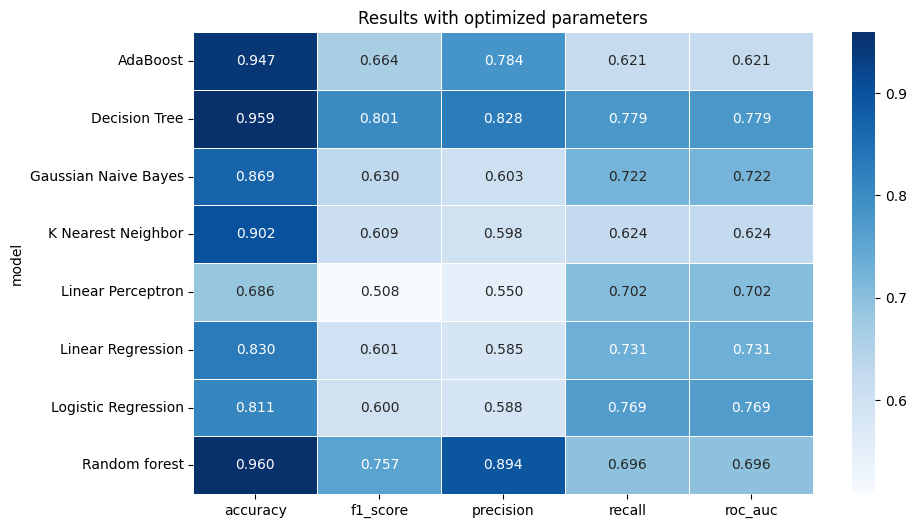

In [55]:
pivot_table = trad_metrics.pivot_table(index='model', values=['accuracy', 'precision', 'recall', 'f1_score', 'roc_auc'])
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='Blues', fmt='.3f', linewidths=.5)
plt.title('Results with optimized parameters')
plt.show()

In [ ]:
if not os.path.exists(f'{drive_dir}TraditionalModels'):
    os.makedirs(f'{drive_dir}TraditionalModels')

for m in traditional_models.keys():
  model = traditional_models[m]
  joblib.dump(model, f'{drive_dir}TraditionalModels/{m}.pkl')

###NN

In [56]:
with open(drive_dir+best_params_nn_dict, 'rb') as f:
    best_params_nn = pickle.load(f)

In [57]:
best_params_nn

{'optimizer': 'rmsprop',
 'neurons': 512,
 'learning_rate': 0.001,
 'epochs': 100,
 'batch_size': 128,
 'activation': 'elu'}

In [59]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=30,
    restore_best_weights=True
)

In [67]:
neural_models = []
histories = []

i = 0
for seed in range(85, 88):
    name = f'Neural Network {i+1}'
    i+=1
    fit_nn(name, seed, neural_models, histories, X_train, y_train, best_params = best_params_nn, early_stopping=early_stopping)

Fitting model Neural Network 1...
Epoch 1/100
82/82 [==============================] - 10s 27ms/step - loss: 0.7080 - accuracy: 0.6208
Epoch 2/100
82/82 [==============================] - 2s 23ms/step - loss: 0.5447 - accuracy: 0.7158
Epoch 3/100
82/82 [==============================] - 2s 22ms/step - loss: 0.4912 - accuracy: 0.7561
Epoch 4/100
82/82 [==============================] - 2s 26ms/step - loss: 0.4703 - accuracy: 0.7663
Epoch 5/100
82/82 [==============================] - 2s 30ms/step - loss: 0.4409 - accuracy: 0.7829
Epoch 6/100
82/82 [==============================] - 3s 33ms/step - loss: 0.4306 - accuracy: 0.7936
Epoch 7/100
82/82 [==============================] - 2s 20ms/step - loss: 0.4095 - accuracy: 0.8056
Epoch 8/100
82/82 [==============================] - 1s 16ms/step - loss: 0.4031 - accuracy: 0.8143
Epoch 9/100
82/82 [==============================] - 2s 19ms/step - loss: 0.3949 - accuracy: 0.8166
Epoch 10/100
82/82 [==============================] - 2s 22ms/ste

In [68]:
i = 0
neural_predictions = {}
for nn in neural_models:
  name = f"Neural Network {i}"
  predict_nn(name, nn, X_test, neural_predictions)
  i+=1

Predicting with model Neural Network 0...
132/132 [==============================] - 1s 3ms/step
Predictions from model Neural Network 0 stored.


Predicting with model Neural Network 1...
132/132 [==============================] - 0s 2ms/step
Predictions from model Neural Network 1 stored.


Predicting with model Neural Network 2...
132/132 [==============================] - 0s 2ms/step
Predictions from model Neural Network 2 stored.




In [69]:
nn_metrics = []

for m in neural_predictions.keys():
  y_pred = neural_predictions[m]
  calc_nn_metrics(y_pred, y_test, nn_metrics, m)

nn_metrics = pd.DataFrame(nn_metrics)
nn_metrics.sort_values(by='recall', ascending=False)

,model,accuracy,precision,recall,f1_score,roc_auc
0,Neural Network 0,0.952517,0.786075,0.777368,0.781641,0.777368
1,Neural Network 1,0.954179,0.804282,0.742185,0.769091,0.742185
2,Neural Network 2,0.944444,0.748370,0.733218,0.740506,0.733218


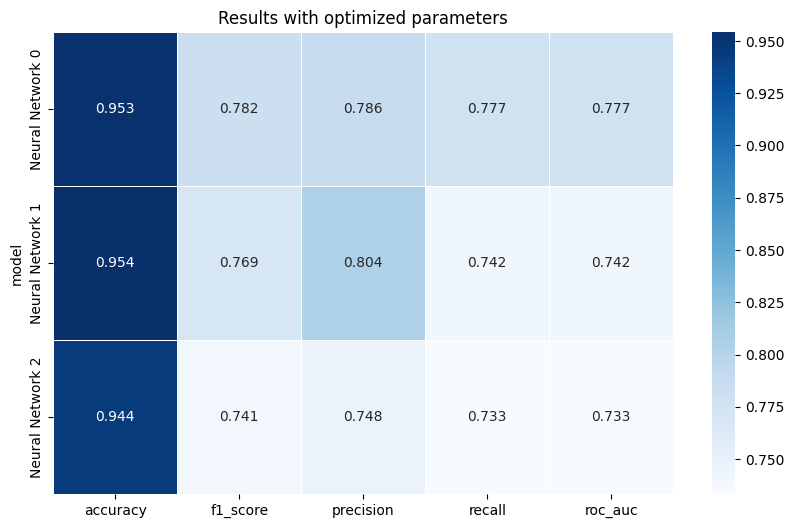

In [70]:
pivot_table = nn_metrics.pivot_table(index='model', values=['accuracy', 'precision', 'recall', 'f1_score', 'roc_auc'])
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='Blues', fmt='.3f', linewidths=.5)
plt.title('Results with optimized parameters')
plt.show()

### Combined Performance

In [71]:
combined_metrics = pd.concat([trad_metrics, nn_metrics], ignore_index=True)
combined_metrics.sort_values(by='recall', ascending=False)

,model,accuracy,precision,recall,f1_score,roc_auc
0,Decision Tree,0.959402,0.828234,0.779127,0.801359,0.779127
8,Neural Network 0,0.952517,0.786075,0.777368,0.781641,0.777368
2,Logistic Regression,0.811016,0.587910,0.768647,0.599783,0.768647
9,Neural Network 1,0.954179,0.804282,0.742185,0.769091,0.742185
10,Neural Network 2,0.944444,0.748370,0.733218,0.740506,0.733218
1,Linear Regression,0.830009,0.585035,0.731280,0.601341,0.731280
3,Gaussian Naive Bayes,0.869183,0.603377,0.721716,0.629806,0.721716
5,Linear Perceptron,0.686135,0.549789,0.702316,0.508095,0.702316
4,Random forest,0.959639,0.893563,0.695732,0.757211,0.695732
6,K Nearest Neighbor,0.902422,0.598308,0.623581,0.608849,0.623581


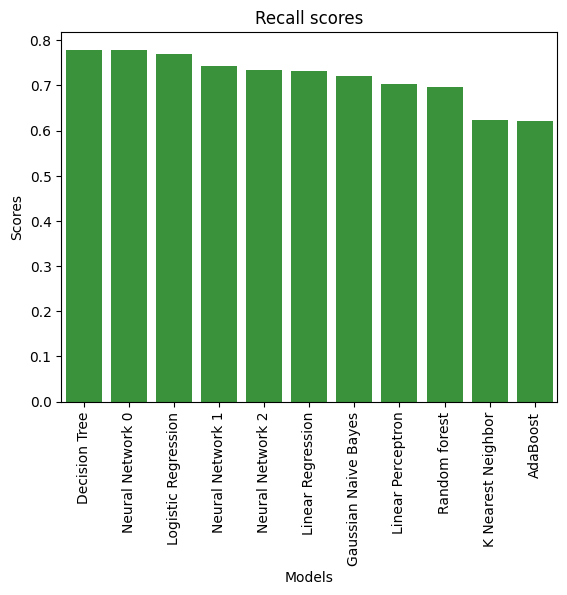

In [72]:
combined_metrics = combined_metrics.sort_values(by='recall', ascending=False)
scores = combined_metrics['recall']
models_plot= combined_metrics['model']
sns.barplot(x=models_plot, y=scores, color=sns.palettes.color_palette()[2])

plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Recall scores')
plt.xticks(rotation=90)
plt.show()

In [73]:
models = {}
models_predictions = {}

for m, model in traditional_models.items():
  models[m] = model

for i,model in enumerate(neural_models):
  models[f"Neural Network {i}"] = model


for k in traditional_models.keys():
  models_predictions[k] = trad_predictions[k]

for m in neural_predictions.keys():
  models_predictions[m] = neural_predictions[m].flatten()


##Bias detection

In [74]:
# Columns groups of interest
sensitive_features = ['Sex_encoded', 'Age Range_encoded', 'Italian Residence_encoded', 'European Residence_encoded', 'Protected Category_encoded']
non_sensitive_features = data_set.columns.difference(sensitive_features)

# Tresholds
tolerance = 0.1
significance_level = 0.1

###Demographic Parity

In [75]:
dp_df = getFairnessTab(calculate_demographic_parity,
               models=models,
               sensitive_features = sensitive_features,
               predictions= models_predictions,
               index=list(models.keys()),
               X_test=X_test,
               y_test = y_test,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=False
               )

dp_df

,Sex_encoded,Age Range_encoded,Italian Residence_encoded,European Residence_encoded,Protected Category_encoded
Decision Tree,,20 - 25 years,,,
Linear Regression,male,< 20 years,yes,european,
Logistic Regression,male,< 20 years,yes,european,
Gaussian Naive Bayes,,< 20 years,yes,european,
Random forest,,< 20 years,,,
Linear Perceptron,,< 20 years,yes,european,no
K Nearest Neighbor,,< 20 years,,,
AdaBoost,,20 - 25 years,,,
Neural Network 0,,< 20 years,,,
Neural Network 1,,< 20 years,,,


### Equalized Odds

In [76]:
eo_df = getFairnessTab(calculate_equalized_odds,
               models=models,
               sensitive_features = sensitive_features,
               predictions= models_predictions,
               index=list(models.keys()),
               X_test=X_test,
               y_test = y_test,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=True
               )

eo_df

===============================UNFAIR!===============================
Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Age Range_encoded
Maximum TPR difference: 0.2372 between group < 20 years and group 26 - 30 years
Model unfair to: 26 - 30 years
TPR and FPR for each group:
Group < 20 years: TPR=0.7200, FPR=0.0174
Group 31 - 35 years: TPR=0.5854, FPR=0.0149
Group 26 - 30 years: TPR=0.4828, FPR=0.0137
Group 36 - 40 years: TPR=0.5556, FPR=0.0226
Group 20 - 25 years: TPR=0.6250, FPR=0.0109
Group > 45 years: TPR=0.6571, FPR=0.0251
Group 40 - 45 years: TPR=0.6250, FPR=0.0342


===============================UNFAIR!===============================
Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Italian Residence_encoded
Maximum TPR difference: 0.2445 between group yes and group no
Model unfair to: no
TPR and FPR for each group:
Group yes: TPR=0.5779, FPR=0.0160
Group no: TPR=0.3333, FPR=0.0340


===============================UNFAIR!==============

,Sex_encoded,Age Range_encoded,Italian Residence_encoded,European Residence_encoded,Protected Category_encoded
Decision Tree,,26 - 30 years [TPR],no [TPR],non-european [TPR],
Linear Regression,male [TPR],36 - 40 years [TPR],"no [TPR], yes [FPR]",non-european [TPR],
Logistic Regression,,20 - 25 years [TPR],"no [TPR], yes [FPR]","non-european [TPR], european [FPR]",yes [TPR]
Gaussian Naive Bayes,,31 - 35 years [TPR],no [TPR],non-european [TPR],
Random forest,,,no [TPR],non-european [TPR],
Linear Perceptron,,"20 - 25 years [TPR], < 20 years [FPR]",yes [TPR/FPR],european [TPR/FPR],no [TPR]
K Nearest Neighbor,,40 - 45 years [TPR],,,
AdaBoost,,20 - 25 years [TPR],no [TPR],non-european [TPR],yes [TPR]
Neural Network 0,,40 - 45 years [TPR],no [TPR],non-european [TPR],
Neural Network 1,,> 45 years [TPR],,,


In [77]:
test_set[
    (test_set['Protected Category_encoded'] == encoding_mappings['Protected Category_encoded']['yes'])
]['Hired'].value_counts()

,count
Hired,
0,23
1,2


In [78]:
test_set[
    (test_set['European Residence_encoded'] == encoding_mappings['European Residence_encoded']['non-european'])
]['Hired'].value_counts()

,count
Hired,
0,99
1,3


In [79]:
test_set[
    (test_set['Italian Residence_encoded'] == encoding_mappings['Italian Residence_encoded']['no'])
]['Hired'].value_counts()

,count
Hired,
0,147
1,3


###Counterfactual Fairness

In [80]:
getFairnessTab(
    calculate_counterfactual_fairness,
    models=models,
    sensitive_features= sensitive_features,
    predictions=models_predictions,
    index=list(models.keys()),
    X_test=X_test,
    y_test=y_test,
    significance_level=significance_level,
    tolerance=tolerance,
    verbose=True,
    X_test_selected = X_test_selected
)

Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Counterfactual Fairness on Sex_encoded
Counterfactual consistency: 0.9874
Most inconsistent group: female 0.0126
Most discriminated group: male -0.0007
Most privileged group: female 0.0126
Direction of bias (negative = worse, positive = better)


Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Counterfactual Fairness on Age Range_encoded
Counterfactual consistency: 1.0000
Most inconsistent group: < 20 years 0.0000
Most discriminated group: < 20 years 0.0000
Most privileged group: < 20 years 0.0000
Direction of bias (negative = worse, positive = better)


Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Counterfactual Fairness on Italian Residence_encoded
Counterfactual consistency: 1.0000
Most inconsistent group: yes 0.0000
Most discriminated group: yes 0.0000
Most privileged group: yes 0.0000
Direction of bias (negative = worse, positive = better)


Model DecisionTreeCla

,Sex_encoded,Age Range_encoded,Italian Residence_encoded,European Residence_encoded,Protected Category_encoded
Decision Tree,,,,,
Linear Regression,"male [-2.83%], female [12.25%]","< 20 years [-5.89%], > 45 years [10.61%]","yes [-0.59%], no [10.23%]",,"no [-0.05%], yes [20.3%]"
Logistic Regression,"male [-2.59%], female [12.32%]","< 20 years [-4.53%], > 45 years [6.74%]",,,
Gaussian Naive Bayes,,,"yes [-0.71%], no [11.8%]",,
Random forest,,,,,
Linear Perceptron,,"< 20 years [-26.54%], > 45 years [65.03%]","yes [-0.19%], no [15.22%]",,
K Nearest Neighbor,"male [-0.52%], female [7.88%]","< 20 years [-2.23%], 40 - 45 years [13.72%]","yes [0.19%], no [10.52%]",,
AdaBoost,,,,,
Neural Network 0,,,,,
Neural Network 1,,,,,


##Explainers

###LIME (Local Interpretable Model-agnostic Explanations)
explanations for samples with index = 16,17,18, with the top 5 most relevant features.

In [81]:
explainer1  = lime_tabular.LimeTabularExplainer(
    X_train.values, mode="classification", feature_names=X_train.columns.tolist(),
    class_names=['Not Hired', 'Hired'])

explainer2  = lime_tabular.LimeTabularExplainer(
    X_train_selected.values, mode="classification", feature_names=X_train_selected.columns.tolist(),
    class_names=['Not Hired', 'Hired'])

In [82]:
def findNearest(num, keys):
  dist = float('inf')
  nearest = None
  for key in keys:
    if abs(key-num) < dist:
      dist = abs(key-num)
      nearest = key
  return nearest

In [83]:
import pandas as pd

def sort_by_absolute_values(df, column_name, ascending=True):
    if column_name not in df.columns:
        raise ValueError(f"La colonna '{column_name}' non esiste nel DataFrame.")

    sorted_indices = df[column_name].abs().argsort()
    if not ascending:
        sorted_indices = sorted_indices[::-1]

    return df.iloc[sorted_indices]

In [84]:
X_test.reset_index(drop=True, inplace=True)
protected_candidates = X_test[(X_test['Protected Category_encoded'] == encoding_mappings['Protected Category_encoded']['yes'])].index
protected_candidates

Index([   5,  351,  386,  556,  706,  868,  959, 1026, 1338, 1362, 1403, 1406,
       1448, 1484, 2076, 2103, 2108, 2540, 2584, 2849, 2883, 2984, 3072, 3261,
       4173],
      dtype='int64')

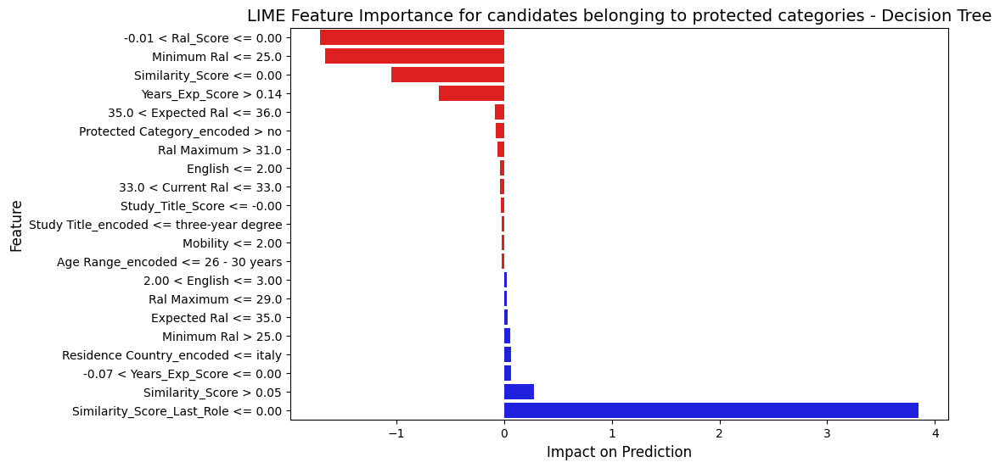

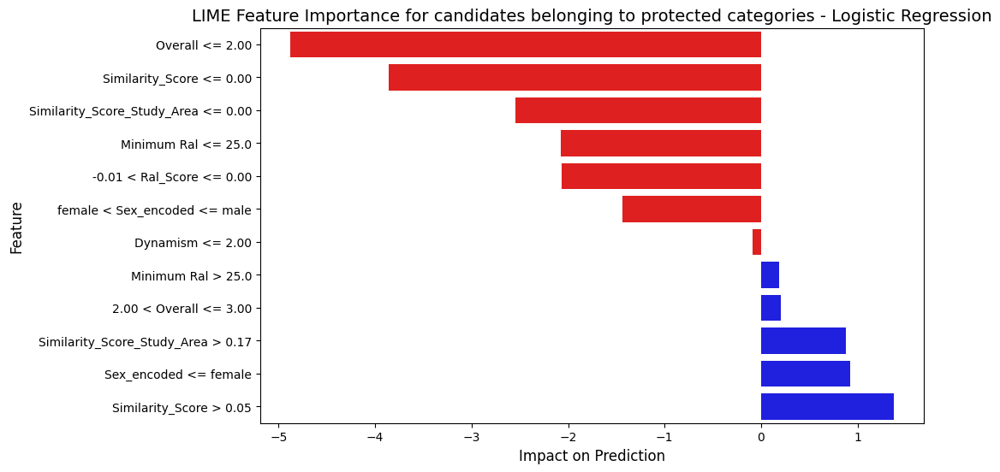

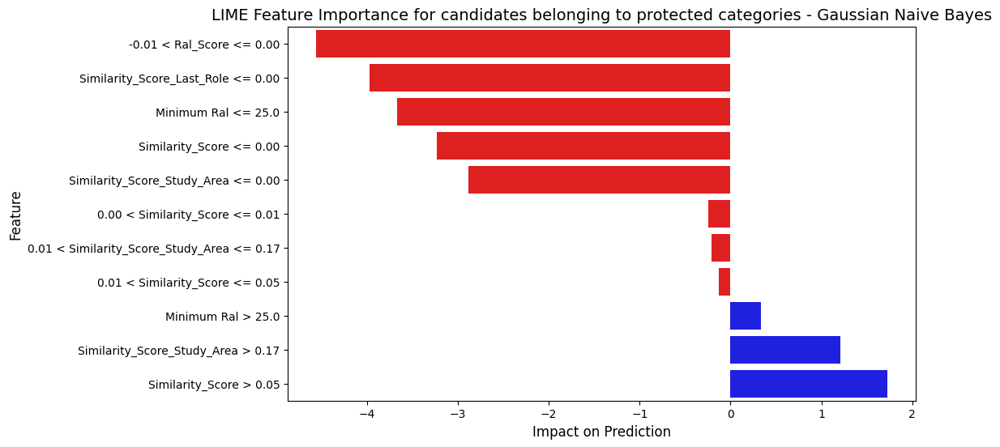

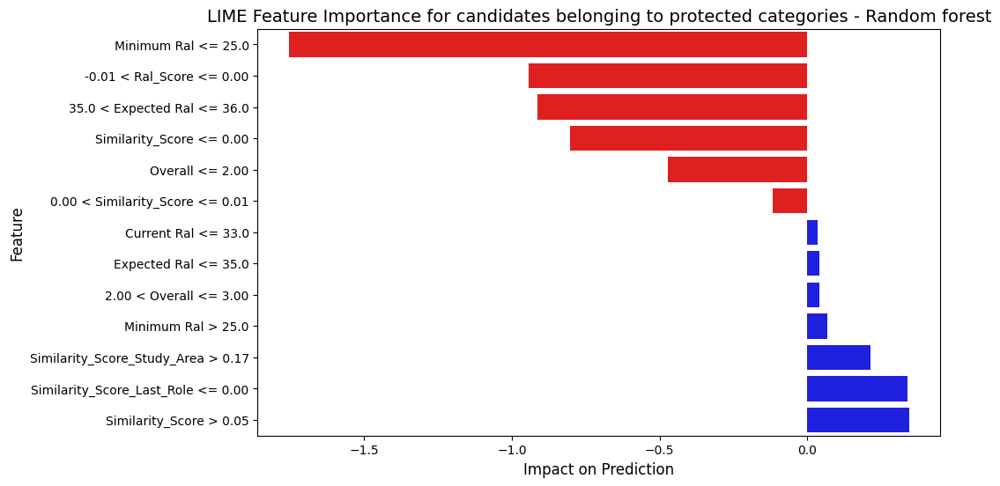

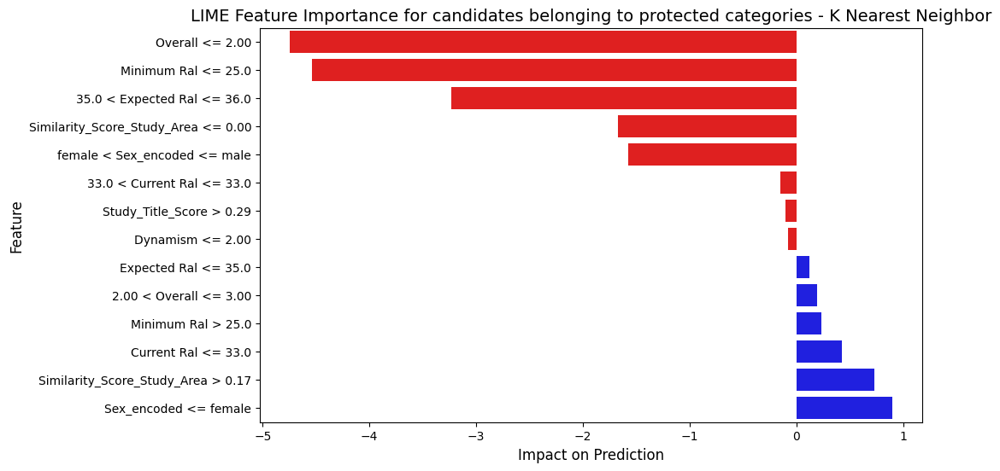

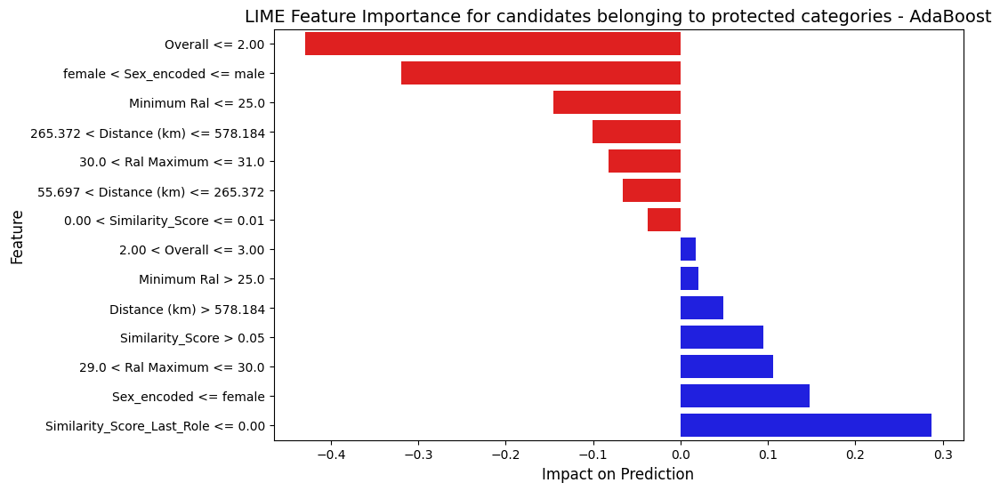

157/157 [==============================] - 0s 3ms/step


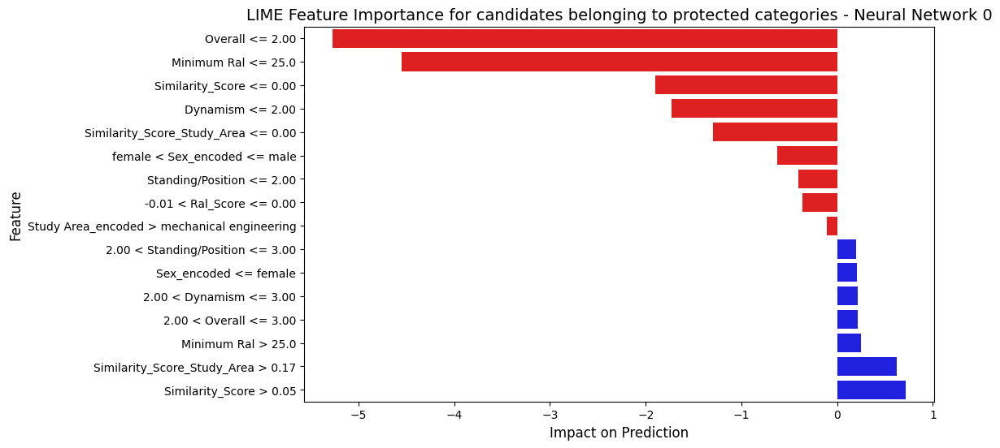

157/157 [==============================] - 0s 3ms/step


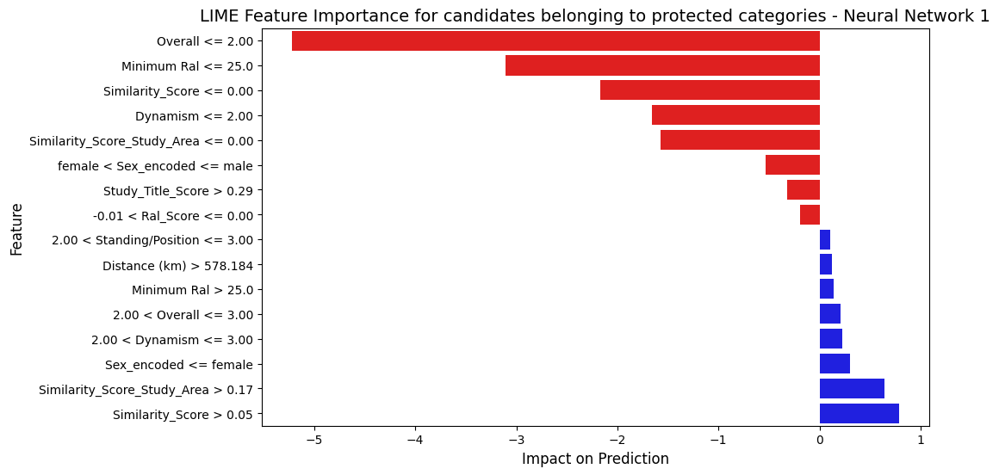

157/157 [==============================] - 0s 2ms/step


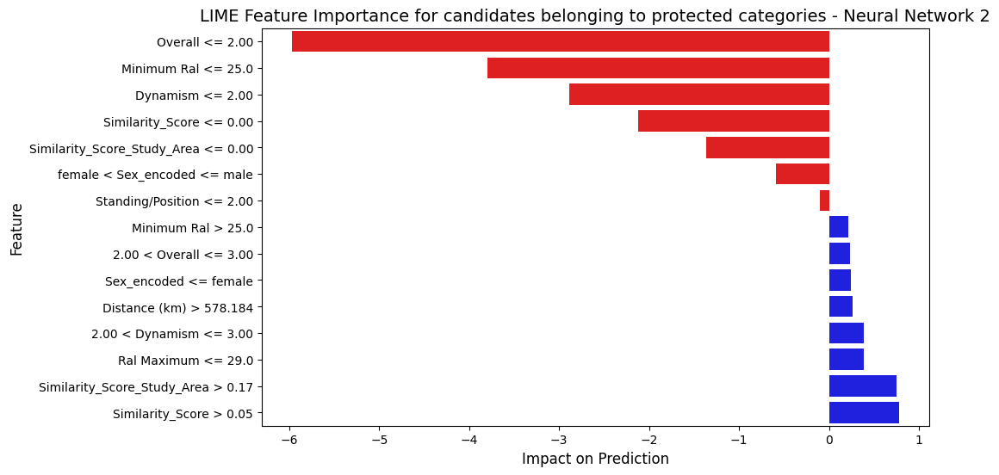

In [85]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for model_name, model in models.items():
        if hasattr(model, "predict_proba"):

            feature_importance = {}

            for i in protected_candidates:
                if model_name in ['Logistic Regression', 'Gaussian Naive Bayes', 'Linear Perceptron', 'Random forest', 'K Nearest Neighbor']:
                    exp = explainer2.explain_instance(X_test_selected.values[i], model.predict_proba, num_features=5)
                else:
                    exp = explainer1.explain_instance(X_test.values[i], model.predict_proba, num_features=5)
                f_list = exp.as_list()
                f_list = f_list[:21]
                for feature, weight in f_list:
                    if feature not in feature_importance:
                        feature_importance[feature] = 0
                    feature_importance[feature] += weight

            df_importance = pd.DataFrame(feature_importance.items(), columns=['Feature', 'Importance'])
            df_importance = sort_by_absolute_values(df_importance, 'Importance')
            #df_importance = df_importance.head(20)
            df_importance = df_importance.sort_values(by="Importance", ascending=True)

            for feature in df_importance['Feature']:
                for k in reverse_mapping.keys():
                  if k in feature:
                    new_feature = feature
                    if '>' in feature:
                      num1 = feature.split('>')[1]
                    elif feature.count('<') ==1:
                      num1 = feature.split('<')[1]
                    else:
                      num1 = feature.split('<')[0]
                      num2 = feature.split('<')[2]
                      num2 = num2.replace('=', '')
                      num2 = num2.strip()
                      if num2 not in reverse_mapping[k].keys():
                        n = findNearest(float(num2), list(reverse_mapping[k].keys()))
                        if type(reverse_mapping[k][n]) == str:
                          new_n = reverse_mapping[k][n]
                        else:
                          new_n = str(round(reverse_mapping[k][n], 3))
                        new_feature = feature.replace(num2,new_n)
                    num1 = num1.replace('=', '')
                    num1 = num1.strip()
                    if num1 not in reverse_mapping[k].keys():
                      n = findNearest(float(num1), list(reverse_mapping[k].keys()))
                      if type(reverse_mapping[k][n]) == str:
                        new_n = reverse_mapping[k][n]
                      else:
                        new_n = str(round(reverse_mapping[k][n], 3))
                      new_feature = new_feature.replace(num1, new_n)
                    df_importance.loc[df_importance['Feature'] == feature, 'Feature'] = new_feature

            plt.figure(figsize=(10, 6))
            sns.barplot(x="Importance", y="Feature", data=df_importance, palette=["red" if x < 0 else "blue" for x in df_importance["Importance"]])

            plt.title(f"LIME Feature Importance for candidates belonging to protected categories - {model_name}", fontsize=14)
            plt.xlabel("Impact on Prediction", fontsize=12)
            plt.ylabel("Feature", fontsize=12)

            plt.show()



In [86]:
under20_candidates = X_test[(X_test['Age Range_encoded'] == encoding_mappings['Age Range_encoded']['< 20 years'])].index
under20_candidates = np.random.choice(under20_candidates, size=100, replace=False)

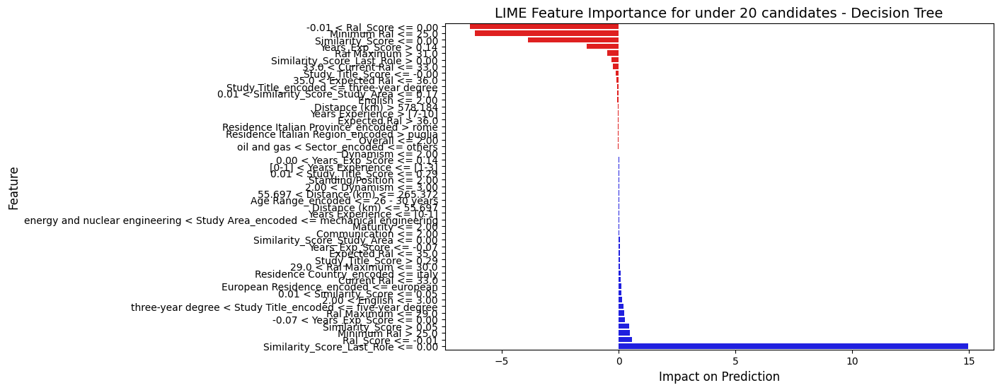

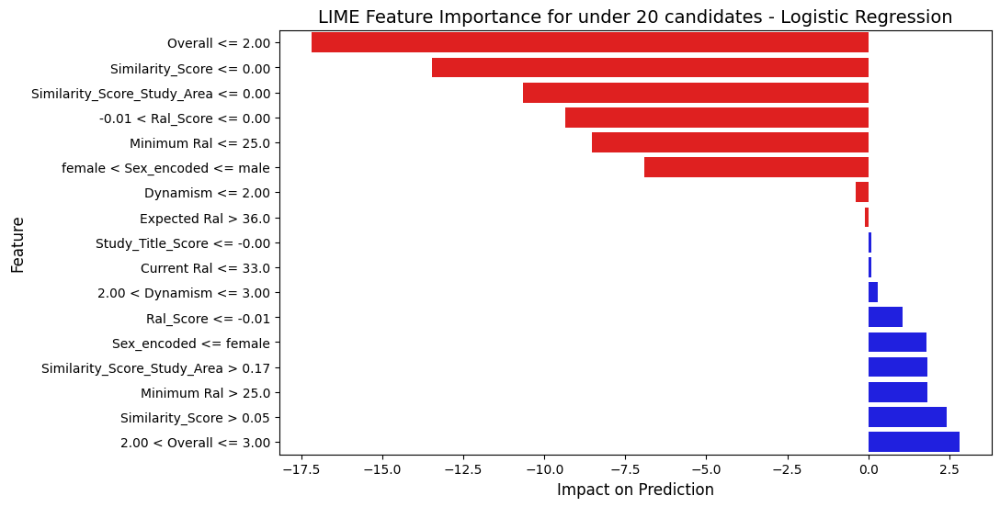

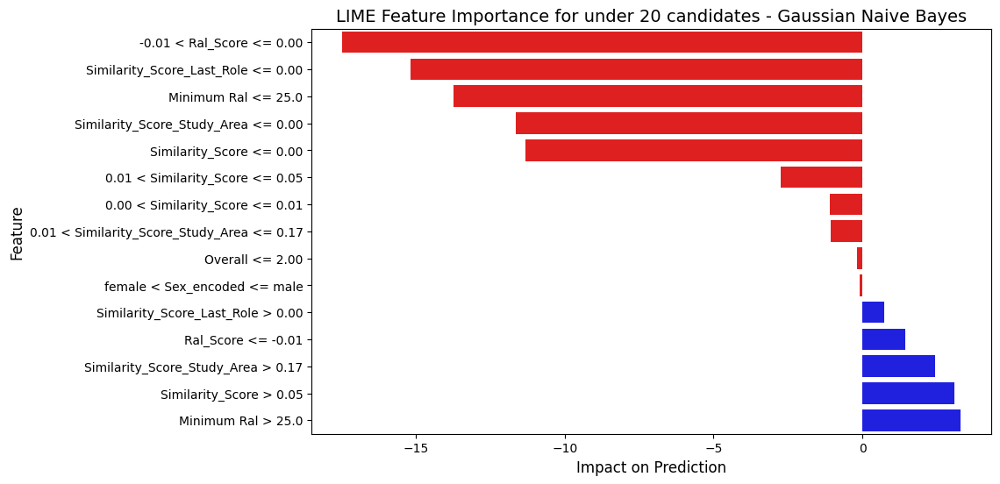

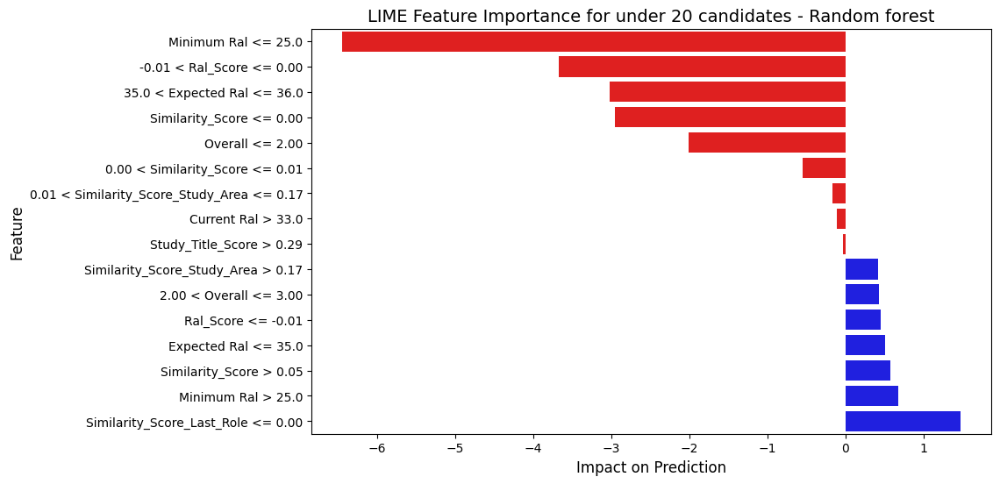

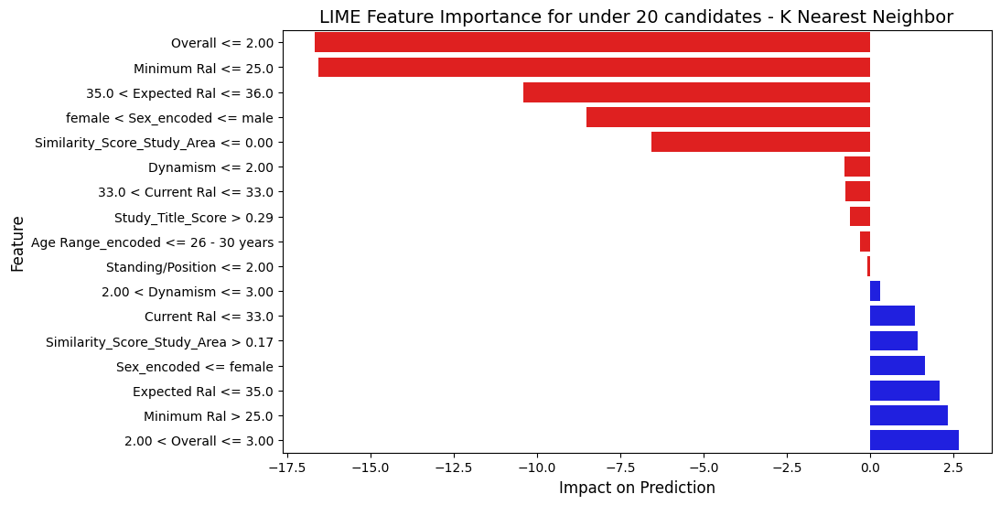

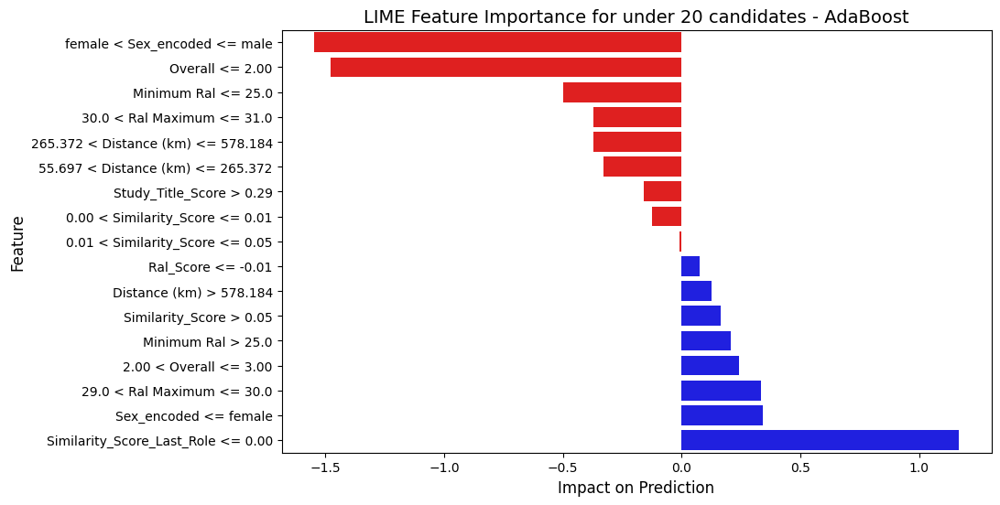

157/157 [==============================] - 0s 3ms/step


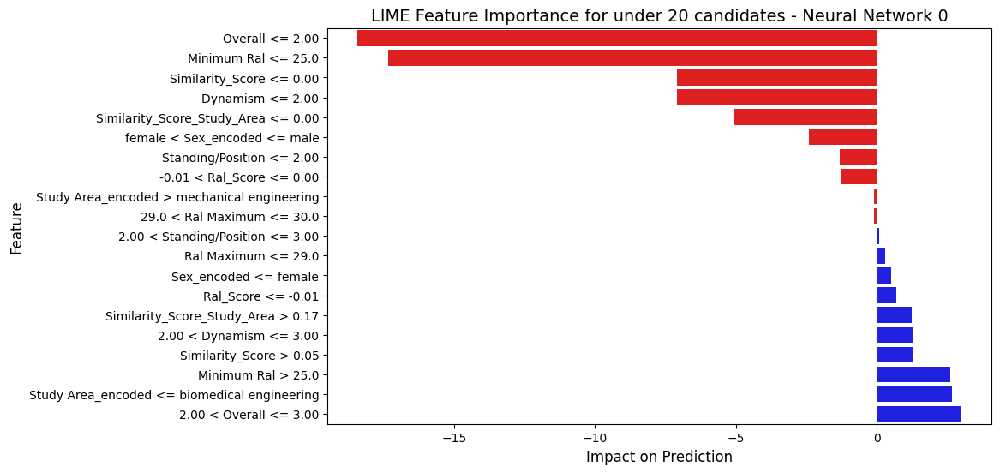

157/157 [==============================] - 1s 3ms/step


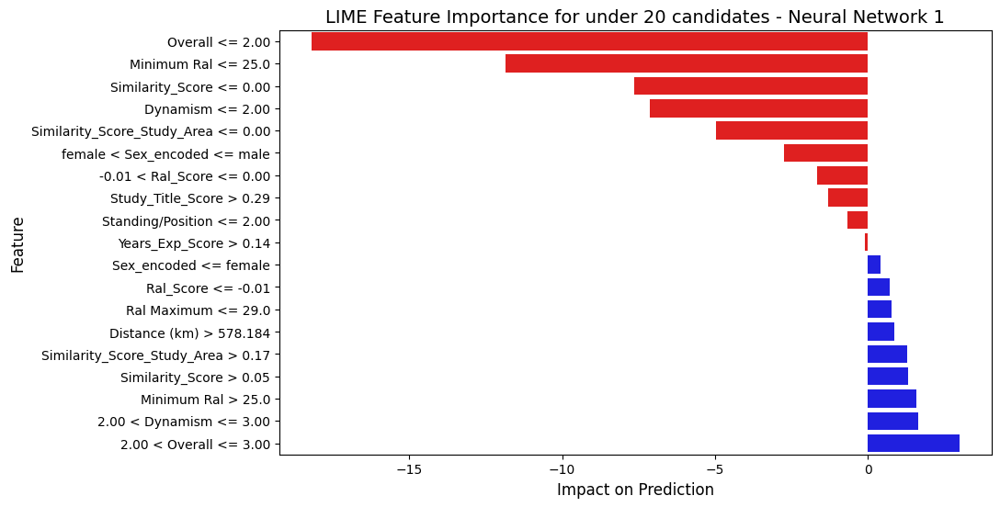

157/157 [==============================] - 1s 3ms/step


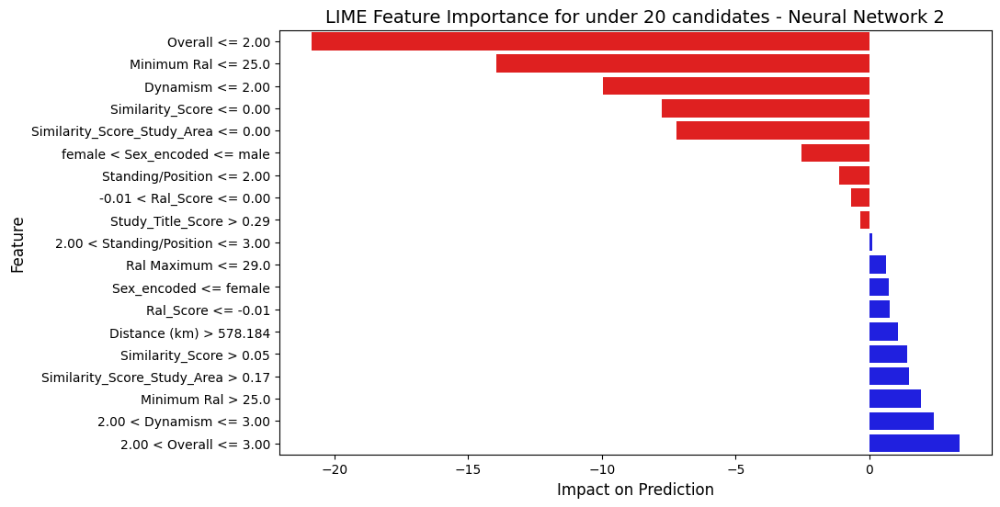

In [87]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for model_name, model in models.items():
        if hasattr(model, "predict_proba"):

            feature_importance = {}

            for i in under20_candidates:
                if model_name in ['Logistic Regression', 'Gaussian Naive Bayes', 'Linear Perceptron', 'Random forest', 'K Nearest Neighbor']:
                    exp = explainer2.explain_instance(X_test_selected.values[i], model.predict_proba, num_features=5)
                else:
                    exp = explainer1.explain_instance(X_test.values[i], model.predict_proba, num_features=5)
                f_list = exp.as_list()
                f_list = f_list[:21]
                for feature, weight in f_list:
                    if feature not in feature_importance:
                        feature_importance[feature] = 0
                    feature_importance[feature] += weight

            df_importance = pd.DataFrame(feature_importance.items(), columns=['Feature', 'Importance'])
            df_importance = sort_by_absolute_values(df_importance, 'Importance')
            #df_importance = df_importance.head(20)
            df_importance = df_importance.sort_values(by="Importance", ascending=True)

            for feature in df_importance['Feature']:
                for k in reverse_mapping.keys():
                  if k in feature:
                    new_feature = feature
                    if '>' in feature:
                      num1 = feature.split('>')[1]
                    elif feature.count('<') ==1:
                      num1 = feature.split('<')[1]
                    else:
                      num1 = feature.split('<')[0]
                      num2 = feature.split('<')[2]
                      num2 = num2.replace('=', '')
                      num2 = num2.strip()
                      if num2 not in reverse_mapping[k].keys():
                        n = findNearest(float(num2), list(reverse_mapping[k].keys()))
                        if type(reverse_mapping[k][n]) == str:
                          new_n = reverse_mapping[k][n]
                        else:
                          new_n = str(round(reverse_mapping[k][n], 3))
                        new_feature = feature.replace(num2,new_n)
                    num1 = num1.replace('=', '')
                    num1 = num1.strip()
                    if num1 not in reverse_mapping[k].keys():
                      n = findNearest(float(num1), list(reverse_mapping[k].keys()))
                      if type(reverse_mapping[k][n]) == str:
                        new_n = reverse_mapping[k][n]
                      else:
                        new_n = str(round(reverse_mapping[k][n], 3))
                      new_feature = new_feature.replace(num1, new_n)
                    df_importance.loc[df_importance['Feature'] == feature, 'Feature'] = new_feature

            plt.figure(figsize=(10, 6))
            sns.barplot(x="Importance", y="Feature", data=df_importance, palette=["red" if x < 0 else "blue" for x in df_importance["Importance"]])

            plt.title(f"LIME Feature Importance for under 20 candidates - {model_name}", fontsize=14)
            plt.xlabel("Impact on Prediction", fontsize=12)
            plt.ylabel("Feature", fontsize=12)

            plt.show()



In [88]:
non_italian_candidates = X_test[(X_test['Italian Residence_encoded'] == encoding_mappings['Italian Residence_encoded']['no'])].index
non_italian_candidates

Index([  22,   56,   64,   89,  137,  142,  144,  179,  207,  210,
       ...
       3831, 3838, 3888, 3913, 3970, 3974, 4003, 4052, 4106, 4188],
      dtype='int64', length=150)

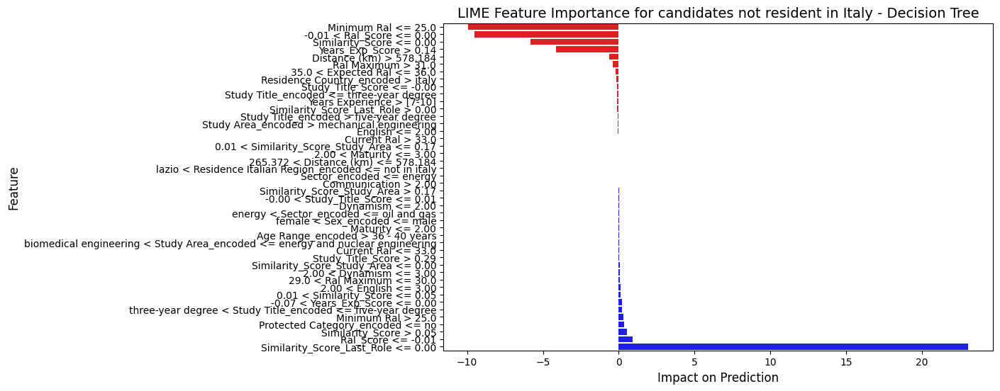

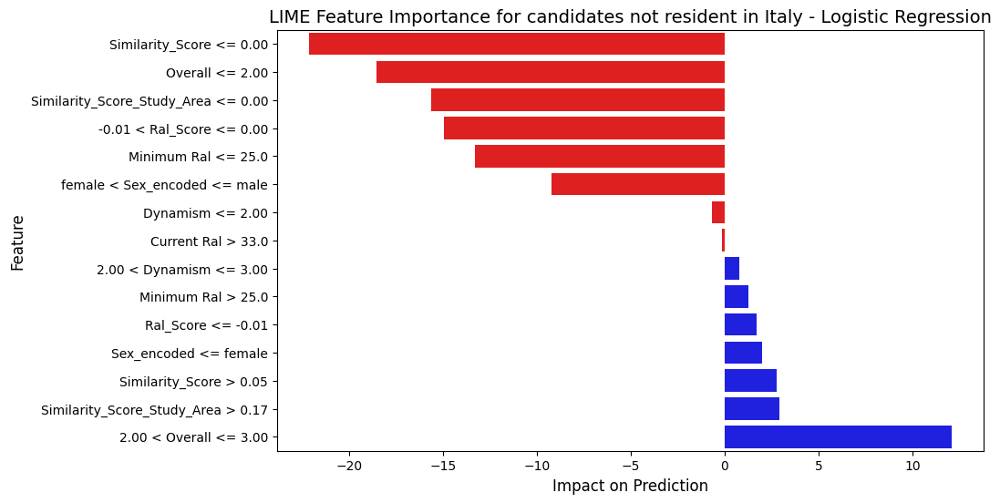

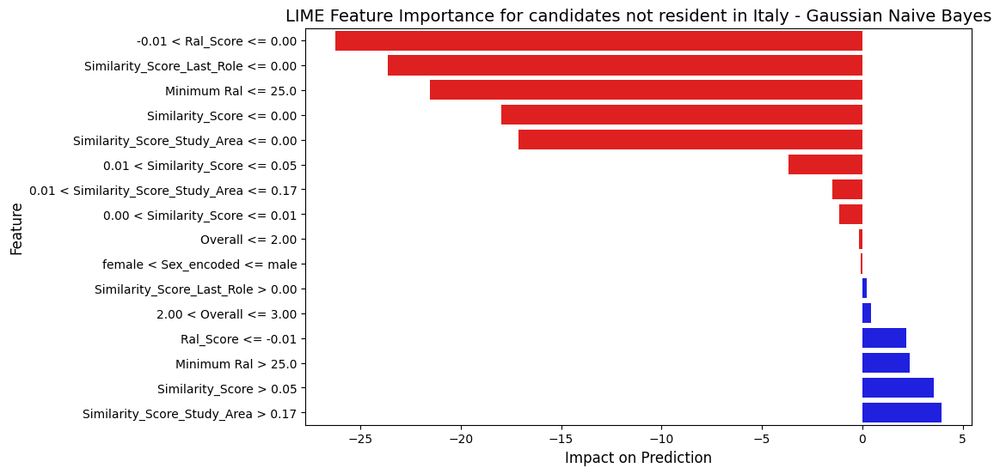

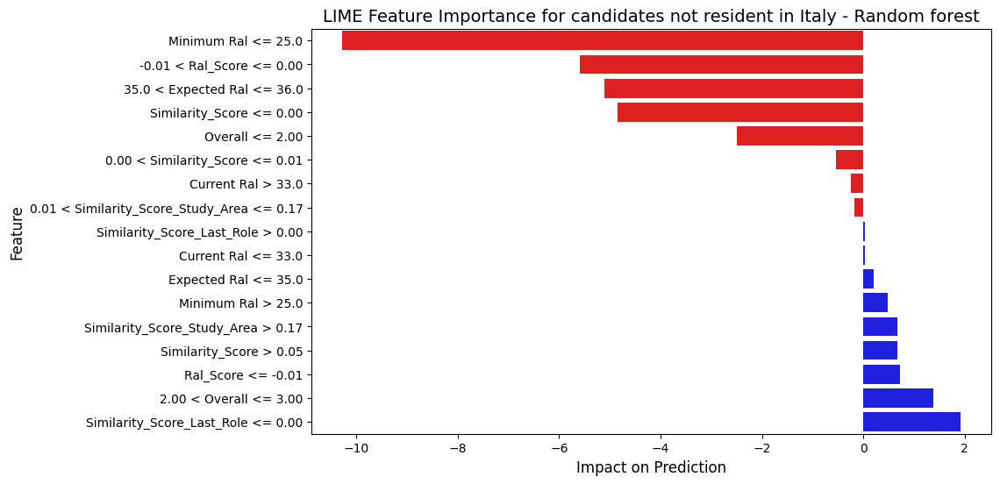

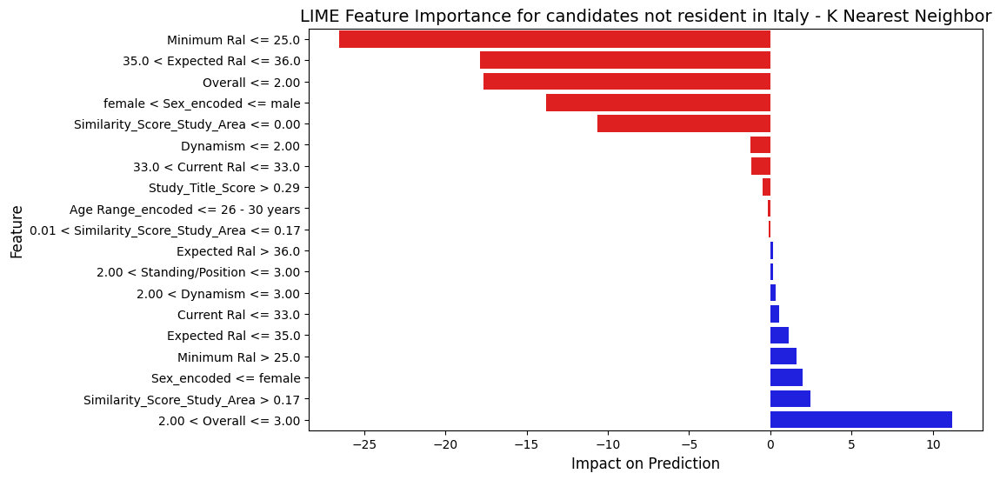

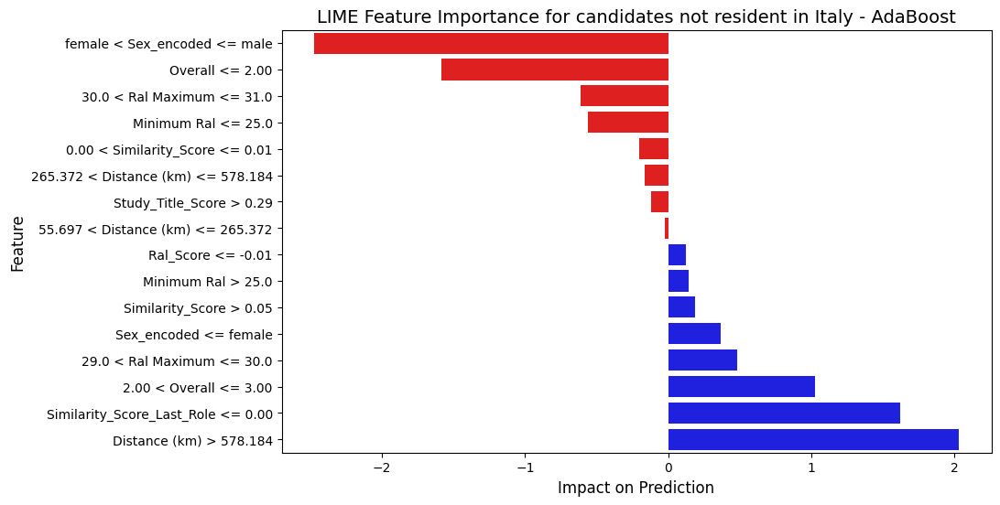

157/157 [==============================] - 1s 3ms/step


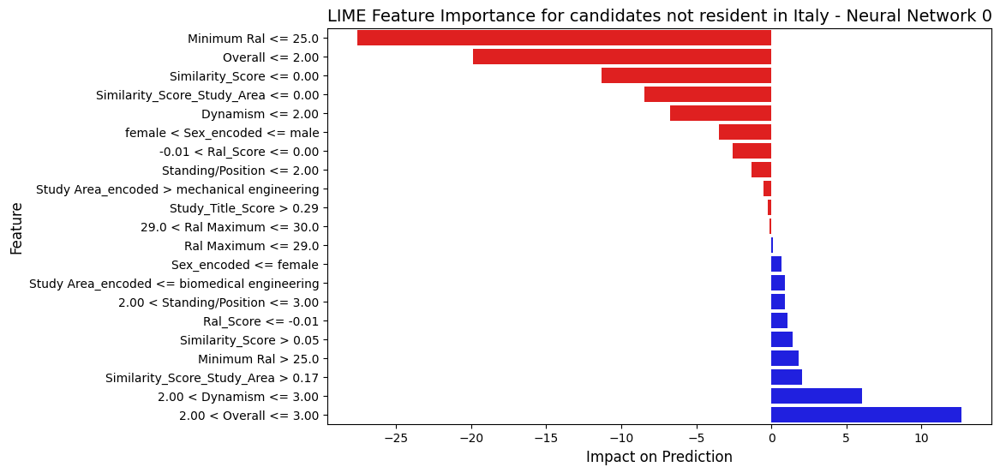

157/157 [==============================] - 1s 3ms/step


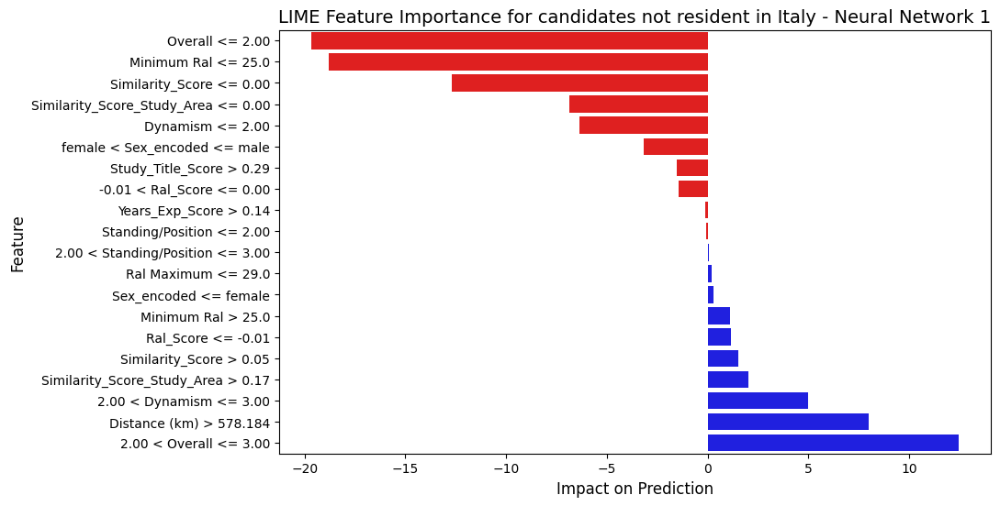

157/157 [==============================] - 1s 3ms/step


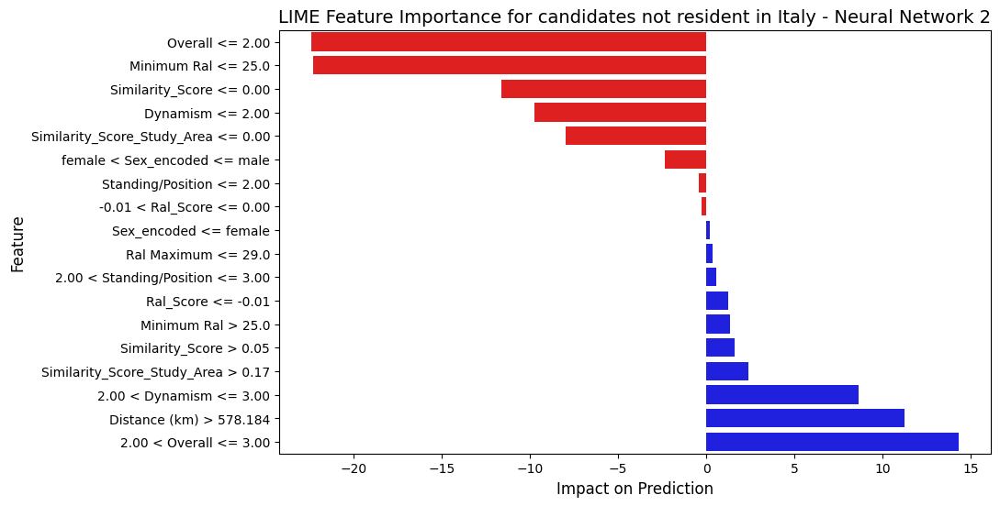

In [89]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for model_name, model in models.items():
        if hasattr(model, "predict_proba"):

            feature_importance = {}

            for i in non_italian_candidates:
                if model_name in ['Logistic Regression', 'Gaussian Naive Bayes', 'Linear Perceptron', 'Random forest', 'K Nearest Neighbor']:
                    exp = explainer2.explain_instance(X_test_selected.values[i], model.predict_proba, num_features=5)
                else:
                    exp = explainer1.explain_instance(X_test.values[i], model.predict_proba, num_features=5)
                f_list = exp.as_list()
                f_list = f_list[:21]
                for feature, weight in f_list:
                    if feature not in feature_importance:
                        feature_importance[feature] = 0
                    feature_importance[feature] += weight

            df_importance = pd.DataFrame(feature_importance.items(), columns=['Feature', 'Importance'])
            df_importance = sort_by_absolute_values(df_importance, 'Importance')
            #df_importance = df_importance.head(20)
            df_importance = df_importance.sort_values(by="Importance", ascending=True)

            for feature in df_importance['Feature']:
                for k in reverse_mapping.keys():
                  if k in feature:
                    new_feature = feature
                    if '>' in feature:
                      num1 = feature.split('>')[1]
                    elif feature.count('<') ==1:
                      num1 = feature.split('<')[1]
                    else:
                      num1 = feature.split('<')[0]
                      num2 = feature.split('<')[2]
                      num2 = num2.replace('=', '')
                      num2 = num2.strip()
                      if num2 not in reverse_mapping[k].keys():
                        n = findNearest(float(num2), list(reverse_mapping[k].keys()))
                        if type(reverse_mapping[k][n]) == str:
                          new_n = reverse_mapping[k][n]
                        else:
                          new_n = str(round(reverse_mapping[k][n], 3))
                        new_feature = feature.replace(num2,new_n)
                    num1 = num1.replace('=', '')
                    num1 = num1.strip()
                    if num1 not in reverse_mapping[k].keys():
                      n = findNearest(float(num1), list(reverse_mapping[k].keys()))
                      if type(reverse_mapping[k][n]) == str:
                        new_n = reverse_mapping[k][n]
                      else:
                        new_n = str(round(reverse_mapping[k][n], 3))
                      new_feature = new_feature.replace(num1, new_n)
                    df_importance.loc[df_importance['Feature'] == feature, 'Feature'] = new_feature

            plt.figure(figsize=(10, 6))
            sns.barplot(x="Importance", y="Feature", data=df_importance, palette=["red" if x < 0 else "blue" for x in df_importance["Importance"]])

            plt.title(f"LIME Feature Importance for candidates not resident in Italy - {model_name}", fontsize=14)
            plt.xlabel("Impact on Prediction", fontsize=12)
            plt.ylabel("Feature", fontsize=12)

            plt.show()



In [91]:
male_candidates = X_test[(X_test['Sex_encoded'] == encoding_mappings['Sex_encoded']['male'])].index
male_candidates = np.random.choice(male_candidates, size=50, replace=False)

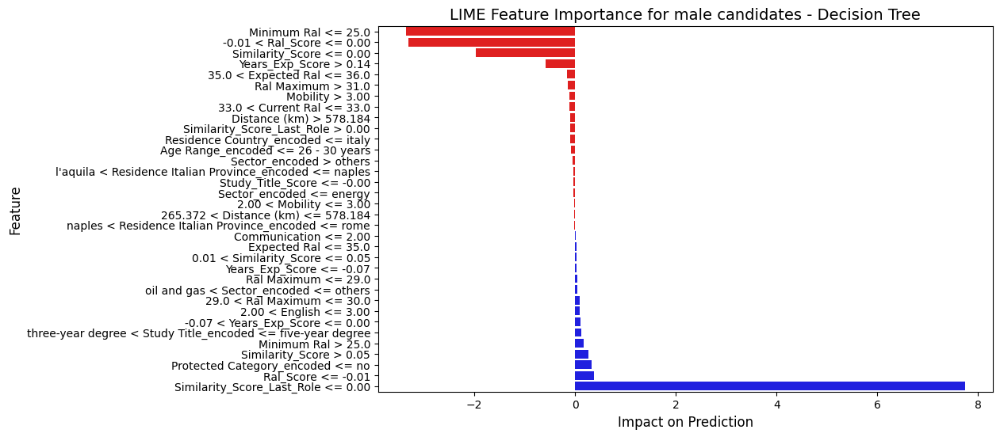

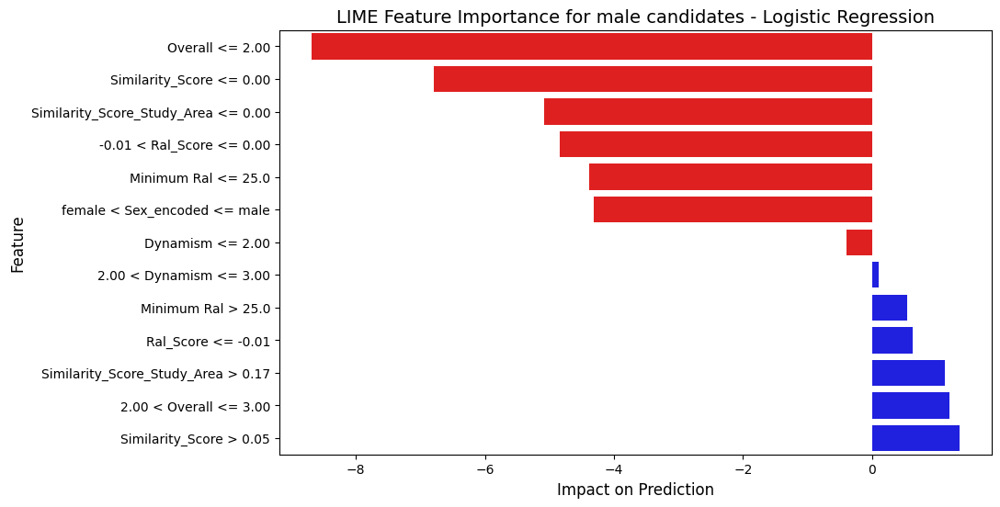

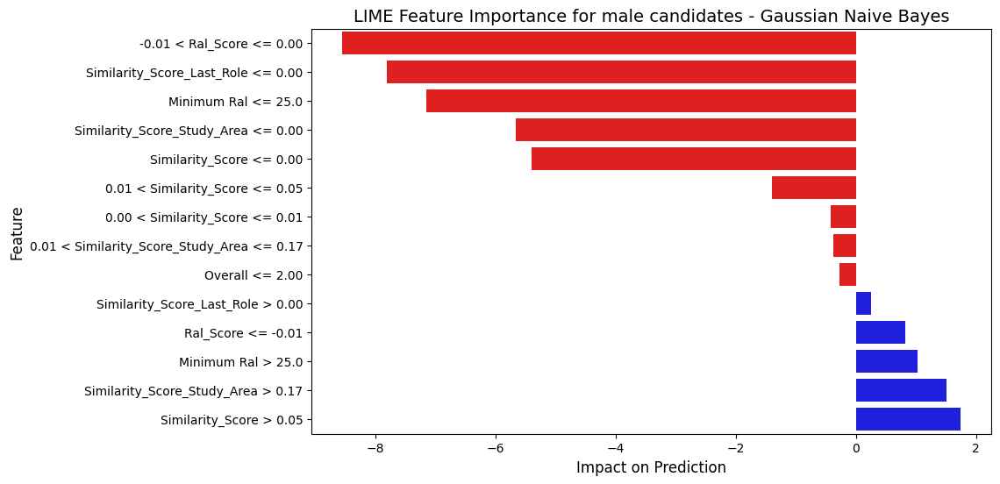

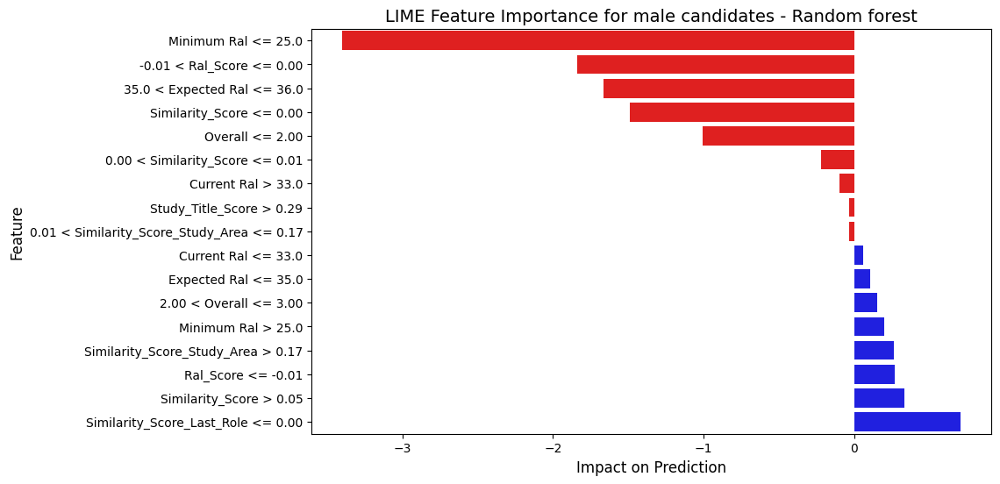

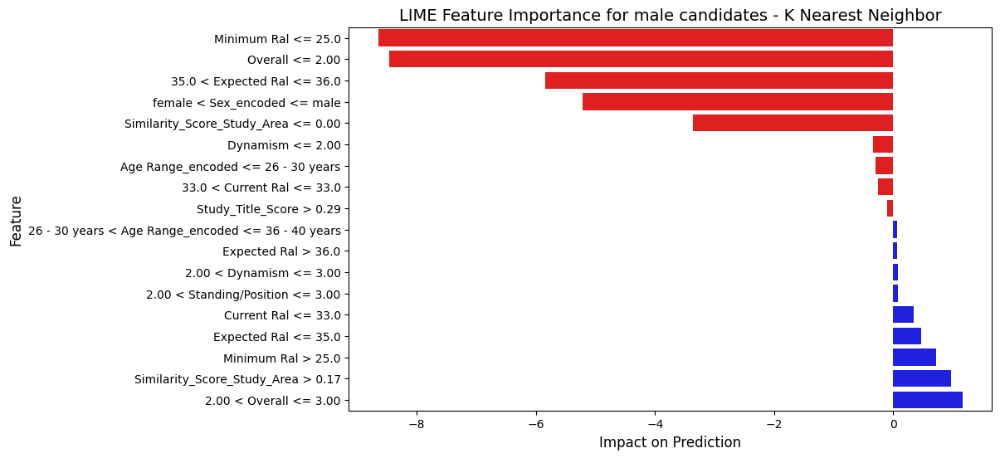

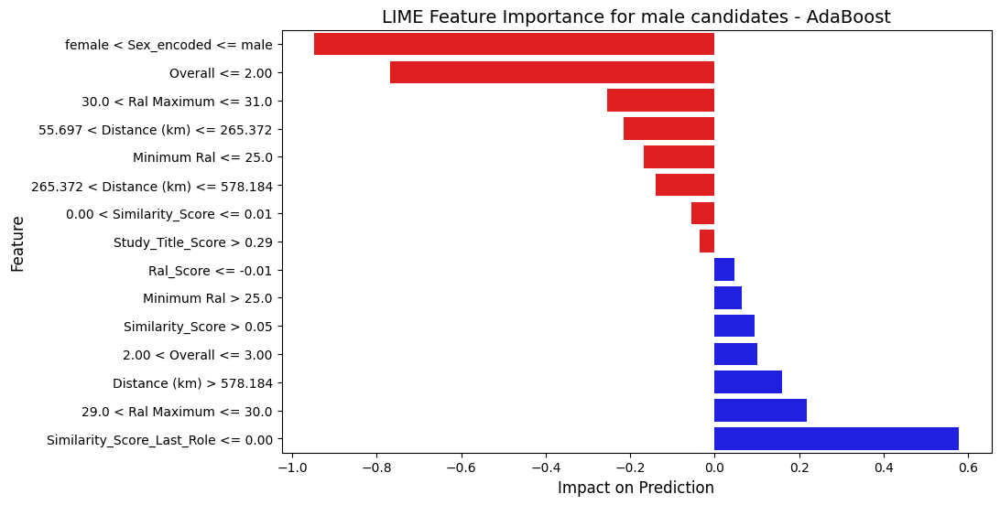

157/157 [==============================] - 0s 3ms/step


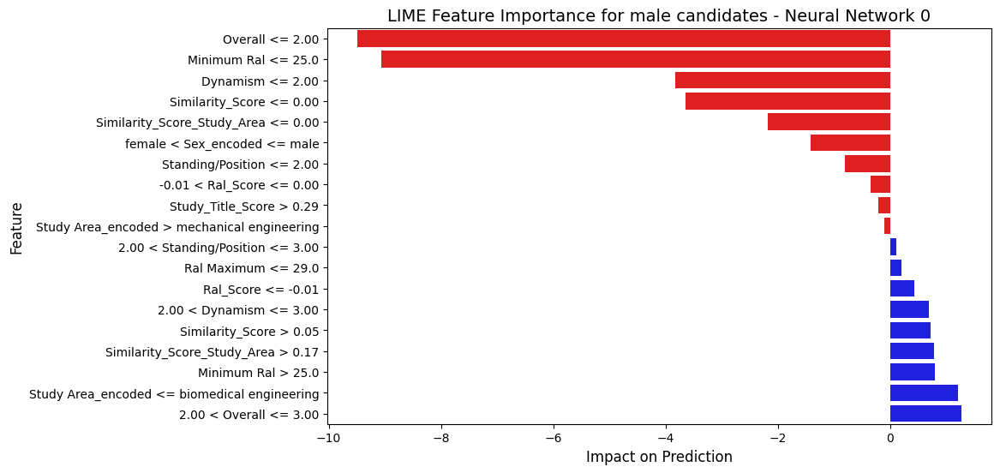

157/157 [==============================] - 1s 3ms/step


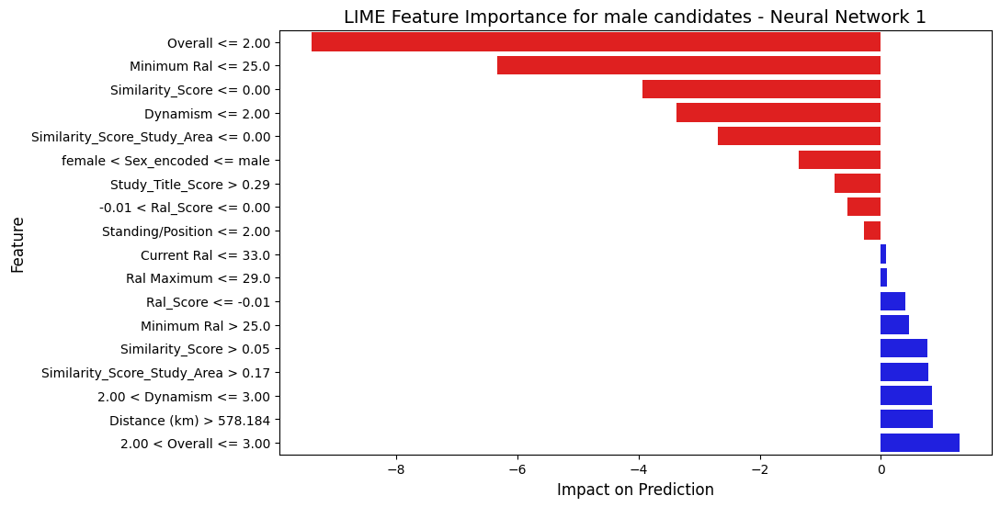

157/157 [==============================] - 0s 3ms/step


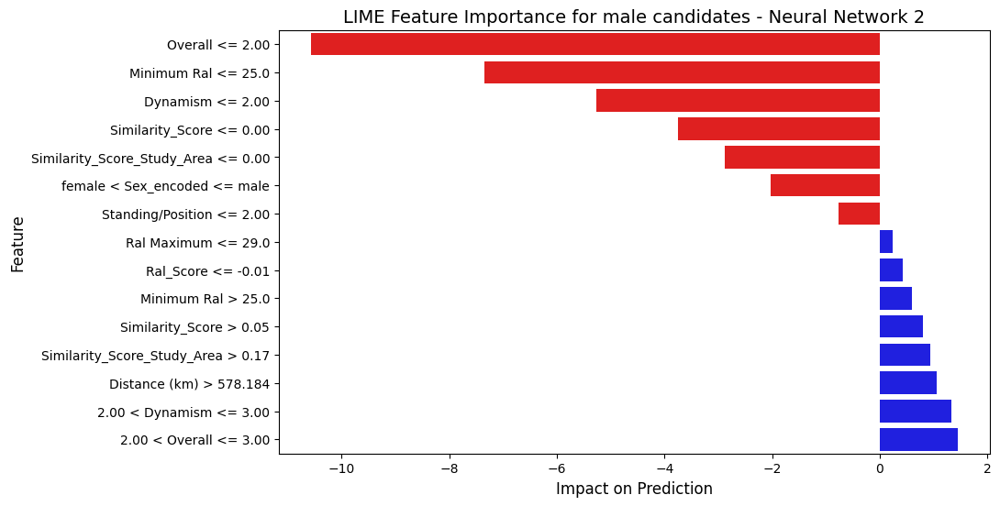

In [92]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for model_name, model in models.items():
        if hasattr(model, "predict_proba"):

            feature_importance = {}

            for i in male_candidates:
                if model_name in ['Logistic Regression', 'Gaussian Naive Bayes', 'Linear Perceptron', 'Random forest', 'K Nearest Neighbor']:
                    exp = explainer2.explain_instance(X_test_selected.values[i], model.predict_proba, num_features=5)
                else:
                    exp = explainer1.explain_instance(X_test.values[i], model.predict_proba, num_features=5)
                f_list = exp.as_list()
                f_list = f_list[:21]
                for feature, weight in f_list:
                    if feature not in feature_importance:
                        feature_importance[feature] = 0
                    feature_importance[feature] += weight

            df_importance = pd.DataFrame(feature_importance.items(), columns=['Feature', 'Importance'])
            df_importance = sort_by_absolute_values(df_importance, 'Importance')
            #df_importance = df_importance.head(20)
            df_importance = df_importance.sort_values(by="Importance", ascending=True)

            for feature in df_importance['Feature']:
                for k in reverse_mapping.keys():
                  if k in feature:
                    new_feature = feature
                    if '>' in feature:
                      num1 = feature.split('>')[1]
                    elif feature.count('<') ==1:
                      num1 = feature.split('<')[1]
                    else:
                      num1 = feature.split('<')[0]
                      num2 = feature.split('<')[2]
                      num2 = num2.replace('=', '')
                      num2 = num2.strip()
                      if num2 not in reverse_mapping[k].keys():
                        n = findNearest(float(num2), list(reverse_mapping[k].keys()))
                        if type(reverse_mapping[k][n]) == str:
                          new_n = reverse_mapping[k][n]
                        else:
                          new_n = str(round(reverse_mapping[k][n], 3))
                        new_feature = feature.replace(num2,new_n)
                    num1 = num1.replace('=', '')
                    num1 = num1.strip()
                    if num1 not in reverse_mapping[k].keys():
                      n = findNearest(float(num1), list(reverse_mapping[k].keys()))
                      if type(reverse_mapping[k][n]) == str:
                        new_n = reverse_mapping[k][n]
                      else:
                        new_n = str(round(reverse_mapping[k][n], 3))
                      new_feature = new_feature.replace(num1, new_n)
                    df_importance.loc[df_importance['Feature'] == feature, 'Feature'] = new_feature

            plt.figure(figsize=(10, 6))
            sns.barplot(x="Importance", y="Feature", data=df_importance, palette=["red" if x < 0 else "blue" for x in df_importance["Importance"]])

            plt.title(f"LIME Feature Importance for male candidates - {model_name}", fontsize=14)
            plt.xlabel("Impact on Prediction", fontsize=12)
            plt.ylabel("Feature", fontsize=12)

            plt.show()



In [93]:
non_eu_candidates = X_test[(X_test['European Residence_encoded'] == encoding_mappings['European Residence_encoded']['non-european'])].index
len(non_eu_candidates)

102

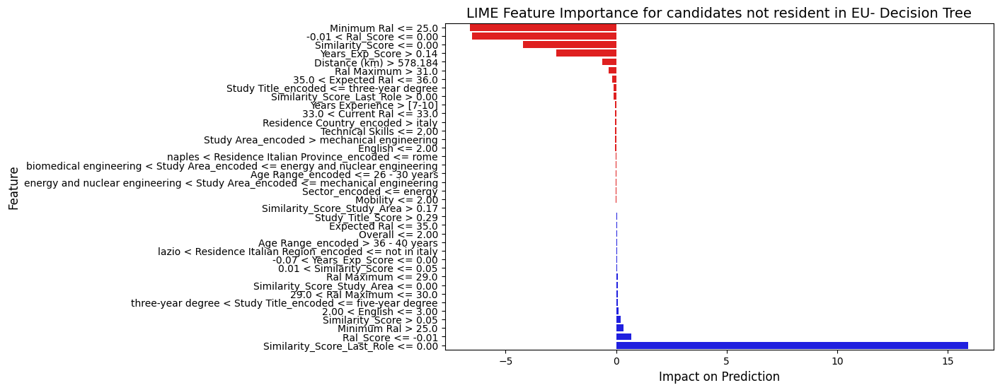

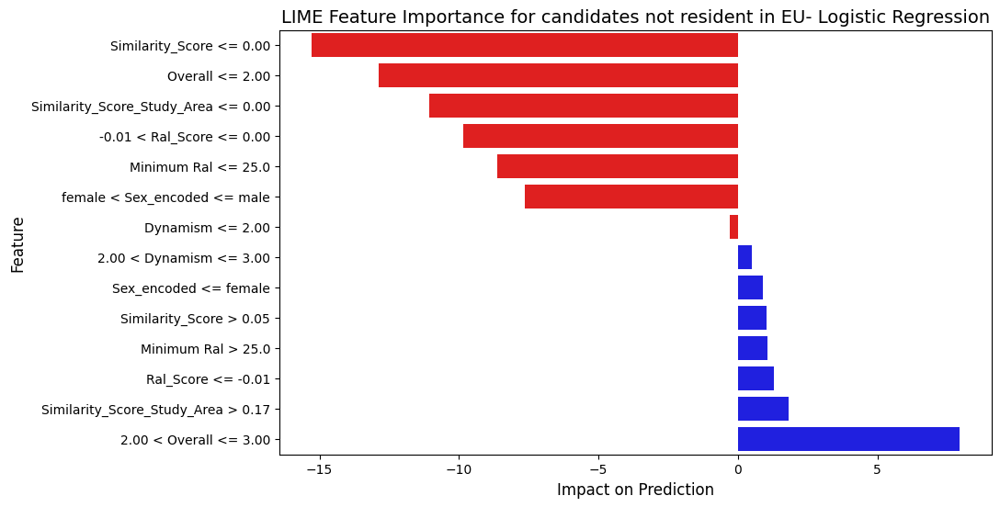

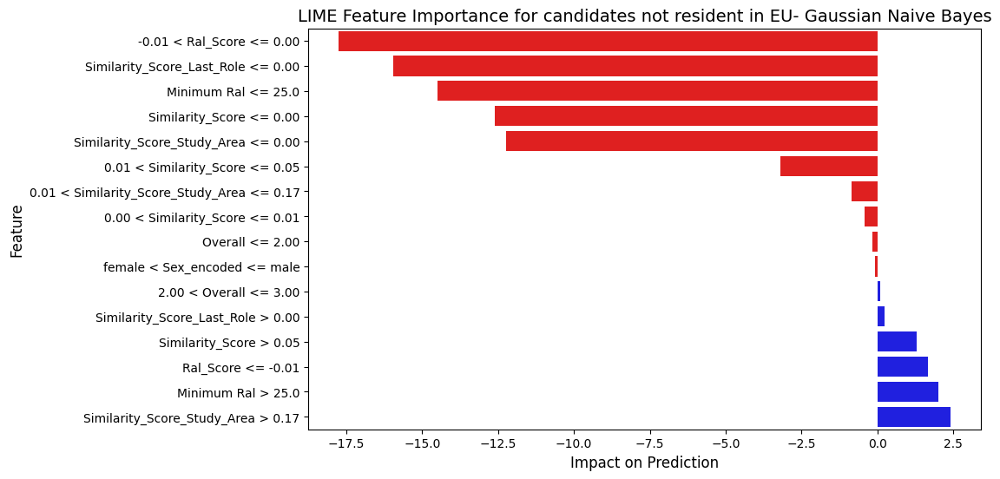

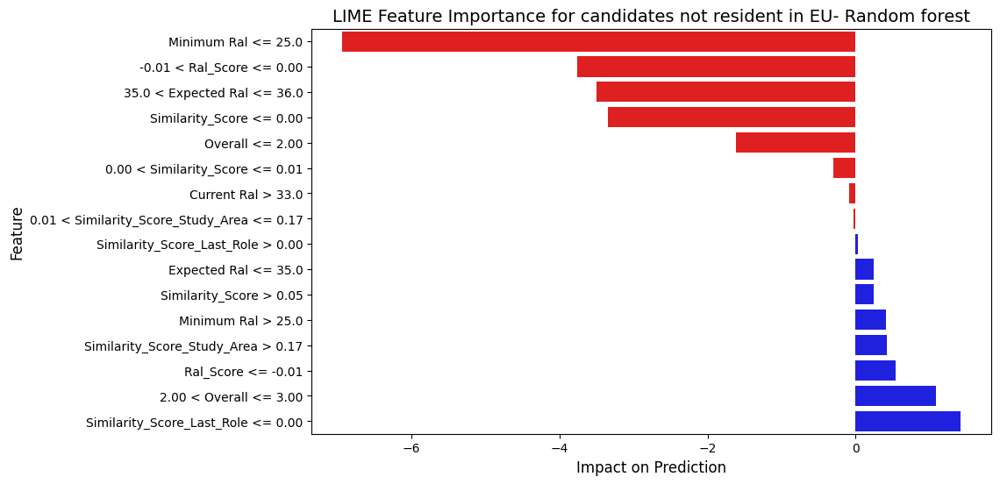

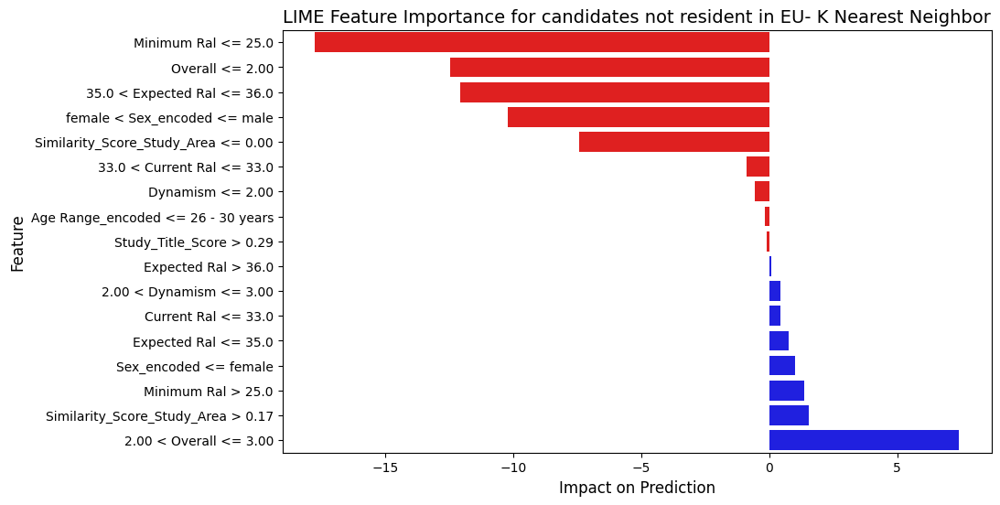

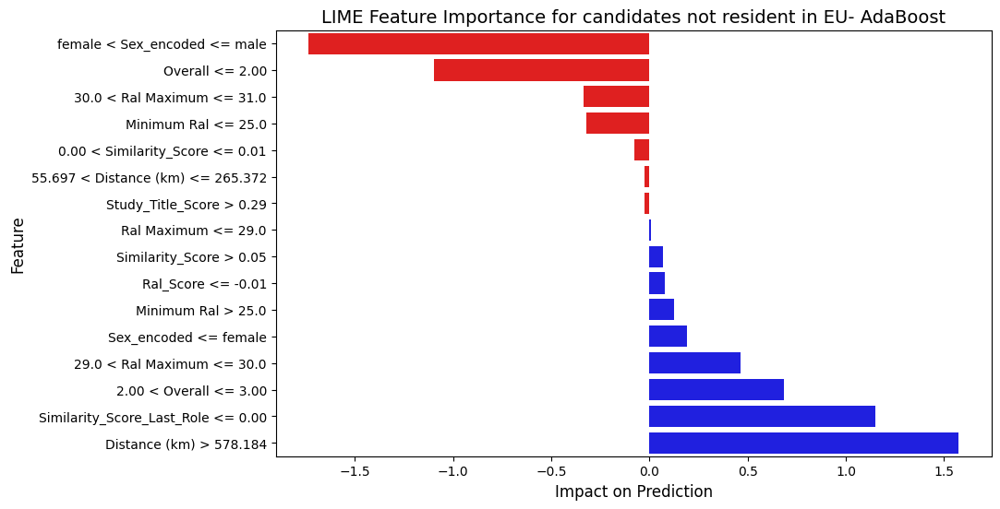

157/157 [==============================] - 0s 3ms/step


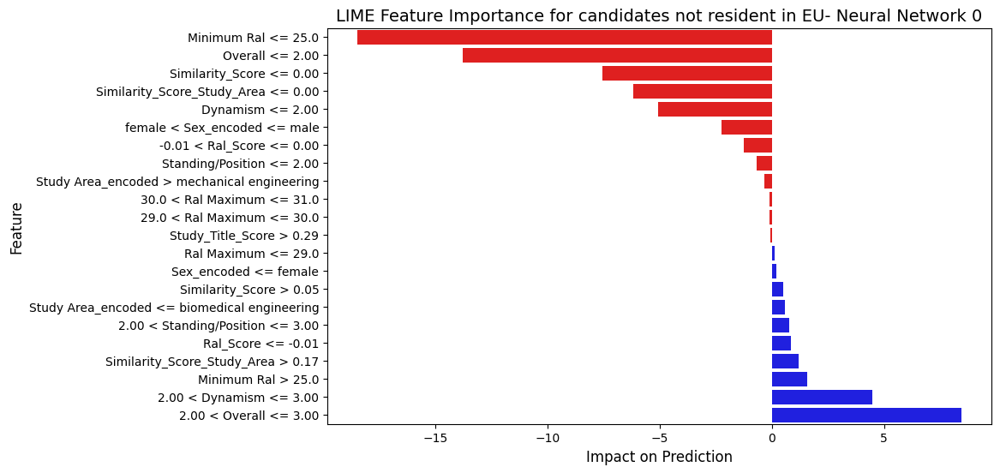

157/157 [==============================] - 0s 3ms/step


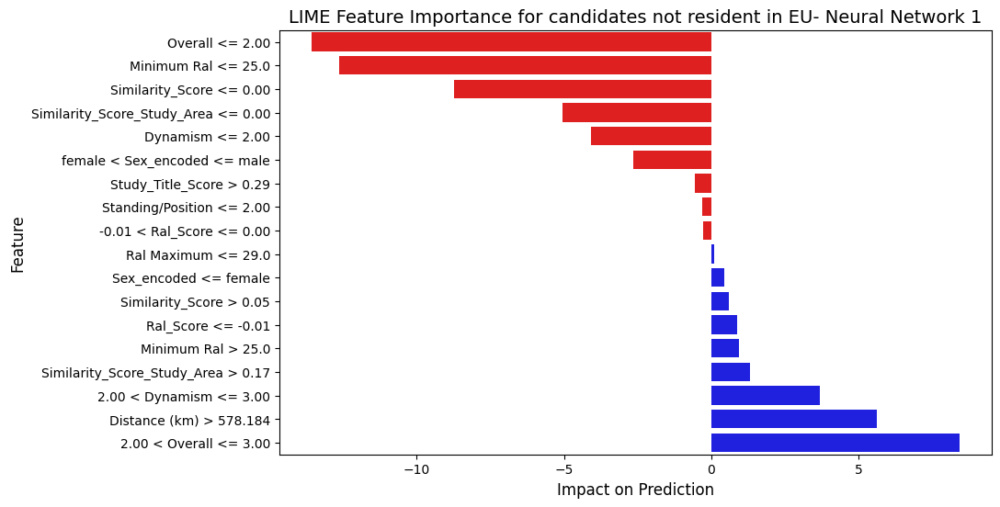

157/157 [==============================] - 1s 3ms/step


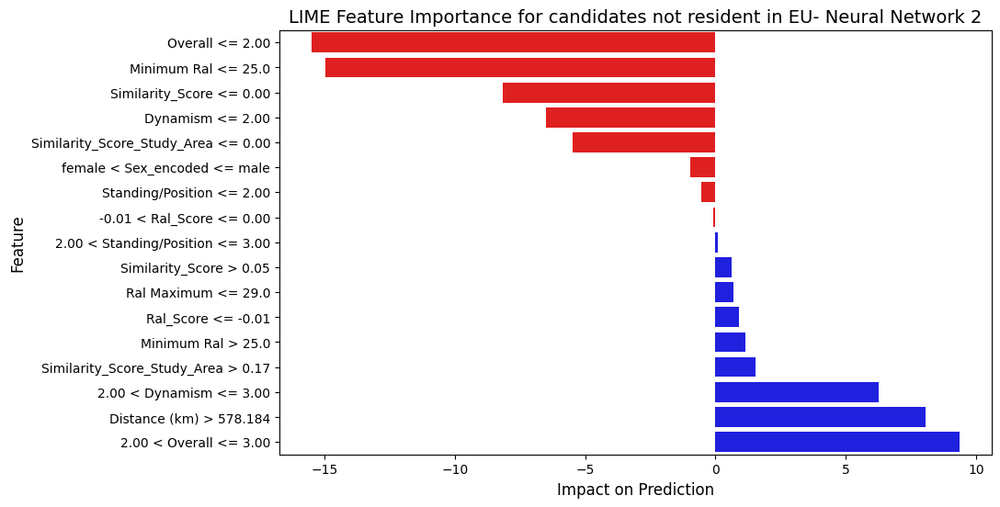

In [94]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for model_name, model in models.items():
        if hasattr(model, "predict_proba"):

            feature_importance = {}

            for i in non_eu_candidates:
                if model_name in ['Logistic Regression', 'Gaussian Naive Bayes', 'Linear Perceptron', 'Random forest', 'K Nearest Neighbor']:
                    exp = explainer2.explain_instance(X_test_selected.values[i], model.predict_proba, num_features=5)
                else:
                    exp = explainer1.explain_instance(X_test.values[i], model.predict_proba, num_features=5)
                f_list = exp.as_list()
                f_list = f_list[:21]
                for feature, weight in f_list:
                    if feature not in feature_importance:
                        feature_importance[feature] = 0
                    feature_importance[feature] += weight

            df_importance = pd.DataFrame(feature_importance.items(), columns=['Feature', 'Importance'])
            df_importance = sort_by_absolute_values(df_importance, 'Importance')
            #df_importance = df_importance.head(20)
            df_importance = df_importance.sort_values(by="Importance", ascending=True)

            for feature in df_importance['Feature']:
                for k in reverse_mapping.keys():
                  if k in feature:
                    new_feature = feature
                    if '>' in feature:
                      num1 = feature.split('>')[1]
                    elif feature.count('<') ==1:
                      num1 = feature.split('<')[1]
                    else:
                      num1 = feature.split('<')[0]
                      num2 = feature.split('<')[2]
                      num2 = num2.replace('=', '')
                      num2 = num2.strip()
                      if num2 not in reverse_mapping[k].keys():
                        n = findNearest(float(num2), list(reverse_mapping[k].keys()))
                        if type(reverse_mapping[k][n]) == str:
                          new_n = reverse_mapping[k][n]
                        else:
                          new_n = str(round(reverse_mapping[k][n], 3))
                        new_feature = feature.replace(num2,new_n)
                    num1 = num1.replace('=', '')
                    num1 = num1.strip()
                    if num1 not in reverse_mapping[k].keys():
                      n = findNearest(float(num1), list(reverse_mapping[k].keys()))
                      if type(reverse_mapping[k][n]) == str:
                        new_n = reverse_mapping[k][n]
                      else:
                        new_n = str(round(reverse_mapping[k][n], 3))
                      new_feature = new_feature.replace(num1, new_n)
                    df_importance.loc[df_importance['Feature'] == feature, 'Feature'] = new_feature

            plt.figure(figsize=(10, 6))
            sns.barplot(x="Importance", y="Feature", data=df_importance, palette=["red" if x < 0 else "blue" for x in df_importance["Importance"]])

            plt.title(f"LIME Feature Importance for candidates not resident in EU- {model_name}", fontsize=14)
            plt.xlabel("Impact on Prediction", fontsize=12)
            plt.ylabel("Feature", fontsize=12)

            plt.show()



###Shap

In [97]:
def create_explanations(model, X, name):
    if name.startswith('Neural Network') :
        explainer = shap.GradientExplainer ( model, X_test.values)
        #shap_values = explainer.shap_values(X_test.values)[:1000][:][0]
        shap_values = explainer.shap_values(X_test.values)[:1000].squeeze()
        print("shap shape:", shap_values.shape)
        return shap_values, X

    if name.startswith('Best NN Random Search'):
        explainer = shap.GradientExplainer (model.model, X_test.values)
        #shap_values = explainer.shap_values(X_test.values)[:1000][:][0]
        shap_values = explainer.shap_values(X_test.values)[:1000].squeeze()
        print("shap shape:", shap_values.shape)
        return shap_values, X

    # Add feature names
    explainer = shap.Explainer(model, X)
    explanations = explainer(X)
    return explanations, X

def summaryPlot(model, X, plot_type, plot_name):
    lf = list(X)
    explanations, X = create_explanations(model, X, plot_name)

    # Create plot
    fig, ax = plt.subplots()
    plt.title(f"{plot_name}")
    shap.summary_plot(explanations, X, lf, show=False, plot_size=None, plot_type=plot_type, max_display=len(lf), sort=True)
    plt.tight_layout()
    plt.show()
    plt.close()

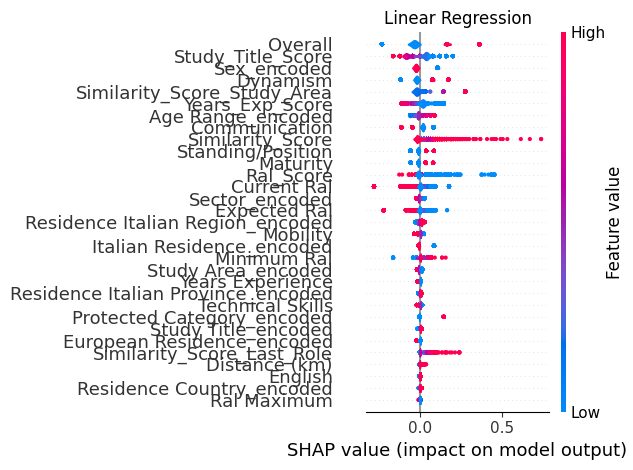

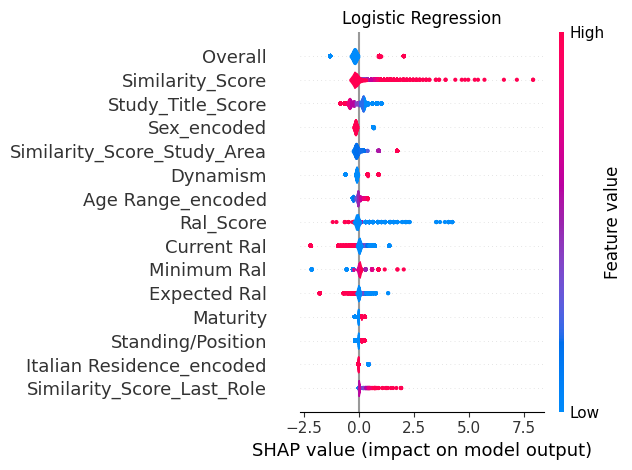

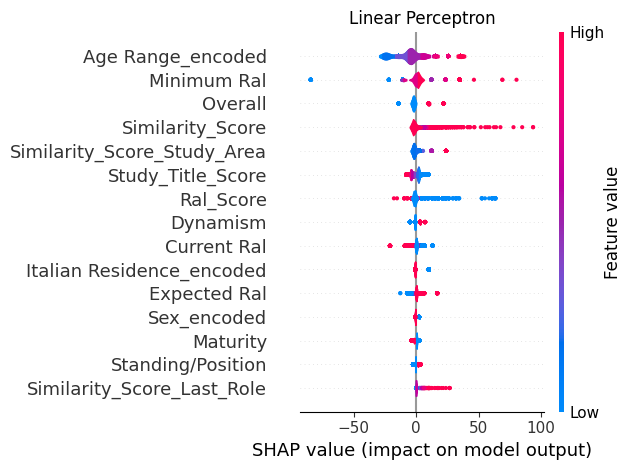

Skipping Neural Network 0 due to error: <class '__main__.CustomKerasClassifier'> is not currently a supported model type!
Skipping Neural Network 1 due to error: <class '__main__.CustomKerasClassifier'> is not currently a supported model type!
Skipping Neural Network 2 due to error: <class '__main__.CustomKerasClassifier'> is not currently a supported model type!


In [98]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for m in models:
      if m in ['Decision Tree', 'Gaussian Naive Bayes', 'Random forest', 'K Nearest Neighbor', 'AdaBoost' ]:
        continue
      try:
        if m in ['Logistic Regression', 'Gaussian Naive Bayes', 'Linear Perceptron', 'Random forest', 'K Nearest Neighbor']:
          summaryPlot(models[m], X_test_selected, plot_type='violin', plot_name=m)
        elif m in ['Neural Network 0', 'Neural Network 1', 'Neural Network 2', 'Best NN Random Search']:
          summaryPlot(models[m], X_test[:1000], plot_type='violin', plot_name=m)
        else:
          summaryPlot(models[m], X_test, plot_type='violin', plot_name=m)
      except Exception as e:
        print(f"Skipping {m} due to error: {e}")


## RAL influence on models

### Test Set 1

In [100]:
Ral_cols = [col for col in data_set.columns if 'Ral' in col]

In [102]:
data_set1 = data_set.copy()

for col in Ral_cols:
    ids = df[df[col] == 'not specified']['Id'].unique().tolist()
    values = data_set[col].unique().tolist()
    for id in ids:
        random.seed(random_seed)
        data_set1.loc[data_set1['Id'] == id, col] = random.choice(values)


In [103]:
data_set1 = shuffle(data_set1, random_state=random_state)
train_val_set1, test_set1 = train_test_split(data_set1, test_size=0.2, stratify=data_set[['Hired', 'Protected Category_encoded']], random_state=random_state)

X_test_1 = test_set.drop(columns=['Hired', 'Id'])
y_test_1 = test_set['Hired']
X_test_1_selected = X_test_1[selected_features]

In [104]:
predictions_1 = {}
for m in models.keys():
  if m in ['Logistic Regression', 'Gaussian Naive Bayes', 'Linear Perceptron', 'Random forest', 'K Nearest Neighbor']:
    predictions_1[m] = models[m].predict(X_test_1_selected)
  else:
    if m == 'Linear Regression':
      predictions_1[m] = (models[m].predict(X_test_1) > 0.5).astype(int)
    elif m in ['Neural Network 0', 'Neural Network 1', 'Neural Network 2']:
      predictions_1[m] = (models[m].predict(X_test_1) > 0.5).astype('int32')
    else:
      predictions_1[m] = models[m].predict(X_test_1)

132/132 [==============================] - 0s 2ms/step


In [105]:
combined_metrics1 = []
for m in predictions_1.keys():
  if m in ['Neural Network 0', 'Neural Network 1', 'Neural Network 2', 'Best NN Random Search']:
    calc_nn_metrics(predictions_1[m], y_test_1, combined_metrics1, m)
  else:
    cr = classification_report(y_test_1, y_pred, output_dict=True, zero_division=1)
    combined_metrics1.append({
        'model': m,
        'accuracy': cr['accuracy'],
        'precision': cr['macro avg']['precision'],
        'recall': cr['macro avg']['recall'],
        'f1_score': cr['macro avg']['f1-score'],
        'roc_auc': roc_auc_score(y_test, y_pred)
    })

combined_metrics1 = pd.DataFrame(combined_metrics1)
combined_metrics1

,model,accuracy,precision,recall,f1_score,roc_auc
0,Decision Tree,0.944444,0.748370,0.733218,0.740506,0.733218
1,Linear Regression,0.944444,0.748370,0.733218,0.740506,0.733218
2,Logistic Regression,0.944444,0.748370,0.733218,0.740506,0.733218
3,Gaussian Naive Bayes,0.944444,0.748370,0.733218,0.740506,0.733218
4,Random forest,0.944444,0.748370,0.733218,0.740506,0.733218
5,Linear Perceptron,0.944444,0.748370,0.733218,0.740506,0.733218
6,K Nearest Neighbor,0.944444,0.748370,0.733218,0.740506,0.733218
7,AdaBoost,0.944444,0.748370,0.733218,0.740506,0.733218
8,Neural Network 0,0.952517,0.786075,0.777368,0.781641,0.777368
9,Neural Network 1,0.954179,0.804282,0.742185,0.769091,0.742185


In [106]:
models_predictions_1 = {}

for m in predictions_1.keys():
  if m in ['Neural Network 0', 'Neural Network 1', 'Neural Network 2', 'Best NN Random Search']:
    models_predictions_1[m] = predictions_1[m].flatten()
  else:
    models_predictions_1[m] = predictions_1[m]

In [107]:
dp_df = getFairnessTab(calculate_demographic_parity,
               models=models,
               sensitive_features = sensitive_features,
               predictions= models_predictions_1,
               index=list(models.keys()),
               X_test=X_test_1,
               y_test = y_test_1,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=False
               )

dp_df

,Sex_encoded,Age Range_encoded,Italian Residence_encoded,European Residence_encoded,Protected Category_encoded
Decision Tree,,20 - 25 years,,,
Linear Regression,male,< 20 years,yes,european,
Logistic Regression,male,< 20 years,yes,european,
Gaussian Naive Bayes,,< 20 years,yes,european,
Random forest,,< 20 years,,,
Linear Perceptron,,< 20 years,yes,european,no
K Nearest Neighbor,,< 20 years,,,
AdaBoost,,20 - 25 years,,,
Neural Network 0,,< 20 years,,,
Neural Network 1,,< 20 years,,,


In [108]:
eo_df = getFairnessTab(calculate_equalized_odds,
               models=models,
               sensitive_features = sensitive_features,
               predictions= models_predictions_1,
               index=list(models.keys()),
               X_test=X_test_1,
               y_test = y_test_1,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=True
               )

eo_df

===============================UNFAIR!===============================
Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Age Range_encoded
Maximum TPR difference: 0.2372 between group < 20 years and group 26 - 30 years
Model unfair to: 26 - 30 years
TPR and FPR for each group:
Group < 20 years: TPR=0.7200, FPR=0.0174
Group 31 - 35 years: TPR=0.5854, FPR=0.0149
Group 26 - 30 years: TPR=0.4828, FPR=0.0137
Group 36 - 40 years: TPR=0.5556, FPR=0.0226
Group 20 - 25 years: TPR=0.6250, FPR=0.0109
Group > 45 years: TPR=0.6571, FPR=0.0251
Group 40 - 45 years: TPR=0.6250, FPR=0.0342


===============================UNFAIR!===============================
Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Italian Residence_encoded
Maximum TPR difference: 0.2445 between group yes and group no
Model unfair to: no
TPR and FPR for each group:
Group yes: TPR=0.5779, FPR=0.0160
Group no: TPR=0.3333, FPR=0.0340


===============================UNFAIR!==============

,Sex_encoded,Age Range_encoded,Italian Residence_encoded,European Residence_encoded,Protected Category_encoded
Decision Tree,,26 - 30 years [TPR],no [TPR],non-european [TPR],
Linear Regression,male [TPR],36 - 40 years [TPR],"no [TPR], yes [FPR]",non-european [TPR],
Logistic Regression,,20 - 25 years [TPR],"no [TPR], yes [FPR]","non-european [TPR], european [FPR]",yes [TPR]
Gaussian Naive Bayes,,31 - 35 years [TPR],no [TPR],non-european [TPR],
Random forest,,,no [TPR],non-european [TPR],
Linear Perceptron,,"20 - 25 years [TPR], < 20 years [FPR]",yes [TPR/FPR],european [TPR/FPR],no [TPR]
K Nearest Neighbor,,40 - 45 years [TPR],,,
AdaBoost,,20 - 25 years [TPR],no [TPR],non-european [TPR],yes [TPR]
Neural Network 0,,40 - 45 years [TPR],no [TPR],non-european [TPR],
Neural Network 1,,> 45 years [TPR],,,


In [109]:
getFairnessTab(
    calculate_counterfactual_fairness,
    models=models,
    sensitive_features= sensitive_features,
    predictions=models_predictions_1,
    index=list(models.keys()),
    X_test=X_test_1,
    y_test = y_test_1,
    significance_level=significance_level,
    tolerance=tolerance,
    verbose=True,
    X_test_selected = X_test_1_selected
)

Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Counterfactual Fairness on Sex_encoded
Counterfactual consistency: 0.9874
Most inconsistent group: female 0.0126
Most discriminated group: male -0.0007
Most privileged group: female 0.0126
Direction of bias (negative = worse, positive = better)


Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Counterfactual Fairness on Age Range_encoded
Counterfactual consistency: 1.0000
Most inconsistent group: < 20 years 0.0000
Most discriminated group: < 20 years 0.0000
Most privileged group: < 20 years 0.0000
Direction of bias (negative = worse, positive = better)


Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Counterfactual Fairness on Italian Residence_encoded
Counterfactual consistency: 1.0000
Most inconsistent group: yes 0.0000
Most discriminated group: yes 0.0000
Most privileged group: yes 0.0000
Direction of bias (negative = worse, positive = better)


Model DecisionTreeCla

,Sex_encoded,Age Range_encoded,Italian Residence_encoded,European Residence_encoded,Protected Category_encoded
Decision Tree,,,,,
Linear Regression,"male [-2.83%], female [12.25%]","< 20 years [-5.89%], > 45 years [10.61%]","yes [-0.59%], no [10.23%]",,"no [-0.05%], yes [20.3%]"
Logistic Regression,"male [-2.59%], female [12.32%]","< 20 years [-4.53%], > 45 years [6.74%]",,,
Gaussian Naive Bayes,,,"yes [-0.71%], no [11.8%]",,
Random forest,,,,,
Linear Perceptron,,"< 20 years [-26.54%], > 45 years [65.03%]","yes [-0.19%], no [15.22%]",,
K Nearest Neighbor,"male [-0.52%], female [7.88%]","< 20 years [-2.23%], 40 - 45 years [13.72%]","yes [0.19%], no [10.52%]",,
AdaBoost,,,,,
Neural Network 0,,,,,
Neural Network 1,,,,,


###Test Set 2

In [110]:
test_set2 = test_set.copy()
values = {col: data_set[col].unique().tolist() for col in Ral_cols}

for index, row in test_set2.iterrows():
    for col in Ral_cols:
        test_set2.loc[index, col] = np.random.choice(values[col])

In [111]:
X_test_2 = test_set2.drop(columns=['Hired', 'Id'])
y_test_2 = test_set2['Hired']
X_test_2_selected = X_test_2[selected_features]

In [112]:
predictions_2 = {}
for m in models.keys():
  if m in ['Logistic Regression', 'Gaussian Naive Bayes', 'Linear Perceptron', 'Random forest', 'K Nearest Neighbor']:
    predictions_2[m] = models[m].predict(X_test_2_selected)
  else:
    if m == 'Linear Regression':
      predictions_2[m] = (models[m].predict(X_test_2) > 0.5).astype(int)
    elif m in ['Neural Network 0', 'Neural Network 1', 'Neural Network 2']:
      predictions_2[m] = (models[m].predict(X_test_2) > 0.5).astype('int32')
    else:
      predictions_2[m] = models[m].predict(X_test_2)

132/132 [==============================] - 0s 2ms/step


In [113]:
combined_metrics2 = []
for m in predictions_2.keys():
  if m in ['Neural Network 0', 'Neural Network 1', 'Neural Network 2', 'Best NN Random Search']:
    calc_nn_metrics(predictions_2[m], y_test_2, combined_metrics2, m)
  else:
    cr = classification_report(y_test_2, y_pred, output_dict=True, zero_division=1)
    combined_metrics2.append({
        'model': m,
        'accuracy': cr['accuracy'],
        'precision': cr['macro avg']['precision'],
        'recall': cr['macro avg']['recall'],
        'f1_score': cr['macro avg']['f1-score'],
        'roc_auc': roc_auc_score(y_test, y_pred)
    })

combined_metrics2 = pd.DataFrame(combined_metrics2)
combined_metrics2.sort_values(by='recall', ascending=False)

,model,accuracy,precision,recall,f1_score,roc_auc
0,Decision Tree,0.944444,0.748370,0.733218,0.740506,0.733218
1,Linear Regression,0.944444,0.748370,0.733218,0.740506,0.733218
2,Logistic Regression,0.944444,0.748370,0.733218,0.740506,0.733218
3,Gaussian Naive Bayes,0.944444,0.748370,0.733218,0.740506,0.733218
4,Random forest,0.944444,0.748370,0.733218,0.740506,0.733218
5,Linear Perceptron,0.944444,0.748370,0.733218,0.740506,0.733218
6,K Nearest Neighbor,0.944444,0.748370,0.733218,0.740506,0.733218
7,AdaBoost,0.944444,0.748370,0.733218,0.740506,0.733218
10,Neural Network 2,0.314815,0.520477,0.573425,0.282187,0.573425
9,Neural Network 1,0.281814,0.521212,0.569184,0.258620,0.569184


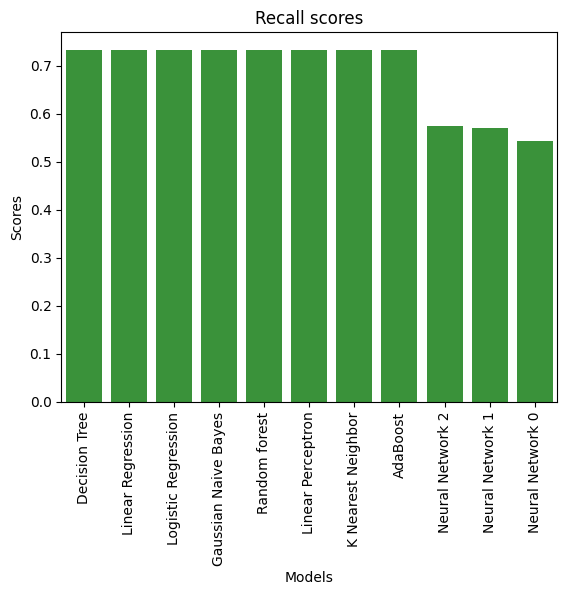

In [114]:
combined_metrics2 = combined_metrics2.sort_values(by='recall', ascending=False)
scores = combined_metrics2['recall']
models_plot= combined_metrics2['model']
sns.barplot(x=models_plot, y=scores, color=sns.palettes.color_palette()[2])

plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Recall scores')
plt.xticks(rotation=90)
plt.show()

In [115]:
models_predictions_2 = {}

for m in predictions_2.keys():
  if m in ['Neural Network 0', 'Neural Network 1', 'Neural Network 2', 'Best NN Random Search']:
    models_predictions_2[m] = predictions_2[m].flatten()
  else:
    models_predictions_2[m] = predictions_2[m]

In [ ]:
models

{'Decision Tree': DecisionTreeClassifier(max_depth=14, random_state=42),
 'Linear Regression': LinearRegression(),
 'Logistic Regression': LogisticRegression(C=100, class_weight='balanced', max_iter=500,
                    random_state=42),
 'Gaussian Naive Bayes': GaussianNB(var_smoothing=1e-05),
 'Random forest': RandomForestClassifier(max_depth=20, min_samples_leaf=2, n_estimators=200,
                        random_state=42),
 'Linear Perceptron': Perceptron(early_stopping=True, random_state=42),
 'K Nearest Neighbor': KNeighborsClassifier(metric='manhattan', n_neighbors=2, weights='distance'),
 'AdaBoost': AdaBoostClassifier(learning_rate=1.5, n_estimators=40, random_state=42),
 'Neural Network 0': <keras.src.engine.sequential.Sequential at 0x7d4bd1acc2d0>,
 'Neural Network 1': <keras.src.engine.sequential.Sequential at 0x7d4bd1ebf950>,
 'Neural Network 2': <keras.src.engine.sequential.Sequential at 0x7d4bc7ecc690>,
 'Best NN Random Search': CustomKerasClassifier(input_shape=(31,

In [116]:
dp_df = getFairnessTab(calculate_demographic_parity,
               models=models,
               sensitive_features = sensitive_features,
               predictions= models_predictions_2,
               index=list(models.keys()),
               X_test=X_test_2,
               y_test = y_test_2,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=False
               )

dp_df

,Sex_encoded,Age Range_encoded,Italian Residence_encoded,European Residence_encoded,Protected Category_encoded
Decision Tree,,20 - 25 years,,,
Linear Regression,male,< 20 years,yes,european,no
Logistic Regression,,< 20 years,yes,european,
Gaussian Naive Bayes,,,,,
Random forest,,> 45 years,,non-european,
Linear Perceptron,,< 20 years,yes,european,
K Nearest Neighbor,,< 20 years,,,
AdaBoost,male,< 20 years,yes,european,
Neural Network 0,,> 45 years,no,non-european,
Neural Network 1,male,> 45 years,no,non-european,


In [117]:
eo_df = getFairnessTab(calculate_equalized_odds,
               models=models,
               sensitive_features = sensitive_features,
               predictions= models_predictions_2,
               index=list(models.keys()),
               X_test=X_test_2,
               y_test = y_test_2,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=True
               )

eo_df

===============================UNFAIR!===============================
Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Italian Residence_encoded
Maximum TPR difference: 0.4781 between group yes and group no
Model unfair to: no
TPR and FPR for each group:
Group yes: TPR=0.8115, FPR=0.5820
Group no: TPR=0.3333, FPR=0.6463


===============================UNFAIR!===============================
Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt European Residence_encoded
Maximum TPR difference: 0.4781 between group european and group non-european
Model unfair to: non-european
TPR and FPR for each group:
Group european: TPR=0.8115, FPR=0.5828
Group non-european: TPR=0.3333, FPR=0.6465


===============================UNFAIR!===============================
Model LinearRegression() unfair wrt Protected Category_encoded
Maximum TPR difference: 0.2490 between group yes and group no
Model unfair to: no
TPR and FPR for each group:
Group no: TPR=0.7510, FP

,Sex_encoded,Age Range_encoded,Italian Residence_encoded,European Residence_encoded,Protected Category_encoded
Decision Tree,,,no [TPR],non-european [TPR],
Linear Regression,,,,,no [TPR]
Logistic Regression,,< 20 years [FPR],,,
Gaussian Naive Bayes,,,no [TPR],non-european [TPR],
Random forest,,,,,yes [TPR]
Linear Perceptron,,< 20 years [FPR],,,yes [TPR]
K Nearest Neighbor,,< 20 years [TPR],,,
AdaBoost,male [FPR],,"no [TPR], yes [FPR]","non-european [TPR], european [FPR]",
Neural Network 0,,36 - 40 years [TPR],no [TPR],non-european [TPR],
Neural Network 1,,> 45 years [TPR/FPR],no [TPR],non-european [TPR],


In [118]:
getFairnessTab(
    calculate_counterfactual_fairness,
    models=models,
    sensitive_features= sensitive_features,
    predictions=models_predictions_2,
    index=list(models.keys()),
    X_test=X_test_2,
    y_test = y_test_2,
    significance_level=significance_level,
    tolerance=tolerance,
    verbose=True,
    X_test_selected = X_test_2_selected
)

Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Counterfactual Fairness on Sex_encoded
Counterfactual consistency: 0.9981
Most inconsistent group: female 0.0019
Most discriminated group: male -0.0007
Most privileged group: female 0.0019
Direction of bias (negative = worse, positive = better)


Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Counterfactual Fairness on Age Range_encoded
Counterfactual consistency: 0.9789
Most inconsistent group: < 20 years -0.0207
Most discriminated group: < 20 years -0.0207
Most privileged group: 26 - 30 years 0.0066
Direction of bias (negative = worse, positive = better)


Model DecisionTreeClassifier(max_depth=14, random_state=42) unfair wrt Counterfactual Fairness on Italian Residence_encoded
Counterfactual consistency: 1.0000
Most inconsistent group: yes 0.0000
Most discriminated group: yes 0.0000
Most privileged group: yes 0.0000
Direction of bias (negative = worse, positive = better)


Model DecisionTr

,Sex_encoded,Age Range_encoded,Italian Residence_encoded,European Residence_encoded,Protected Category_encoded
Decision Tree,,,,,
Linear Regression,"male [-3.06%], female [11.94%]","< 20 years [-6.98%], > 45 years [10.61%]","yes [-0.36%], no [10.47%]",,"no [-0.12%], yes [17.47%]"
Logistic Regression,"male [-2.45%], female [8.33%]",,,,
Gaussian Naive Bayes,,,,,
Random forest,,,,,
Linear Perceptron,,"< 20 years [-11.56%], > 45 years [14.55%]",,,
K Nearest Neighbor,"male [-0.78%], female [4.23%]","< 20 years [-8.24%], 40 - 45 years [5.46%]",,,
AdaBoost,"male [-4.11%], female [17.0%]",,,,
Neural Network 0,,,,,
Neural Network 1,,,,,


##Adversarial Debiasing - DEMOGRAPHIC PARITY

In [203]:
epochs = 100
batch_size = 128
threshold = 0.5
logits = True

sensitive_features = ['Sex_encoded', 'Age Range_encoded', 'Italian Residence_encoded', 'Protected Category_encoded']
#sensitive_features = ['Age Range_encoded', 'Italian Residence_encoded', 'Protected Category_encoded']
output_dim = [X_train[col].unique().shape[0] for col in sensitive_features]
sensitive_f = [X_train[col] for col in sensitive_features]

In [204]:
def create_Main(neurons = 128, activation = 'relu',):
    model = Sequential([
            Input(shape=X_train.shape[1]),
            Dense(neurons, activation=activation),
            BatchNormalization(),
            Dropout(0.4),
            Dense(neurons, activation=activation),
            BatchNormalization(),
            Dropout(0.4),
            Dense(neurons//2, activation=activation),
            BatchNormalization(),
            Dense(1)
    ])
    return model

def create_adversary(output_dim):
  if output_dim == 2:
    adv = Sequential([
        Dense(128, input_dim=1, activation='relu'),
        BatchNormalization(),
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dense(1)
    ])
  else:
    adv = Sequential([
        Dense(128, input_dim=1, activation='relu'),
        BatchNormalization(),
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dense(output_dim, activation='sigmoid')
    ])
  return adv



In [205]:
def build_batched_data(X, y, sensitive_features, batch_size, names):
    Xb, yb, sens_f, X_adv_b = [], [], [], []
    for i in range(0, len(X), batch_size):
        Xb.append(X[i:i+batch_size])
        yb.append(y[i:i+batch_size])
    for i in range(len(sensitive_features)):
        temp1, temp2 = [], []
        X_adv = X.drop(names[i], axis=1)
        for j in range(0, len(X), batch_size):
            temp1.append(X_adv[j:j+batch_size])
            temp2.append(sensitive_features[i][j:j+batch_size])
        X_adv_b.append(temp1)
        sens_f.append(temp2)
    return Xb, yb, sens_f, X_adv_b

In [206]:
def train_nn(main, adv, X, y, sens_f, X_adv, epochs, adv_n, patience=3, print_step=10):
    best_loss = float('inf')
    patience_counter = 0

    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")

        epoch_loss = 0

        for i in range(len(X)):
            X_batch = tf.convert_to_tensor(X[i].values, dtype=tf.float32)
            y_batch = tf.convert_to_tensor(y[i].values, dtype=tf.float32)
            sens = tf.convert_to_tensor(sens_f[adv_n][i], dtype=tf.float32)

            with tf.GradientTape(persistent=True) as tape:
                main_preds = main(X_batch, training=True)
                loss_main = loss_fcn_main(y_batch, main_preds)
                adv_preds = adv[adv_n](tf.sigmoid(main_preds), training=True)
                loss_adversary = loss_fcn_adv[adv_n](sens, adv_preds, class_weight_dicts[adv_n])
                combined_loss = tf.subtract(loss_main, tf.multiply(0.5, loss_adversary))

            # update main model
            gradients_main = tape.gradient(combined_loss, main.trainable_variables)
            optimizerM.apply_gradients(zip(gradients_main, main.trainable_variables))

            # update adversary model
            gradients_adv = tape.gradient(loss_adversary, adv[adv_n].trainable_variables)
            optimizer_list[adv_n].apply_gradients(zip(gradients_adv, adv[adv_n].trainable_variables))

            del tape

            epoch_loss += combined_loss.numpy()

            if i % print_step == 0:
                print(f"Batch {i}/{len(X)} - Main Loss: {loss_main.numpy()}, Adversary Loss: {loss_adversary.numpy()}, Combined Loss: {combined_loss.numpy()}")


        epoch_loss /= len(X)
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"Patience {patience_counter}/{patience}")

        if patience_counter >= patience:
            print("Early stopping attivato!")
            break


In [207]:
def weighted_loss(y_true, y_pred, class_weight_dict):
    weights = []
    for y in y_true.numpy():
        y = int(y)
        if y in class_weight_dict:
            weights.append(class_weight_dict[y])
        else:
            print(f"Warning: Classe {y} non trovata in class_weight_dict. Verrà usato peso 1.")
            weights.append(1.0)

    weights = tf.convert_to_tensor(weights, dtype=tf.float32)
    if len(class_weight_dict.keys()) > 2:
      y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32), depth=len(class_weight_dict.keys()))
      loss = tf.keras.losses.categorical_crossentropy(y_true, y_pred)
    else:
      loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    return tf.reduce_mean(loss * weights)


In [208]:
loss_fcn_adv = []
class_weight_dicts = []
for sf in sensitive_features:
    unique_classes = np.sort(np.unique(X_train[sf]))
    class_weights = compute_class_weight('balanced', classes=unique_classes, y=X_train[sf])
    class_weight_dict = {int(unique_classes[i]): class_weights[i] for i in range(len(class_weights))}
    class_weight_dicts.append(class_weight_dict)
    loss_fcn_adv.append(weighted_loss)

In [209]:
#loss functions
loss_fcn_main = BinaryCrossentropy(from_logits=True)


#optimizers
#optimizerM = Adam(learning_rate=0.001)
optimizerM = tf.keras.optimizers.RMSprop(learning_rate=0.001)
optimizer_list = [Adam(learning_rate=0.0005) for _ in range(3)]

In [210]:
#main model
np.random.seed(85)
tf.random.set_seed(85)
main_model = create_Main(neurons = 512, activation='elu')
main_model.compile(optimizer=optimizerM, loss=loss_fcn_main, metrics=['f1_weighted'])

In [211]:

#adversary models
adversary_models = [create_adversary(output_dim=output_dim[i]) for i in range(3)]
for i, adv in enumerate(adversary_models):
    adv.compile(optimizer=Adam(learning_rate=0.0005), loss=loss_fcn_adv[i], metrics=[AUC()])

In [212]:
for adv in adversary_models:
    adv.build(input_shape=(None, X_train.shape[1]))

In [213]:
Xb, yb, sens_f, X_adv_b = build_batched_data(X_train, y_train, sensitive_f, batch_size, sensitive_features)

In [214]:
#initial adversary weights
weights = [adv.get_weights() for adv in adversary_models]

#training main model against each adversary
for j in range(3):
    print(f"\nTraining Main Model against Adversary {j}")
    train_nn(main_model, adversary_models, Xb, yb, sens_f, X_adv_b, epochs, adv_n=j, print_step=60)
    adversary_models[j].set_weights(weights[j])  #adversary weights reset


Training Main Model against Adversary 0
Epoch 1/100
Batch 0/82 - Main Loss: 0.9910210967063904, Adversary Loss: 4.623862266540527, Combined Loss: -1.3209099769592285
Batch 60/82 - Main Loss: 0.7646282911300659, Adversary Loss: 2.476511001586914, Combined Loss: -0.4736272096633911
Epoch 2/100
Batch 0/82 - Main Loss: 1.4232815504074097, Adversary Loss: 4.060450553894043, Combined Loss: -0.6069437265396118
Batch 60/82 - Main Loss: 0.7077752947807312, Adversary Loss: 1.63008451461792, Combined Loss: -0.10726696252822876
Patience 1/3
Epoch 3/100
Batch 0/82 - Main Loss: 0.7384160757064819, Adversary Loss: 1.9275227785110474, Combined Loss: -0.22534531354904175
Batch 60/82 - Main Loss: 0.642200231552124, Adversary Loss: 1.440089225769043, Combined Loss: -0.07784438133239746
Patience 2/3
Epoch 4/100
Batch 0/82 - Main Loss: 0.8764878511428833, Adversary Loss: 1.190707802772522, Combined Loss: 0.2811339497566223
Batch 60/82 - Main Loss: 0.5995993614196777, Adversary Loss: 0.6968246698379517, Co

In [215]:
main_predictions = []

y_pred = (main_model.predict(X_test) > 0.5).astype("int32").squeeze()
main_predictions.append(y_pred)

132/132 [==============================] - 1s 3ms/step


In [216]:

nn_metrics_main = []

calc_nn_metrics(main_predictions[0], y_test, nn_metrics_main, 'Neural Network Main')

nn_metrics_main = pd.DataFrame(nn_metrics_main)
nn_metrics_main

,model,accuracy,precision,recall,f1_score,roc_auc
0,Neural Network Main,0.933761,0.711489,0.767406,0.735347,0.767406


In [217]:

models_main = {}
models_main[f"Neural Network Main"] = main_model
predictions_main = {}
predictions_main[f"Neural Network Main"] = main_predictions[0].flatten()

In [218]:
getFairnessTab(calculate_demographic_parity,
               models=models_main,
               sensitive_features = sensitive_features,
               predictions= predictions_main,
               index=list(models_main.keys()),
               X_test=X_test,
               y_test = y_test,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=True
               )

===============================UNFAIR!===============================
Model <keras.src.engine.sequential.Sequential object at 0x7b3a15907450> unfair wrt Age Range_encoded
< 20 years: 0.0546218487394958
20 - 25 years: 0.04177545691906005
26 - 30 years: 0.06275902901124926
31 - 35 years: 0.1022530329289428
36 - 40 years: 0.12627986348122866
40 - 45 years: 0.14814814814814814
> 45 years: 0.09390862944162437
Model unfair to: 20 - 25 years




,Sex_encoded,Age Range_encoded,Italian Residence_encoded,Protected Category_encoded
Neural Network Main,,20 - 25 years,,


In [219]:
X_test.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

In [221]:
getFairnessTab(calculate_equalized_odds,
               models=models_main,
               sensitive_features = sensitive_features,
               predictions= predictions_main,
               index=list(models_main.keys()),
               X_test=X_test,
               y_test = y_test,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=True
               )

===============================UNFAIR!===============================
Model <keras.src.engine.sequential.Sequential object at 0x7b3a15907450> unfair wrt Italian Residence_encoded
Maximum TPR difference: 0.2486 between group yes and group no
Model unfair to: no
TPR and FPR for each group:
Group yes: TPR=0.5820, FPR=0.0427
Group no: TPR=0.3333, FPR=0.0816




,Sex_encoded,Age Range_encoded,Italian Residence_encoded,Protected Category_encoded
Neural Network Main,,,no [TPR=0.3333333333333333],


In [222]:
getFairnessTab(calculate_counterfactual_fairness,
               models=models_main,
               sensitive_features = sensitive_features,
               predictions= predictions_main,
               index=list(models_main.keys()),
               X_test=X_test,
               y_test = y_test,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=True
               )

132/132 [==============================] - 0s 3ms/step
===============================UNFAIR!===============================
Model <keras.src.engine.sequential.Sequential object at 0x7b3a15907450> unfair wrt Counterfactual Fairness on Sex_encoded
Counterfactual consistency: 0.8203
Most inconsistent group: female 0.0472
Most discriminated group: male -0.0097
Most privileged group: female 0.0472
Direction of bias (negative = worse, positive = better)


132/132 [==============================] - 0s 2ms/step
===============================UNFAIR!===============================
Model <keras.src.engine.sequential.Sequential object at 0x7b3a15907450> unfair wrt Counterfactual Fairness on Age Range_encoded
Counterfactual consistency: 0.7808
Most inconsistent group: > 45 years 0.0938
Most discriminated group: < 20 years -0.0121
Most privileged group: > 45 years 0.0938
Direction of bias (negative = worse, positive = better)


132/132 [==============================] - 0s 2ms/step
===============

,Sex_encoded,Age Range_encoded,Italian Residence_encoded,Protected Category_encoded
Neural Network Main,"male [-0.97%], female [4.72%]","< 20 years [-1.21%], > 45 years [9.38%]","yes [0.09%], no [7.67%]","no [-0.02%], yes [4.44%]"


/usr/local/lib/python3.11/dist-packages/keras/src/backend.py:452: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn(


shap shape: (1000, 31)


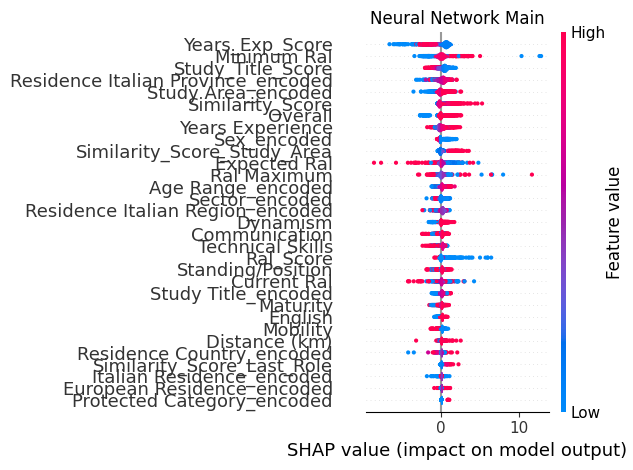

In [224]:
summaryPlot(main_model, X_test[:1000], plot_type='violin', plot_name='Neural Network Main')

##Adversarial Debiasing - EQUALIZED ODDS

In [183]:
epochs = 100
batch_size = 128
threshold = 0.5
logits = True

sensitive_features = ['Sex_encoded', 'Age Range_encoded', 'Italian Residence_encoded', 'Protected Category_encoded']
#sensitive_features = ['Age Range_encoded', 'Italian Residence_encoded', 'Protected Category_encoded']
output_dim = [X_train[col].unique().shape[0] for col in sensitive_features]
sensitive_f = [X_train[col] for col in sensitive_features]

In [184]:
def create_Main(neurons = 128, activation = 'relu',):
    model = Sequential([
            Input(shape=X_train.shape[1]),
            Dense(neurons, activation=activation),
            BatchNormalization(),
            Dropout(0.4),
            Dense(neurons, activation=activation),
            BatchNormalization(),
            Dropout(0.4),
            Dense(neurons//2, activation=activation),
            BatchNormalization(),
            Dense(1)
    ])
    return model

def create_adversary(output_dim):
  if output_dim == 2:
    adv = Sequential([
        Dense(128, input_dim=1, activation='relu'),
        BatchNormalization(),
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dense(1)
    ])
  else:
    adv = Sequential([
        Dense(128, input_dim=1, activation='relu'),
        BatchNormalization(),
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dense(output_dim, activation='sigmoid')
    ])
  return adv


In [185]:
def build_batched_data(X, y, sensitive_features, batch_size, names):
    Xb, yb, sens_f, X_adv_b = [], [], [], []
    for i in range(0, len(X), batch_size):
        Xb.append(X[i:i+batch_size])
        yb.append(y[i:i+batch_size])
    for i in range(len(sensitive_features)):
        temp1, temp2 = [], []
        X_adv = X.drop(names[i], axis=1)
        for j in range(0, len(X), batch_size):
            temp1.append(X_adv[j:j+batch_size])
            temp2.append(sensitive_features[i][j:j+batch_size])
        X_adv_b.append(temp1)
        sens_f.append(temp2)
    return Xb, yb, sens_f, X_adv_b

In [186]:
def equalized_odds_penalty(y_true, y_pred, sensitive_group):
    sensitive_group = tf.reshape(sensitive_group, [-1])
    y_pred = tf.reshape(tf.round(tf.sigmoid(y_pred))  , [-1])
    y_true = tf.reshape(y_true, [-1])
    df = pd.DataFrame({
          'predictions': y_pred,
          'true_labels': y_true,
          'sensitive_attribute': sensitive_group
      })

    groups = df['sensitive_attribute'].unique()
    metrics = {}
    for group in groups:
        group_df = df[df['sensitive_attribute'] == group]
        cm = confusion_matrix(group_df['true_labels'], group_df['predictions'], labels=[0, 1])
        tn, fp, fn, tp = cm.ravel()
        tpr = tp / (tp + fn) if tp + fn != 0 else 0
        fpr = fp / (fp + tn) if fp + tn != 0 else 0
        metrics[group] = {'TPR': tpr, 'FPR': fpr}

    tprs = [metrics[group]['TPR'] for group in groups]
    fprs = [metrics[group]['FPR'] for group in groups]

    max_tpr_diff = max(tprs) - min(tprs)
    max_fpr_diff = max(fprs) - min(fprs)

    penalty = max(max_tpr_diff, max_fpr_diff)
    return penalty

In [187]:
def train_nn(main, adv, X, y, sens_f, X_adv, epochs, adv_n, patience=5, print_step=10):
    best_loss = float('inf')
    patience_counter = 0

    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")

        epoch_loss = 0

        for i in range(len(X)):
            X_batch = tf.convert_to_tensor(X[i].values, dtype=tf.float32)
            y_batch = tf.convert_to_tensor(y[i].values, dtype=tf.float32)
            sens = tf.convert_to_tensor(sens_f[adv_n][i], dtype=tf.float32)

            with tf.GradientTape(persistent=True) as tape:
                main_preds = main(X_batch, training=True)
                main_preds_float32 = tf.cast(main_preds, tf.float32)
                loss_main = loss_fcn_main(y_batch, main_preds_float32)
                adv_preds = adv[adv_n](tf.sigmoid(main_preds_float32), training=True)
                loss_adversary = loss_fcn_adv[adv_n](sens, adv_preds, class_weight_dicts[adv_n])
                sensitive_group = tf.gather(X_batch, X_train.columns.get_loc(sensitive_features[adv_n]), axis=1)
                loss_eq_odds = equalized_odds_penalty(y_batch,main_preds_float32, sensitive_group)
                combined_loss = tf.subtract(loss_main, tf.multiply(0.5, loss_adversary))
                combined_loss = tf.add(combined_loss, tf.multiply(1, tf.cast(loss_eq_odds, tf.float32) ))


            # update main model
            gradients_main = tape.gradient(combined_loss, main.trainable_variables)
            optimizerM.apply_gradients(zip(gradients_main, main.trainable_variables))

            # update adversary model
            gradients_adv = tape.gradient(loss_adversary, adv[adv_n].trainable_variables)
            optimizer_list[adv_n].apply_gradients(zip(gradients_adv, adv[adv_n].trainable_variables))

            del tape

            epoch_loss += combined_loss.numpy()

            if i % print_step == 0:
                print(f"Batch {i}/{len(X)} - Main Loss: {loss_main.numpy()}, Adversary Loss: {loss_adversary.numpy()}, Combined Loss: {combined_loss.numpy()}")


        epoch_loss /= len(X)
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"Patience {patience_counter}/{patience}")

        if patience_counter >= patience:
            print("Early stopping attivato!")
            break


In [188]:
def weighted_loss(y_true, y_pred, class_weight_dict):
    weights = []
    for y in y_true.numpy():
        y = int(y)
        if y in class_weight_dict:
            weights.append(class_weight_dict[y])
        else:
            print(f"Warning: Classe {y} non trovata in class_weight_dict. Verrà usato peso 1.")
            weights.append(1.0)

    weights = tf.convert_to_tensor(weights, dtype=tf.float32)
    if len(class_weight_dict.keys()) > 2:
      y_true = tf.one_hot(tf.cast(y_true, dtype=tf.int32), depth=len(class_weight_dict.keys()))
      loss = tf.keras.losses.categorical_crossentropy(y_true, y_pred)
    else:
      loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    return tf.reduce_mean(loss * weights)


In [189]:
loss_fcn_adv = []
class_weight_dicts = []
for sf in sensitive_features:
    unique_classes = np.sort(np.unique(X_train[sf]))
    class_weights = compute_class_weight('balanced', classes=unique_classes, y=X_train[sf])
    class_weight_dict = {int(unique_classes[i]): class_weights[i] for i in range(len(class_weights))}
    class_weight_dicts.append(class_weight_dict)
    loss_fcn_adv.append(weighted_loss)

In [190]:
#loss functions
loss_fcn_main = BinaryCrossentropy(from_logits=True)

#optimizers
#optimizerM = Adam(learning_rate=0.001)
optimizerM = tf.keras.optimizers.RMSprop(learning_rate=0.001)
optimizer_list = [Adam(learning_rate=0.0005) for _ in range(len(sensitive_features))]

In [191]:
#main model
np.random.seed(85)
tf.random.set_seed(85)
main_model = create_Main(neurons = 512, activation='elu')
main_model.compile(optimizer=optimizerM, loss=loss_fcn_main, metrics=['f1_weighted'])

In [192]:
#adversary models
adversary_models = [create_adversary(output_dim=output_dim[i]) for i in range(len(sensitive_features))]
for i, adv in enumerate(adversary_models):
    adv.compile(optimizer=Adam(learning_rate=0.0005), loss=loss_fcn_adv[i], metrics=[AUC()])

In [193]:
for adv in adversary_models:
    adv.build(input_shape=(None, X_train.shape[1]))

In [194]:
Xb, yb, sens_f, X_adv_b = build_batched_data(X_train, y_train, sensitive_f, batch_size, sensitive_features)

In [195]:
#initial adversary weights
weights = [adv.get_weights() for adv in adversary_models]

#training main model against each adversary
for j in range(len(sensitive_features)):
    print(f"\nTraining Main Model against Adversary {j}")
    train_nn(main_model, adversary_models, Xb, yb, sens_f, X_adv_b, epochs, adv_n=j, print_step=60)
    adversary_models[j].set_weights(weights[j])  #adversary weights reset


Training Main Model against Adversary 0
Epoch 1/100
Batch 0/82 - Main Loss: 0.8428741693496704, Adversary Loss: 6.49102783203125, Combined Loss: -2.1632914543151855
Batch 60/82 - Main Loss: 0.8910778760910034, Adversary Loss: 4.171205520629883, Combined Loss: -1.1817044019699097
Epoch 2/100
Batch 0/82 - Main Loss: 0.9045513868331909, Adversary Loss: 4.257435321807861, Combined Loss: -1.0190380811691284
Batch 60/82 - Main Loss: 0.6581453084945679, Adversary Loss: 3.047741651535034, Combined Loss: -0.7355368137359619
Patience 1/5
Epoch 3/100
Batch 0/82 - Main Loss: 0.6989955306053162, Adversary Loss: 1.803866982460022, Combined Loss: 0.05896681547164917
Batch 60/82 - Main Loss: 0.5817650556564331, Adversary Loss: 0.6476135849952698, Combined Loss: 0.33488133549690247
Patience 2/5
Epoch 4/100
Batch 0/82 - Main Loss: 0.6007513999938965, Adversary Loss: 0.6080703735351562, Combined Loss: 0.41210082173347473
Batch 60/82 - Main Loss: 0.5265047550201416, Adversary Loss: 0.6531580090522766, Co

In [196]:
main_predictions = []

y_pred = (main_model.predict(X_test) > 0.5).astype("int32").squeeze()
main_predictions.append(y_pred)

132/132 [==============================] - 0s 2ms/step


In [197]:

nn_metrics_main = []

calc_nn_metrics(main_predictions[0], y_test, nn_metrics_main, 'Neural Network Main')

nn_metrics_main = pd.DataFrame(nn_metrics_main)
nn_metrics_main

,model,accuracy,precision,recall,f1_score,roc_auc
0,Neural Network Main,0.938272,0.727178,0.783089,0.751326,0.783089


In [198]:

models_main = {}
models_main[f"Neural Network Main"] = main_model
predictions_main = {}
predictions_main[f"Neural Network Main"] = main_predictions[0].flatten()

In [200]:
getFairnessTab(calculate_demographic_parity,
               models=models_main,
               sensitive_features = sensitive_features,
               predictions= predictions_main,
               index=list(models_main.keys()),
               X_test=X_test,
               y_test = y_test,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=True
               )

===============================UNFAIR!===============================
Model <keras.src.engine.sequential.Sequential object at 0x7b3a138e8d50> unfair wrt Age Range_encoded
< 20 years: 0.0392156862745098
20 - 25 years: 0.04699738903394256
26 - 30 years: 0.06512729425695678
31 - 35 years: 0.12131715771230503
36 - 40 years: 0.12627986348122866
40 - 45 years: 0.12962962962962962
> 45 years: 0.07360406091370558
Model unfair to: < 20 years


===============================UNFAIR!===============================
Model <keras.src.engine.sequential.Sequential object at 0x7b3a138e8d50> unfair wrt Protected Category_encoded
no: 0.07332218772390733
yes: 0.24
Model unfair to: no




,Sex_encoded,Age Range_encoded,Italian Residence_encoded,Protected Category_encoded
Neural Network Main,,< 20 years,,no


In [201]:
getFairnessTab(calculate_equalized_odds,
               models=models_main,
               sensitive_features = sensitive_features,
               predictions= predictions_main,
               index=list(models_main.keys()),
               X_test=X_test,
               y_test = y_test,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=True
               )

===============================UNFAIR!===============================
Model <keras.src.engine.sequential.Sequential object at 0x7b3a138e8d50> unfair wrt Italian Residence_encoded
Maximum TPR difference: 0.2773 between group yes and group no
Model unfair to: no
TPR and FPR for each group:
Group yes: TPR=0.6107, FPR=0.0401
Group no: TPR=0.3333, FPR=0.0680




,Sex_encoded,Age Range_encoded,Italian Residence_encoded,Protected Category_encoded
Neural Network Main,,,no [TPR],


In [202]:

getFairnessTab(calculate_counterfactual_fairness,
               models=models_main,
               sensitive_features = sensitive_features,
               predictions= predictions_main,
               index=list(models_main.keys()),
               X_test=X_test,
               y_test = y_test,
               significance_level=significance_level,
               tolerance=tolerance,
               verbose=True
               )

132/132 [==============================] - 1s 5ms/step
===============================UNFAIR!===============================
Model <keras.src.engine.sequential.Sequential object at 0x7b3a138e8d50> unfair wrt Counterfactual Fairness on Sex_encoded
Counterfactual consistency: 0.8327
Most inconsistent group: female 0.0349
Most discriminated group: male -0.0050
Most privileged group: female 0.0349
Direction of bias (negative = worse, positive = better)


132/132 [==============================] - 0s 3ms/step
===============================UNFAIR!===============================
Model <keras.src.engine.sequential.Sequential object at 0x7b3a138e8d50> unfair wrt Counterfactual Fairness on Age Range_encoded
Counterfactual consistency: 0.7494
Most inconsistent group: > 45 years 0.1327
Most discriminated group: < 20 years -0.0240
Most privileged group: > 45 years 0.1327
Direction of bias (negative = worse, positive = better)


132/132 [==============================] - 1s 4ms/step
===============

,Sex_encoded,Age Range_encoded,Italian Residence_encoded,Protected Category_encoded
Neural Network Main,"male [-0.5%], female [3.49%]","< 20 years [-2.4%], > 45 years [13.27%]","yes [0.09%], no [14.72%]","no [-0.07%], yes [6.67%]"
